In [7]:
import numpy as np
import scipy as sp
from astropy.io import fits
from astropy.table import Table
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
from mpl_toolkits.axes_grid1 import make_axes_locatable
from scipy.stats import multivariate_normal
import scipy
# import spextra as sp

from scopesim_templates.extragalactic import galaxy
from scopesim_templates.extragalactic import galaxy3d
from scopesim_templates.extragalactic import spiral_two_component
from scopesim_templates.extragalactic import elliptical
from scopesim_templates.misc import point_source
from scopesim_templates.stellar import star,clusters
from scopesim_templates.stellar import stars
from scopesim_templates.calibration import empty_sky
import os
import astropy.units as u 
from astropy.io.fits import Header
import yaml
from astropy.io import fits
from astropy.visualization import simple_norm, MinMaxInterval, SqrtStretch, ImageNormalize
import random as r

import sys 
sys.path.append("../scripts")
import GalaxySN as gsn
import fitsFunctions as ff
import SNR as snr
import Strehl as st


import scopesim as sim

#always ensure this has the correct relative path to inst_pkgs
sim.rc.__config__["!SIM.file.local_packages_path"] = "..\inst_pkgs\\"
yaml_dicts = []
with open("..\inst_pkgs\MICADO\default.yaml") as f:
    yaml_dicts += [dic for dic in yaml.full_load_all(f)]
mspec = yaml_dicts

In [2]:
def makeFits(sed="sne/sn1a", amp=18, filt_cur="Ks", xcoord=0, ycoord=0, exposure_time=1000, fov="IMG_4mas", AOsystem="SCAO", airmass=1.2, fw1="open", fw2="Ks", humidity=0.1, temp=7, pressure=0.755):
    argnames = ["sed", "amp", "filt_cur", "xcoord", "ycoord", "exposure_time", "fov", "AOsystem", "airmass", "fw1", "fw2", "humidity", "temp", "pressure"]
    defaults = ["sne/sn1a", 18, "Ks", 0, 0, 1000, "IMG_4mas", "SCAO", 1.2, "open", "Ks", 0.1, 7, 0.755]
    vals = [sed, amp, filt_cur, xcoord, ycoord, exposure_time, fov, AOsystem, airmass, fw1, fw2, humidity, temp, pressure]
    #checkvalsindex = [0, 3, 4, 8, 9, 10, 11, 12, 13] # index values of args that would be appended to file name if they differ from defaults 
    checkvalsindex = [0, 3, 4, 8, 11, 12, 13]

    source = point_source(sed, amp, filt_cur, xcoord, ycoord)
    file_name = f"point{amp}_{filt_cur}_{fov}_{AOsystem}_espt{exposure_time}"

    for x in checkvalsindex:
        if vals[x] != defaults[x]:
            file_name += f"_{argnames[x]}_{vals[x]}"
           
    emptysky = empty_sky()
    sky_file_name = file_name + f"_sky" 
    
    cmds = sim.UserCommands(use_instrument="MICADO",
                    set_modes=[AOsystem,fov],  
                    properties={"!OBS.dit": exposure_time,
                                "!OBS.airmass": airmass,
                                "!OBS.filter_name_fw1": fw1,
                                "!OBS.filter_name_fw2": fw2,
                                "!ATMO.humidity" : humidity,
                                "!ATMO.temperature" : temp,
                                "!ATMO.pressure" : pressure
                                })
    micado = sim.OpticalTrain(cmds)
    micado.observe(source)
    hdus = micado.readout(filename=f"../fitsOutput/{file_name}.fits")

    micado.observe(emptysky)
    hdussky = micado.readout(filename=f"../fitsOutput/{sky_file_name}.fits")
    
    for i in range(len(source.spectra)):
        try:
            os.remove(f"../fitsOutput/spec{i}_{file_name}.fits")
        except:
            pass  
        source.spectra[i].to_fits(f"../fitsOutput/spec{i}_{file_name}.fits", wavelengths=None, flux_unit=None, area=None, vegaspec=None)

    return file_name

In [3]:
#utils

def plot_img_and_spec(file_discriminator, image_cmap = "magma"):
    # image = None
    with fits.open(f'../fitsOutput/{file_discriminator}.fits') as file:

        image = file[1].data.copy()
        file.close()


    with fits.open(f'../fitsOutput/spec_{file_discriminator}.fits') as file:

        spectra = file[1].data.copy()
        file.close()

    wavelength = np.array(list(spectra))[0:,0]
    amplitude = np.array(list(spectra))[0:,1]

    fig, (ax1, ax2) = plt.subplots(2,1, figsize=(8,15))
    im = ax1.imshow(image,cmap=image_cmap,vmin=0)
    plt.colorbar(im, ax=ax1)
    ax2.plot(wavelength, amplitude)
    plt.xlim(1000,10000)
    plt.show() 
    

def plot_spec(file_discriminator):

    with fits.open(f'../fitsOutput/spec_{file_discriminator}.fits') as file:

        spectra = file[1].data.copy()
        file.close()

    wavelength = np.array(list(spectra))[0:,0]
    amplitude = np.array(list(spectra))[0:,1]

    fig, ax = plt.subplots(1,1, figsize=(10,10))
    ax.plot(wavelength, amplitude)
    plt.xlabel("Wavelength (Angstrom)")
    plt.xlim(1000,10000)
    plt.show() 

def plot_spec_set(specfiles, labels):

    fig, ax = plt.subplots(1,1, figsize=(10,10))
    plt.xlabel("Wavelength (Angstrom)")
    plt.xlim(1000,10000)
    wavelength = []
    amplitude = []
    wavelist = []
    amplist = []
    for i in range(len(specfiles)):
        with fits.open(f'../fitsOutput/spec_{specfiles[i]}.fits') as file:
            spectra = file[1].data.copy()
            file.close()

        wavelength = list(np.array(list(spectra))[0:,0])
        amplitude = list(np.array(list(spectra))[0:,1])
        wavelist.append(wavelength)
        amplist.append(amplitude)

        ax.plot(wavelist[i], amplist[i], label=labels[i], linestyle = (i, (1, len(specfiles))), linewidth = 2)
    
    plt.legend()
    plt.show()

def plot_spec_subtraction(spec1,spec2):
    with fits.open(f'../fitsOutput/spec_{spec1}.fits') as file:
        spectra1 = file[1].data.copy()
        file.close()

    with fits.open(f'../fitsOutput/spec_{spec2}.fits') as file2:
        spectra2 = file2[1].data.copy()
        file2.close()

    wavelength1 = list(np.array(list(spectra1))[0:,0])
    amplitude1 = list(np.array(list(spectra1))[0:,1])
    wavelength2 = list(np.array(list(spectra2))[0:,0])
    amplitude2 = list(np.array(list(spectra2))[0:,1])
    ampdiff = []
    d = 0

    if wavelength1[0]==wavelength2[0] and wavelength1[-1]==wavelength2[-1]:
        for i in range(len(amplitude1)):
            d = amplitude1[i] - amplitude2[i]
            ampdiff.append(d)
    else:
        print("wavelength lists don't match")

    fig, ax = plt.subplots(1,1, figsize=(10,10))
    ax.plot(wavelength1, ampdiff, label="difference")
    ax.plot(wavelength1, amplitude1, label = "spec1")
    ax.plot(wavelength1, amplitude2, label = "spec2")
    plt.xlabel("Wavelength (Angstrom)")
    plt.xlim(1000,10000)
    plt.legend()
    plt.show() 

    
def plot_img(file_discriminator, image_cmap = "magma", title=" ", xlabel = "pixels"):
    
    with fits.open(f'../fitsOutput/{file_discriminator}.fits') as file:

        image = file[1].data.copy()
        file.close()

    fig, ax = plt.subplots(1,1, figsize=(20,10))
    im = ax.imshow(image,cmap=image_cmap,vmin=0,vmax=150000)
    
    plt.plot()
    plt.colorbar(im, ax=ax)
    plt.title(title, fontsize = 20)
    plt.xlabel(xlabel)
    plt.show() 
    
    print(len(image),len(image[0]))
    return image

def reduce(unreduced,sky):
    """
    Subtract a sky HDU from a full image HDU
    """
    with fits.open(f'../fitsOutput/{unreduced}.fits') as file:
        image1 = file[1].data.copy()
        file.close()
        
    with fits.open(f'../fitsOutput/{sky}.fits') as file:
        sky = file[1].data.copy()
        file.close()

    reducedarr = np.zeros((len(sky),len(sky)))
    for i in range(len(image1)):
        for j in range(len(image1[0])):
            reducedarr[i][j] = image1[i][j] - sky[i][j]

    #fig, ax = plt.subplots(1,1, figsize=(20,10))
    #im = ax.imshow(reducedarr,cmap="magma",vmin=0)
    #ax.plot(np.array(range(361,661)), np.ones(300)*511, linewidth=0.5, color = 'lime')
    #plt.vlines(512, 361, 661, color = 'orange', linewidth=0.5)
    
    #plt.plot()
    #plt.colorbar(im, ax=ax)
    #plt.title(title, fontsize = 20)
    #plt.xlabel(xlabel)
    
    #plt.show() 

    return reducedarr 

def reduce_and_plot(unreduced,sky, photofilter, AO, pixscale, galmag, novamag, xlabel = "mas"):
    with fits.open(f'../fitsOutput/{unreduced}.fits') as file:
        image1 = file[1].data.copy()
        file.close()
        
    with fits.open(f'../fitsOutput/{sky}.fits') as file:
        sky = file[1].data.copy()
        file.close()

    reducedarr = np.zeros((len(sky),len(sky)))
    for i in range(len(image1)):
        for j in range(len(image1[0])):
            reducedarr[i][j] = image1[i][j] - sky[i][j]

    fig, ax = plt.subplots(1,1, figsize=(20,10))
    im = ax.imshow(reducedarr,cmap="magma",vmin=0)
    #ax.plot(np.array(range(361,661)), np.ones(300)*511, linewidth=0.5, color = 'lime')
    #plt.vlines(512, 361, 661, color = 'orange', linewidth=0.5)
    plt.colorbar(im, ax=ax)
    plt.title(f"Filter = {photofilter}, supernova magnitude = {novamag}, galaxy magnitude = {galmag}, \n AO system = {AO}, pixel scale = {pixscale}", fontsize = 20)
    plt.xlabel(xlabel)
    plt.show()

    return reducedarr 

def reduce_and_plot_log(unreduced,sky, photofilter, AO, pixscale, galmag, novamag, xlabel = "mas"):
    with fits.open(f'../fitsOutput/{unreduced}.fits') as file:
        image1 = file[1].data.copy()
        file.close()
        
    with fits.open(f'../fitsOutput/{sky}.fits') as file:
        sky = file[1].data.copy()
        file.close()

    reducedarr = np.zeros((len(sky),len(sky)))
    for i in range(len(image1)):
        for j in range(len(image1[0])):
            reducedarr[i][j] = image1[i][j] - sky[i][j]

    const = abs(reducedarr.min()) 

    for i in range(len(image1[0])):
        for j in range(len(image1[0])):
            reducedarr[i][j] += const

    fig, ax = plt.subplots(1,1, figsize=(20,10))
    im = ax.imshow(np.log10(reducedarr),cmap="magma")
    #ax.plot(np.array(range(361,661)), np.ones(300)*511, linewidth=0.5, color = 'lime')
    #plt.vlines(512, 361, 661, color = 'orange', linewidth=0.5)
    plt.colorbar(im, ax=ax)
    plt.title(f"Filter = {photofilter}, supernova magnitude = {novamag}, galaxy magnitude = {galmag}, \n AO system = {AO}, pixel scale = {pixscale}", fontsize = 20)
    plt.xlabel(xlabel)
    plt.show()

    return reducedarr 


def intensity_1D(file_discriminator, y0, x0, R, unit): #unit variable is a string, "pixels", "4mas", or "1.5mas", coordinates and R are given as pixels in the frame, or mas with 0,0 at the center
    #with fits.open(f'../fitsOutput/{file_discriminator}.fits') as file: #use this if function is given a fits file name and not an array 

    #    image = file[1].data.copy()
    image = file_discriminator # use this line if the function is given an array instead of a fits file name 
    
    calculate = False
    if unit == "pixels":
        calculate = True
    elif unit == "4mas":
        x0 = int(512 + 250 * x0)
        y0 = int(512 + 250 * y0)
        R = int(R*250)
        calculate = True
    elif unit == "1.5mas":
        x0 = int(511 + 665 * x0)
        y0 = int(511 + 665 * y0)
        R = int(R*665)
        calculate  = True
    else:
        print("invalid input, need unit type")

    if calculate == True:
        limitlist = [R,y0,x0,len(image)-x0,len(image)-y0]
        R2 = min(limitlist)

        ymax = y0+R2
        ymin = y0-R2
        xmax = x0+R2
        xmin = x0-R2
        xlist = image[y0,xmin:xmax]
        ylist = image[ymin:ymax,x0]
    #print("x0 = ", x0, " y0 = ", y0, " R = ", R2)
    return xlist, ylist 

def FWHM(vals):
    peak = max(vals)
    end = min(vals)
    mid = (peak + end)/2
    midlist = []
    count = 0
    while len(midlist) == 0:
        if vals[count] >= mid:
            midlist.append(count)
        count += 1

    count = len(vals) -1
    while len(midlist) == 1:
        if vals[count] >= mid:
            midlist.append(count)
        count -= 1

    diff = midlist[1] - midlist[0] +1

    #print("peak is ", peak, ", min is ", end, ", peak range is ", midlist)
    if diff > len(vals)/2:
        return "none"
    else:
        return diff

def PSF_FWHM_set(nameset, pointcoordy, pointcoordx, radius, coordtype):
    hPSFset = []
    vPSFset = []
    hFWHMset = []
    vFWHMset = []
    skyname = None
    if type(pointcoordy) is int and type(pointcoordx) is int:
        for x in range(len(nameset)):
            skyname = nameset[x] + f"_sky"
            reducedarry = reduce(nameset[x], skyname) 
            hPSF, vPSF = intensity_1D(reducedarry, pointcoordy, pointcoordx, radius, coordtype)
            hPSFset.append(hPSF)
            vPSFset.append(vPSF)
            hFWHMset.append(FWHM(hPSF))
            vFWHMset.append(FWHM(vPSF))
    namecount = 0
    if type(pointcoordy) is list and type(pointcoordx) is list:
        for x in pointcoordx:
            for y in pointcoordy:
                skyname = nameset[namecount] +f"_sky"
                reducedarry = reduce(nameset[namecount], skyname)
                hPSF,vPSF = intensity_1D(reducedarry, y, x, radius, coordtype)
                hPSFset.append(hPSF)
                vPSFset.append(vPSF)
                hFWHMset.append(FWHM(hPSF))
                vFWHMset.append(FWHM(vPSF))
                namecount +=1

    return hPSFset, vPSFset, hFWHMset, vFWHMset 

def plot_PSFs(PSFset, paramname, paramvals, HorV, photoband, AOsystem, fov, exposure_time):
    plt.figure(figsize=[11,6])
    FWHMval = 0
    for i in range(len(PSFset)):
        FWHMval = FWHM(PSFset[i])
        #plt.scatter(range(0,len(PSFset[i])), PSFset[i], label=f"{paramname} = {round(paramvals[i],1)}",s=3)
        peakval = round(max(PSFset[i]))
        plt.plot(range(0,len(PSFset[i])), PSFset[i], alpha = 0.5, label=f"{paramname} = {paramvals[i]}, exposure time = {exposure_time[i]}s,\n FWHM = {FWHMval}, peak = {peakval}")
    plt.xlabel("pixels")
    if HorV == "H" or HorV == "h":
        plt.title(f"Horizontal cross-section of PSF, Photometric Filter = {photoband}, AO system = {AOsystem}, {fov} Pixels")
    if HorV =="V" or HorV =="v":
        plt.title(f"Vertical cross-section of PSF, Photometric Filter = {photoband}, AO system = {AOsystem}, {fov} Pixels")
    plt.legend()
    plt.show()

def plot_FWHM_vs_param(FWHMlist, paramname, paramvals):
    plt.figure(figsize=[12,10])
    plt.plot(paramvals,FWHMlist)
    plt.xlabel(paramname)
    plt.ylabel("FWHM")
    plt.show()

def strehl_ratio(amp,AOsystem,pixelscale,photofilter,a = 19.5,espt=1000):
    if photofilter=="Ks":
        endname = ""
    if photofilter=="J":
        endname= "" #"_fw1_J_fw2_open"
    if photofilter=="Y":
        endname= "" #"_fw1_Y_fw2_open"

    file_discriminator = f"point{amp}_{photofilter}_IMG_{pixelscale}mas_{AOsystem}_espt{espt}{endname}"
    Ireal = reduce(file_discriminator,f'{file_discriminator}_sky')
    center = int(len(Ireal)/2)
    radius4 = 140
    radius1p5 = 350
    if pixelscale == 4:
        cropIreal = Ireal[center - radius4:center + radius4,center - radius4:center + radius4]
        pix_scale = 4 * 4.84814e-9 # convert pixel scale to radians per pixel

    if pixelscale == 1.5:
        cropIreal = Ireal[center - radius1p5:center + radius1p5,center - radius1p5:center + radius1p5]
        pix_scale = 1.5 * 4.84814e-9 # convert pixel scale to radians per pixel

    width = len(cropIreal)
    realtot = sum(sum(cropIreal))
    realmax = cropIreal.max() #cropIreal[int(width/2),int(width/2)] 
    

    if photofilter == "Ks":
        k = 2*np.pi/(2.16e-6) #wavenumber 2pi/wavelength(m) Ks band

    if photofilter == "J":
        k = 2*np.pi/(1.240e-6) #j band

    if photofilter == "Y": #Y band
        k = 2*np.pi/(1.03e-6)

    ka = k*a
    airydisk = np.zeros([width,width])
    for i in range(width):
        for j in range(width):
            R0 = ((i-width/2)**2+(j-width/2)**2)**(.5)
            theta = R0*pix_scale
            u = ka*np.sin(theta)
            Jval = sp.special.jv(1,u)
            if u == 0:
                airydisk[i][j] = 1
            else:
                airydisk[i][j] = (2*Jval/u)**2

    idealtot = sum(sum(airydisk))
    idealmax = airydisk.max()

    realheight = realmax/realtot
    idealheight = idealmax/idealtot

    strehl = realheight/idealheight
    #print("realtot = ", realtot)
    #print("realmax = ", realmax)
    #print("idealtot = ", idealtot)
    #print("idealmax = ", idealmax)

    return strehl

def strehl_ratio2(file_discriminator,pixelscale,photofilter,a = 19.5):

    Ireal = reduce(file_discriminator,f'{file_discriminator}_sky')
    center = int(len(Ireal)/2)
    radius4 = 140
    radius1p5 = 350
    if pixelscale == 4:
        cropIreal = Ireal[center - radius4:center + radius4,center - radius4:center + radius4]
        pix_scale = 4 * 4.84814e-9 # convert pixel scale to radians per pixel

    if pixelscale == 1.5:
        cropIreal = Ireal[center - radius1p5:center + radius1p5,center - radius1p5:center + radius1p5]
        pix_scale = 1.5 * 4.84814e-9 # convert pixel scale to radians per pixel

    width = len(cropIreal)
    realtot = sum(sum(cropIreal))
    realmax = cropIreal.max() #cropIreal[int(width/2),int(width/2)] 
    

    if photofilter == "Ks":
        k = 2*np.pi/(2.16e-6) #wavenumber 2pi/wavelength(m) Ks band

    if photofilter == "J":
        k = 2*np.pi/(1.240e-6) #j band

    if photofilter == "Y": #Y band
        k = 2*np.pi/(1.03e-6)

    ka = k*a
    airydisk = np.zeros([width,width])
    for i in range(width):
        for j in range(width):
            R0 = ((i-width/2)**2+(j-width/2)**2)**(.5)
            theta = R0*pix_scale
            u = ka*np.sin(theta)
            Jval = sp.special.jv(1,u)
            if u == 0:
                airydisk[i][j] = 1
            else:
                airydisk[i][j] = (2*Jval/u)**2

    idealtot = sum(sum(airydisk))
    idealmax = airydisk.max()

    realheight = realmax/realtot
    idealheight = idealmax/idealtot

    strehl = realheight/idealheight

    return strehl

def strehl_ratio_and_arrays(amp,AOsystem,pixelscale,photofilter,a = 19.5,espt=1000):
    if photofilter=="Ks":
        fw1 = "open"
        fw2 = "Ks"

    if photofilter=="J":
        fw1 = "J"
        fw2 = "open"

    if photofilter=="Y":
        fw1 = "Y"
        fw2 = "open"

    file_discriminator = makeFits(amp=amp,AOsystem=AOsystem,fov=f'IMG_{pixelscale}mas',filt_cur=photofilter,fw1=fw1,fw2=fw2,exposure_time=espt)
    Ireal = reduce(file_discriminator,f'{file_discriminator}_sky')
    center = int(len(Ireal)/2)
    radius4 = 140
    radius1p5 = 350
    if pixelscale == 4:
        cropIreal = Ireal[center - radius4:center + radius4,center - radius4:center + radius4]
        pix_scale = 4 * 4.84814e-9 # convert pixel scale to radians per pixel

    if pixelscale == 1.5:
        cropIreal = Ireal[center - radius1p5:center + radius1p5,center - radius1p5:center + radius1p5]
        pix_scale = 1.5 * 4.84814e-9 # convert pixel scale to radians per pixel

    width = len(cropIreal)
    realtot = sum(sum(cropIreal))
    realmax = cropIreal.max() #cropIreal[int(width/2),int(width/2)] 
    

    if photofilter == "Ks":
        k = 2*np.pi/(2.16e-6) #wavenumber 2pi/wavelength(m) Ks band

    if photofilter == "J":
        k = 2*np.pi/(1.240e-6) #j band

    if photofilter == "Y": #Y band
        k = 2*np.pi/(1.03e-6)

    ka = k*a
    airydisk = np.zeros([width,width])
    for i in range(width):
        for j in range(width):
            R0 = ((i-width/2)**2+(j-width/2)**2)**(.5)
            theta = R0*pix_scale
            u = ka*np.sin(theta)
            Jval = sp.special.jv(1,u)
            if u == 0:
                airydisk[i][j] = 1
            else:
                airydisk[i][j] = (2*Jval/u)**2

    idealtot = sum(sum(airydisk))
    idealmax = airydisk.max()

    realheight = realmax/realtot
    idealheight = idealmax/idealtot

    strehl = realheight/idealheight
    #print("realtot = ", realtot)
    #print("realmax = ", realmax)
    #print("idealtot = ", idealtot)
    #print("idealmax = ", idealmax)

    return strehl, cropIreal, airydisk*(realtot/idealtot)

        
def get_SNR(sn, sws=10, nws=10): 
    """
    Takes a two dimensional array with a source of interest in the center and calculates the signal to noise ratio.
    sn = the two dimensional array
    sws = the half length of the signal window
    nws = the half length of the noise window
    TODO (maybe): add logic to be able to specify where the source is, as opposed to assuming that it is in the center.
    """
    wx, wy = np.shape(sn)
    wx, wy = (int(wx/2), int(wy/2)) #coords of the point source, center of signal window
    wxx, wyy = (wx+50, wy+50) #center of the noise window
    signalarea = sn[wx-sws:wx+sws,wy-sws:wy+sws]
    noisearea = sn[wxx-nws:wxx+nws,wyy-nws:wyy+nws]
    S = np.mean(signalarea)
    N = np.std(noisearea)
    SNR = S/N
    print(SNR)
    # print(signalarea)
    # print(noisearea)
    fig, ax = plt.subplots(1,3, figsize=(14,8))
    ax[0].imshow(sn)
    ax[1].imshow(signalarea)
    ax[2].imshow(noisearea)
    plt.savefig("../thesis_images/SNR_sn_elliptical.png")
    plt.show()
    return SNR

In [8]:
def gal_SN_multiple_ex(SNmag,galmag,galr,diffx,dit,ndit,filter,fw1,fw2,AOsystem,pix_scale,ex_count=4):
    xlist0 = np.arange(-2,2,4/ex_count)
    ylist0 = np.arange(-2,2,4/ex_count)
    ylist = [round(x,1) for x in ylist0]
    xlist = [round(x,1) for x in xlist0]
    
    R=500
    finalarr = np.zeros((2*R,2*R))
    emptysky = empty_sky()
    exposure_time = dit*ndit*ex_count
    file_name0 = f'SN{SNmag}_gal{galmag}_galR{galr}_dx{diffx}_{filter}_{AOsystem}_{pix_scale}mas_et{exposure_time}_ndit{ndit}'
    sky_file_name = f'{file_name0}_sky'

    for i in range(ex_count):
        galellip = elliptical(r_eff=galr,pixel_scale=(pix_scale*.001),amplitude=galmag,filter_name=filter,x_offset=(xlist[i]+diffx),y_offset=ylist[i])
        SN = point_source(sed="sne/sn1a",amplitude=SNmag,filter_curve=filter,x=xlist[i],y=ylist[i])
        source = galellip + SN
        file_name=f'{file_name0}_{i}'
        
        cmds = sim.UserCommands(use_instrument="MICADO",
                    set_modes=[AOsystem,f'IMG_{pix_scale}mas'],  
                    properties={"!OBS.dit": dit,
                                "!OBS.ndit": ndit,
                                "!OBS.filter_name_fw1": fw1,
                                "!OBS.filter_name_fw2": fw2,
                                "!DET.width":2000,
                                "!DET.height":2000
                                })
        micado = sim.OpticalTrain(cmds)
        micado.observe(source)
        hdus = micado.readout(filename=f"../fitsOutput/{file_name}.fits")
        if i==0:
            micado.observe(emptysky)
            hdussky = micado.readout(filename=f"../fitsOutput/{sky_file_name}.fits")
        reducedarr = reduce(file_name,sky_file_name)
        widthtot = len(reducedarr)
        SNindexx = int((xlist[i]/(pix_scale*.001))+widthtot/2)
        SNindexy = int((ylist[i]/(pix_scale*.001))+widthtot/2)
        
        croppedarr = reducedarr[SNindexy-R:SNindexy+R,SNindexx-R:SNindexx+R]
        for j in range(len(croppedarr)):
            for k in range(len(croppedarr[0])):
                finalarr[j][k] += croppedarr[j][k]

    #minval = abs(finalarr.min())+.001
    #for j in range(len(finalarr)):
    #    for k in range(len(finalarr[0])):
    #        finalarr[j][k] += minval

    norm = ImageNormalize(finalarr, interval=MinMaxInterval(),stretch=SqrtStretch())
    #norm = simple_norm(finalarr, 'sqrt')
    plt.figure(figsize=(10,10))
    plt.imshow(finalarr, origin='lower', norm=norm, cmap="magma")
    plt.colorbar()
    plt.xlabel("pixels")
    plt.title(f'Filter = {filter}, SN magnitude = {SNmag}, galaxy magnitude = {galmag}, \n galaxy radius = {galr} arcsec, AO system = {AOsystem}, pixel scale = {pix_scale} mas,\n exposure time = {exposure_time}s, dit = {dit}, ndit = {ndit}')
    plt.savefig(f'C:/Users/krist/Dropbox/masters thesis/galSNfigs/{file_name}.png')
    return finalarr

def gal_SN_galsubtract_old(SNmag,galmag,galr,diffx,dit,ndit,filter,fw1,fw2,AOsystem,pix_scale,ex_count=4): # THIS VERSION OF THE FUNCTION HAS ERRORS, USE THE GALAXY SCRIPT
    xlist0 = np.arange(-2,2,4/ex_count)
    ylist0 = np.arange(-2,2,4/ex_count)
    ylist = [round(x,1) for x in ylist0]
    xlist = [round(x,1) for x in xlist0]
    xlist0gal = np.arange(-2,2,4/ex_count)
    ylist0gal = np.arange(2,-2,-4/ex_count)
    ylistgal = [round(x,1) for x in ylist0gal]
    xlistgal = [round(x,1) for x in xlist0gal]
    R=500
    finalarr = np.zeros((2*R,2*R))
    finalgalarr = np.zeros((2*R,2*R))
    emptysky = empty_sky()
    exposure_time = dit*ndit*ex_count
    file_name0 = f'SN{SNmag}_gal{galmag}_galR{galr}_dx{diffx}_{filter}_{AOsystem}_{pix_scale}mas_et{exposure_time}_ndit{ndit}'
    sky_file_name = f'{file_name0}_sky'
    gal_file_name0 = f'gal{galmag}_galR{galr}_dx{diffx}_{filter}_{AOsystem}_{pix_scale}mas_et{exposure_time}_ndit{ndit}'

    for i in range(ex_count):
        galellip = elliptical(r_eff=galr,pixel_scale=(pix_scale*.001),amplitude=galmag,filter_name=filter,x_offset=(xlist[i]+diffx),y_offset=ylist[i])
        galellip2 = elliptical(r_eff=galr,pixel_scale=(pix_scale*.001),amplitude=galmag,filter_name=filter,x_offset=(xlistgal[i]+diffx),y_offset=ylistgal[i])
        SN = point_source(sed="sne/sn1a",amplitude=SNmag,filter_curve=filter,x=xlist[i],y=ylist[i])
        source = galellip + SN
        file_name=f'{file_name0}_{i}'
        gal_file_name=f'{gal_file_name0}_{i}'
        
        cmds = sim.UserCommands(use_instrument="MICADO",
                    set_modes=[AOsystem,f'IMG_{pix_scale}mas'],  
                    properties={"!OBS.dit": dit,
                                "!OBS.ndit": ndit,
                                "!OBS.filter_name_fw1": fw1,
                                "!OBS.filter_name_fw2": fw2,
                                "!DET.width":2000,
                                "!DET.height":2000
                                })
        micado = sim.OpticalTrain(cmds)
        micado.observe(source)
        hdus = micado.readout(filename=f"../fitsOutput/{file_name}.fits")
        micado.observe(galellip2)
        hdus2 = micado.readout(filename=f"../fitsOutput/{gal_file_name}.fits")

        if i==0:
            micado.observe(emptysky)
            hdussky = micado.readout(filename=f"../fitsOutput/{sky_file_name}.fits")
        reducedarr = reduce(file_name,sky_file_name)
        reducedgal = reduce(gal_file_name,sky_file_name)
        widthtot = len(reducedarr)
        SNindexx = int((xlist[i]/(pix_scale*.001))+widthtot/2)
        SNindexy = int((ylist[i]/(pix_scale*.001))+widthtot/2)

        SNindexxgal = int((xlistgal[i]/(pix_scale*.001))+widthtot/2)
        SNindexygal = int((ylistgal[i]/(pix_scale*.001))+widthtot/2)
        
        croppedarr = reducedarr[SNindexy-R:SNindexy+R,SNindexx-R:SNindexx+R]
        croppedgal = reducedgal[SNindexygal-R:SNindexygal+R,SNindexxgal-R:SNindexxgal+R]

        for j in range(len(croppedarr)):
            for k in range(len(croppedarr[0])):
                finalarr[j][k] += croppedarr[j][k]
                finalgalarr[j][k] += croppedarr[j][k]

    galsubtractedarr = np.zeros((len(croppedarr),len(croppedarr)))
    for j in range(len(galsubtractedarr)):
        for k in range(len(galsubtractedarr[0])):
            galsubtractedarr[j][k]=croppedarr[j][k]-croppedgal[j][k]

    
    return galsubtractedarr , croppedarr, croppedgal

In [9]:
sntest, sngaltest, galtest = gsn.gal_SN_galsubtract(SNmag=24,galmag=13,galr=2,diffx=.5,dit=1,ndit=900,filter="Ks",fw1="open",fw2="Ks",AOsystem="SCAO",pix_scale=4,ex_count=4)

 Image Plane effects: 100%|██████████| 1/1 [00:00<?, ?it/s]

astar.scopesim.detector.detector_manager - Extracting from 1 detectors...



 Image Plane effects: 100%|██████████| 1/1 [00:00<?, ?it/s]

astar.scopesim.detector.detector_manager - Extracting from 1 detectors...



 Image Plane effects: 100%|██████████| 1/1 [00:00<?, ?it/s]

astar.scopesim.detector.detector_manager - Extracting from 1 detectors...



 Image Plane effects: 100%|██████████| 1/1 [00:00<?, ?it/s]

astar.scopesim.detector.detector_manager - Extracting from 1 detectors...



 Image Plane effects: 100%|██████████| 1/1 [00:00<?, ?it/s]

astar.scopesim.detector.detector_manager - Extracting from 1 detectors...



 Image Plane effects: 100%|██████████| 1/1 [00:00<?, ?it/s]

astar.scopesim.detector.detector_manager - Extracting from 1 detectors...



 Image Plane effects: 100%|██████████| 1/1 [00:00<?, ?it/s]

astar.scopesim.detector.detector_manager - Extracting from 1 detectors...



 Image Plane effects: 100%|██████████| 1/1 [00:00<?, ?it/s]

astar.scopesim.detector.detector_manager - Extracting from 1 detectors...



 Image Plane effects: 100%|██████████| 1/1 [00:00<?, ?it/s]

astar.scopesim.detector.detector_manager - Extracting from 1 detectors...


(1000, 1000) (1000, 1000) (1000, 1000)


In [13]:
strehl18, ex18, Airy18 = strehl_ratio_and_arrays(amp=18,AOsystem="SCAO",pixelscale=4,photofilter="Ks",espt=1000)


 Image Plane effects: 100%|██████████| 1/1 [00:00<?, ?it/s]

astar.scopesim.detector.detector_manager - Extracting from 1 detectors...



 Image Plane effects: 100%|██████████| 1/1 [00:00<?, ?it/s]

astar.scopesim.detector.detector_manager - Extracting from 1 detectors...


In [19]:
fig, main_ax = plt.subplots(figsize=(10, 10))
divider = make_axes_locatable(main_ax)
top_ax = divider.append_axes("top", 2.5, pad=0.2, sharex=main_ax)
right_ax = divider.append_axes("right", 2.5, pad=0.2, sharey=main_ax)

# make some labels invisible
top_ax.xaxis.set_tick_params(labelbottom=False)
right_ax.yaxis.set_tick_params(labelleft=False)

main_ax.set_xlabel('Airy Disk')
#main_ax.set_ylabel('dim 2')
top_ax.set_ylabel('Horizontal Cross-Section')
right_ax.set_xlabel('Vertical Cross-Section')

center = int(len(Airy18[0])/2)

z = Airy18 #[center-150:center+150,center-150:center+150]
z_max = max(Airy18[center])

cur_x = 140
cur_y = 140

main_ax.imshow(z,cmap="magma",norm=LogNorm(vmin=.01,vmax=z_max))
main_ax.autoscale(enable=False)
#plt.colorbar(main_ax.imshow(z,cmap="magma",vmin=0), ax=main_ax)
right_ax.autoscale(enable=False)
top_ax.autoscale(enable=False)

#set subplot limits to be log10
right_ax.set_xlim(right=z_max*1.015)
top_ax.set_ylim(top=z_max*1.015)

v_line = main_ax.axvline(cur_x, color='orangered',linewidth = 1)
h_line = main_ax.axhline(cur_y, color='forestgreen',linewidth = 1)

#plot the log10 of the data
v = np.array(z[:,int(cur_x)])
h = np.array(z[int(cur_y),:])
v_prof, = right_ax.plot(v,np.arange(len(z)), 'r-',linewidth = 1,)
right_ax.set_xscale("log")
h_prof, = top_ax.plot(np.arange(len(z)),h, 'g-',linewidth = 1)
right_ax.set_yscale("log")


plt.show()

ValueError: math domain error

<Figure size 1000x1000 with 3 Axes>

In [21]:
h

array([2.73693989e+00, 6.04266726e+00, 3.17990586e-01, 3.98008805e+00,
       5.79022649e+00, 2.81562539e-02, 5.31960177e+00, 5.23337598e+00,
       6.76124516e-02, 6.65046447e+00, 4.41237693e+00, 5.05792134e-01,
       7.85550895e+00, 3.40309465e+00, 1.38348890e+00, 8.81563397e+00,
       2.31493123e+00, 2.70482528e+00, 9.42171887e+00, 1.28528479e+00,
       4.43160058e+00, 9.58738955e+00, 4.70561207e-01, 6.48087799e+00,
       9.26160521e+00, 3.40682370e-02, 8.72650683e+00, 8.43991585e+00,
       1.31434639e-01, 1.10050362e+01, 7.17320039e+00, 8.94496181e-01,
       1.31261720e+01, 5.57274594e+00, 2.41485069e+00, 1.48875780e+01,
       3.81067625e+00, 4.72848320e+00, 1.60934438e+01, 2.11497920e+00,
       7.80297900e+00, 1.65758673e+01, 7.58711273e-01, 1.15288613e+01,
       1.62177504e+01, 4.33560914e-02, 1.57165027e+01, 1.49756162e+01,
       2.76761675e-01, 2.00998635e+01, 1.29005451e+01, 1.74655193e+00,
       2.43480133e+01, 1.01553228e+01, 4.69037210e+00, 2.80850094e+01,
      

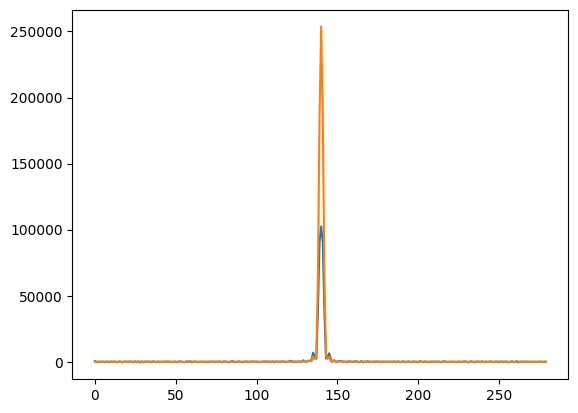

In [43]:
plt.figure()
plt.plot(range(len(SCAO22[0])), SCAO22[int(len(SCAO22)/2),:])
plt.plot(range(len(Airy22[0])), Airy22[int(len(Airy22)/2),:])

 Image Plane effects: 100%|██████████| 1/1 [00:00<?, ?it/s]

astar.scopesim.detector.detector_array - Extracting from 1 detectors...



 Image Plane effects: 100%|██████████| 1/1 [00:00<?, ?it/s]

astar.scopesim.detector.detector_array - Extracting from 1 detectors...



 Image Plane effects: 100%|██████████| 1/1 [00:00<?, ?it/s]

astar.scopesim.detector.detector_array - Extracting from 1 detectors...



 Image Plane effects: 100%|██████████| 1/1 [00:00<?, ?it/s]

astar.scopesim.detector.detector_array - Extracting from 1 detectors...



 Image Plane effects: 100%|██████████| 1/1 [00:00<?, ?it/s]

astar.scopesim.detector.detector_array - Extracting from 1 detectors...



 Image Plane effects: 100%|██████████| 1/1 [00:00<?, ?it/s]

astar.scopesim.detector.detector_array - Extracting from 1 detectors...



 Image Plane effects: 100%|██████████| 1/1 [00:00<?, ?it/s]

astar.scopesim.detector.detector_array - Extracting from 1 detectors...



 Image Plane effects: 100%|██████████| 1/1 [00:00<?, ?it/s]

astar.scopesim.detector.detector_array - Extracting from 1 detectors...



 Image Plane effects: 100%|██████████| 1/1 [00:00<?, ?it/s]

astar.scopesim.detector.detector_array - Extracting from 1 detectors...



 Image Plane effects: 100%|██████████| 1/1 [00:00<?, ?it/s]

astar.scopesim.detector.detector_array - Extracting from 1 detectors...



 Image Plane effects: 100%|██████████| 1/1 [00:00<?, ?it/s]

astar.scopesim.detector.detector_array - Extracting from 1 detectors...


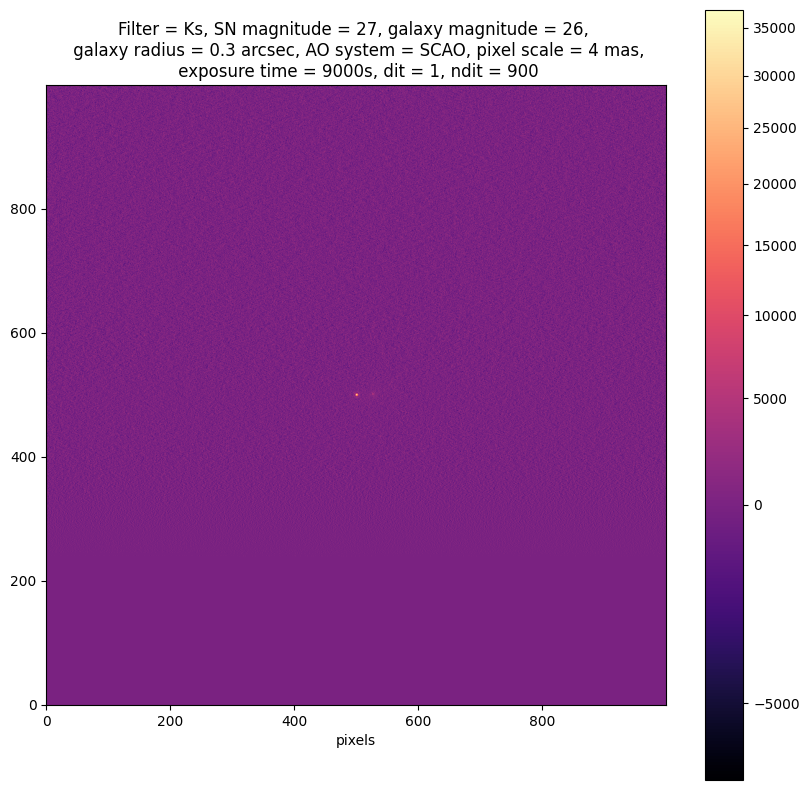

In [34]:
example = gal_SN_multiple_ex(SNmag=27,galmag=26,galr=.3,diffx=.1,dit=1,ndit=900,filter="Ks",fw1="open",fw2="Ks",AOsystem="SCAO",pix_scale=4,ex_count=10)

 Image Plane effects: 100%|██████████| 1/1 [00:00<?, ?it/s]

astar.scopesim.detector.detector_array - Extracting from 1 detectors...



 Image Plane effects: 100%|██████████| 1/1 [00:00<?, ?it/s]

astar.scopesim.detector.detector_array - Extracting from 1 detectors...



 Image Plane effects: 100%|██████████| 1/1 [00:00<?, ?it/s]

astar.scopesim.detector.detector_array - Extracting from 1 detectors...



 Image Plane effects: 100%|██████████| 1/1 [00:00<?, ?it/s]

astar.scopesim.detector.detector_array - Extracting from 1 detectors...



 Image Plane effects: 100%|██████████| 1/1 [00:00<?, ?it/s]

astar.scopesim.detector.detector_array - Extracting from 1 detectors...



 Image Plane effects: 100%|██████████| 1/1 [00:00<?, ?it/s]

astar.scopesim.detector.detector_array - Extracting from 1 detectors...



 Image Plane effects: 100%|██████████| 1/1 [00:00<?, ?it/s]

astar.scopesim.detector.detector_array - Extracting from 1 detectors...



 Image Plane effects: 100%|██████████| 1/1 [00:00<?, ?it/s]

astar.scopesim.detector.detector_array - Extracting from 1 detectors...



 Image Plane effects: 100%|██████████| 1/1 [00:00<?, ?it/s]

astar.scopesim.detector.detector_array - Extracting from 1 detectors...



 Image Plane effects: 100%|██████████| 1/1 [00:00<?, ?it/s]

astar.scopesim.detector.detector_array - Extracting from 1 detectors...



 Image Plane effects: 100%|██████████| 1/1 [00:00<?, ?it/s]

astar.scopesim.detector.detector_array - Extracting from 1 detectors...



 Image Plane effects: 100%|██████████| 1/1 [00:00<?, ?it/s]

astar.scopesim.detector.detector_array - Extracting from 1 detectors...



 Image Plane effects: 100%|██████████| 1/1 [00:00<?, ?it/s]

astar.scopesim.detector.detector_array - Extracting from 1 detectors...



 Image Plane effects: 100%|██████████| 1/1 [00:00<?, ?it/s]

astar.scopesim.detector.detector_array - Extracting from 1 detectors...



 Image Plane effects: 100%|██████████| 1/1 [00:00<?, ?it/s]

astar.scopesim.detector.detector_array - Extracting from 1 detectors...



 Image Plane effects: 100%|██████████| 1/1 [00:00<?, ?it/s]

astar.scopesim.detector.detector_array - Extracting from 1 detectors...



 Image Plane effects: 100%|██████████| 1/1 [00:00<?, ?it/s]

astar.scopesim.detector.detector_array - Extracting from 1 detectors...



 Image Plane effects: 100%|██████████| 1/1 [00:00<?, ?it/s]

astar.scopesim.detector.detector_array - Extracting from 1 detectors...



 Image Plane effects: 100%|██████████| 1/1 [00:00<?, ?it/s]

astar.scopesim.detector.detector_array - Extracting from 1 detectors...



 Image Plane effects: 100%|██████████| 1/1 [00:00<?, ?it/s]

astar.scopesim.detector.detector_array - Extracting from 1 detectors...



 Image Plane effects: 100%|██████████| 1/1 [00:00<?, ?it/s]

astar.scopesim.detector.detector_array - Extracting from 1 detectors...



 Image Plane effects: 100%|██████████| 1/1 [00:00<?, ?it/s]

astar.scopesim.detector.detector_array - Extracting from 1 detectors...



 Image Plane effects: 100%|██████████| 1/1 [00:00<?, ?it/s]

astar.scopesim.detector.detector_array - Extracting from 1 detectors...



 Image Plane effects: 100%|██████████| 1/1 [00:00<?, ?it/s]

astar.scopesim.detector.detector_array - Extracting from 1 detectors...



 Image Plane effects: 100%|██████████| 1/1 [00:00<?, ?it/s]

astar.scopesim.detector.detector_array - Extracting from 1 detectors...



 Image Plane effects: 100%|██████████| 1/1 [00:00<?, ?it/s]

astar.scopesim.detector.detector_array - Extracting from 1 detectors...


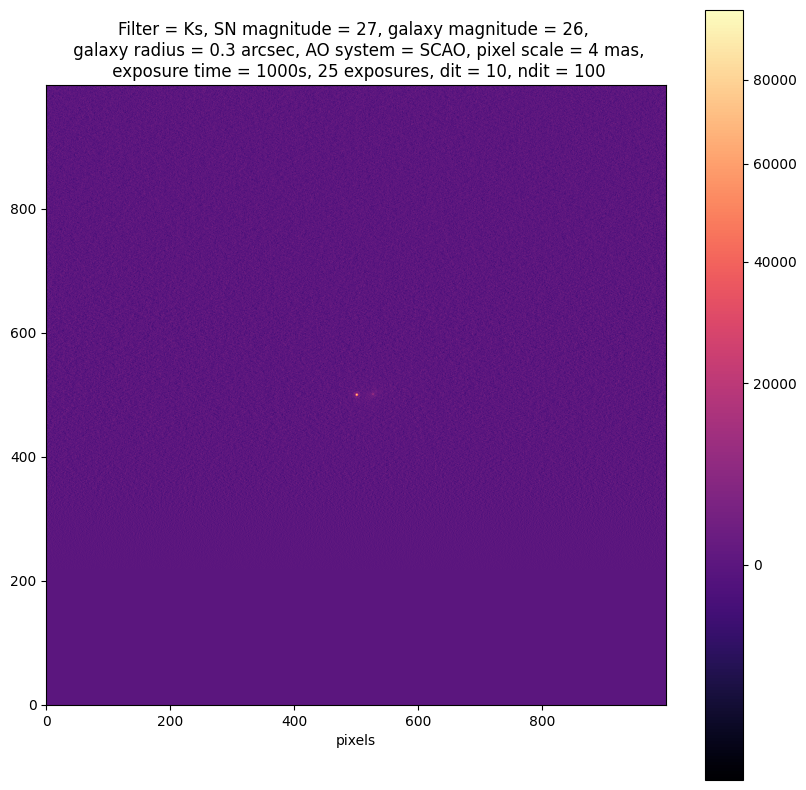

In [20]:
example = gal_SN_multiple_ex(SNmag=27,galmag=26,galr=.3,diffx=.1,dit=10,ndit=100,filter="Ks",fw1="open",fw2="Ks",AOsystem="SCAO",pix_scale=4,ex_count=25)

 Image Plane effects: 100%|██████████| 1/1 [00:00<?, ?it/s]

astar.scopesim.detector.detector_array - Extracting from 1 detectors...



 Image Plane effects: 100%|██████████| 1/1 [00:00<?, ?it/s]

astar.scopesim.detector.detector_array - Extracting from 1 detectors...



 Image Plane effects: 100%|██████████| 1/1 [00:00<?, ?it/s]

astar.scopesim.detector.detector_array - Extracting from 1 detectors...



 Image Plane effects: 100%|██████████| 1/1 [00:00<?, ?it/s]

astar.scopesim.detector.detector_array - Extracting from 1 detectors...



 Image Plane effects: 100%|██████████| 1/1 [00:00<?, ?it/s]

astar.scopesim.detector.detector_array - Extracting from 1 detectors...



 Image Plane effects: 100%|██████████| 1/1 [00:00<?, ?it/s]

astar.scopesim.detector.detector_array - Extracting from 1 detectors...


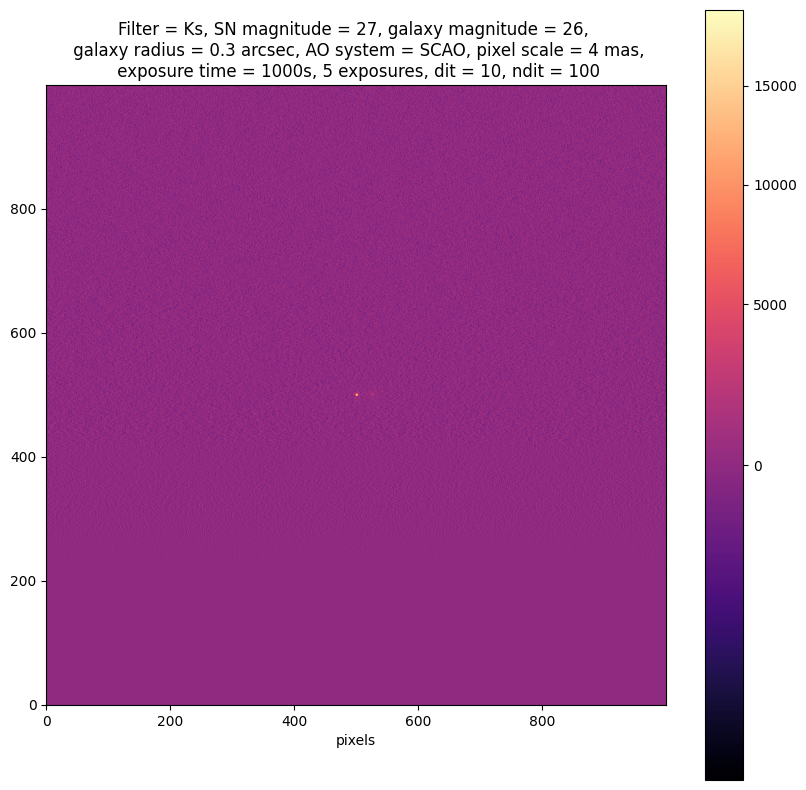

In [19]:
example = gal_SN_multiple_ex(SNmag=27,galmag=26,galr=.3,diffx=.1,dit=10,ndit=100,filter="Ks",fw1="open",fw2="Ks",AOsystem="SCAO",pix_scale=4,ex_count=5)

 Image Plane effects: 100%|██████████| 1/1 [00:00<?, ?it/s]

astar.scopesim.detector.detector_array - Extracting from 1 detectors...



 Image Plane effects: 100%|██████████| 1/1 [00:00<00:00, 995.80it/s]

astar.scopesim.detector.detector_array - Extracting from 1 detectors...



 Image Plane effects: 100%|██████████| 1/1 [00:00<?, ?it/s]

astar.scopesim.detector.detector_array - Extracting from 1 detectors...



 Image Plane effects: 100%|██████████| 1/1 [00:00<?, ?it/s]

astar.scopesim.detector.detector_array - Extracting from 1 detectors...



 Image Plane effects: 100%|██████████| 1/1 [00:00<?, ?it/s]

astar.scopesim.detector.detector_array - Extracting from 1 detectors...



 Image Plane effects: 100%|██████████| 1/1 [00:00<?, ?it/s]

astar.scopesim.detector.detector_array - Extracting from 1 detectors...


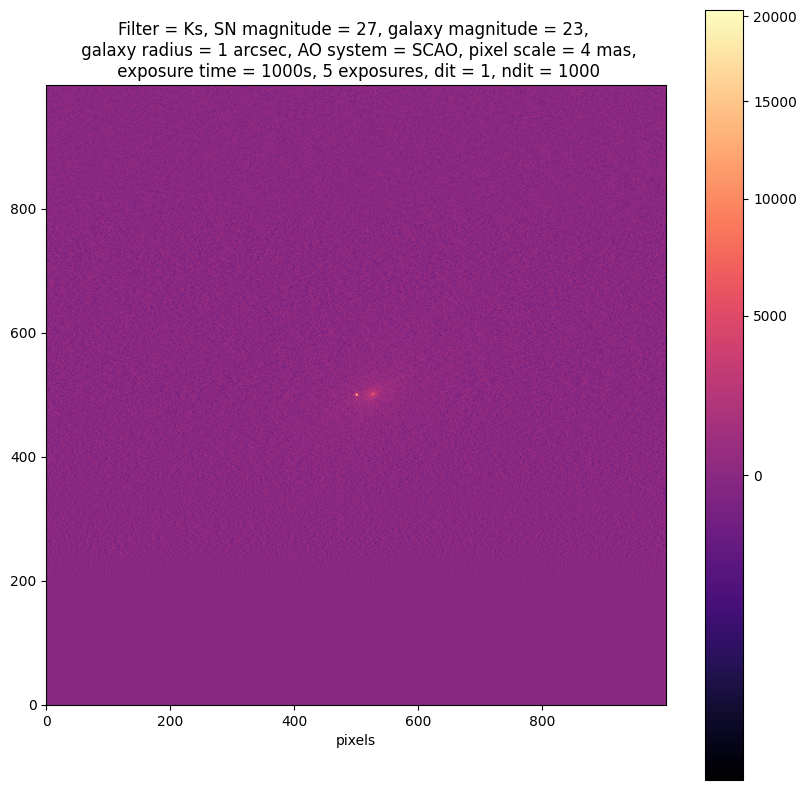

In [18]:
example = gal_SN_multiple_ex(SNmag=27,galmag=23,galr=1,diffx=.1,dit=1,ndit=1000,filter="Ks",fw1="open",fw2="Ks",AOsystem="SCAO",pix_scale=4,ex_count=5)

 Image Plane effects: 100%|██████████| 1/1 [00:00<?, ?it/s]

astar.scopesim.detector.detector_array - Extracting from 1 detectors...



 Image Plane effects: 100%|██████████| 1/1 [00:00<?, ?it/s]

astar.scopesim.detector.detector_array - Extracting from 1 detectors...



 Image Plane effects: 100%|██████████| 1/1 [00:00<?, ?it/s]

astar.scopesim.detector.detector_array - Extracting from 1 detectors...



 Image Plane effects: 100%|██████████| 1/1 [00:00<?, ?it/s]

astar.scopesim.detector.detector_array - Extracting from 1 detectors...



 Image Plane effects: 100%|██████████| 1/1 [00:00<?, ?it/s]

astar.scopesim.detector.detector_array - Extracting from 1 detectors...



 Image Plane effects: 100%|██████████| 1/1 [00:00<?, ?it/s]

astar.scopesim.detector.detector_array - Extracting from 1 detectors...


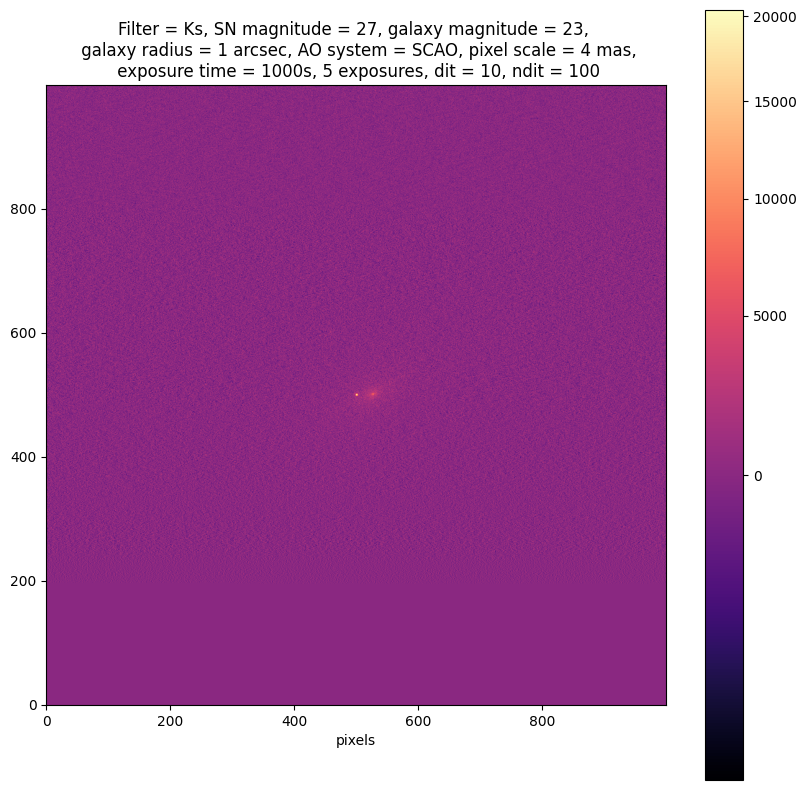

In [16]:
example = gal_SN_multiple_ex(SNmag=27,galmag=23,galr=1,diffx=.1,dit=10,ndit=100,filter="Ks",fw1="open",fw2="Ks",AOsystem="SCAO",pix_scale=4,ex_count=5)

 Image Plane effects: 100%|██████████| 1/1 [00:00<?, ?it/s]

astar.scopesim.detector.detector_array - Extracting from 1 detectors...



 Image Plane effects: 100%|██████████| 1/1 [00:00<?, ?it/s]

astar.scopesim.detector.detector_array - Extracting from 1 detectors...



 Image Plane effects: 100%|██████████| 1/1 [00:00<?, ?it/s]

astar.scopesim.detector.detector_array - Extracting from 1 detectors...



 Image Plane effects: 100%|██████████| 1/1 [00:00<?, ?it/s]

astar.scopesim.detector.detector_array - Extracting from 1 detectors...



 Image Plane effects: 100%|██████████| 1/1 [00:00<?, ?it/s]

astar.scopesim.detector.detector_array - Extracting from 1 detectors...



 Image Plane effects: 100%|██████████| 1/1 [00:00<?, ?it/s]

astar.scopesim.detector.detector_array - Extracting from 1 detectors...


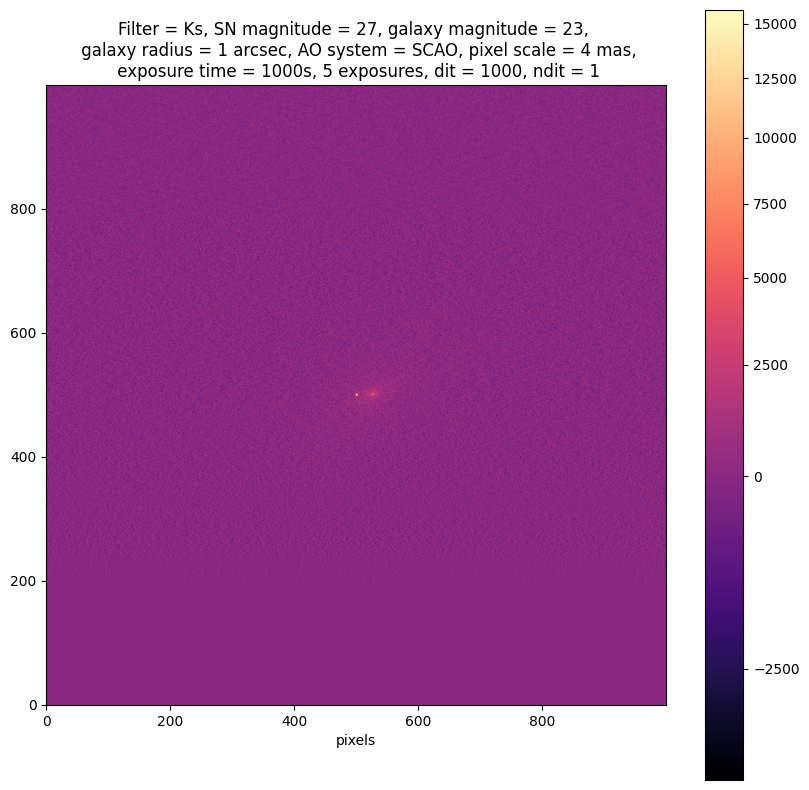

In [17]:
example = gal_SN_multiple_ex(SNmag=27,galmag=23,galr=1,diffx=.1,dit=1000,ndit=1,filter="Ks",fw1="open",fw2="Ks",AOsystem="SCAO",pix_scale=4,ex_count=5)

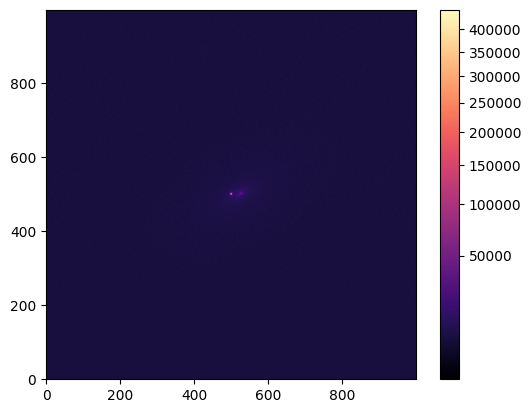

In [47]:
norm = ImageNormalize(example, interval=MinMaxInterval(),stretch=SqrtStretch())
#norm = simple_norm(example, 'sqrt')

plt.imshow(example, origin='lower', norm=norm, cmap="magma")
plt.colorbar()

In [ ]:
fluxcomparisonKsSCAO4 = []
mags = [18,21,24,27]
extimes = [10,100,1000,10000]
for i in range(len(mags)):
    fluxcomparisonKsSCAO4.append(makeFits(amp=mags[i],exposure_time=extimes[i]))


reducedlistKsSCAO4 = []
for f in fluxcomparisonKsSCAO4:
    reducedlistKsSCAO4.append(reduce(f,f+"_sky"))

hsetKsSCAO4 = []
vsetKsSCAO4 = []
for r in reducedlistKsSCAO4:
    h, v= intensity_1D(r,511,511,140,"pixels")
    hsetKsSCAO4.append(h)
    vsetKsSCAO4.append(v)

plot_PSFs(PSFset=hsetKsSCAO4, paramname="magnitude", paramvals=mags, HorV="h", photoband="Ks", AOsystem="SCAO", fov="4 mas" ,exposure_time=extimes)

 Image Plane effects: 100%|██████████| 1/1 [00:00<?, ?it/s]

astar.scopesim.detector.detector_array - Extracting from 1 detectors...



 Image Plane effects: 100%|██████████| 1/1 [00:00<?, ?it/s]

astar.scopesim.detector.detector_array - Extracting from 1 detectors...



 Image Plane effects: 100%|██████████| 1/1 [00:00<?, ?it/s]

astar.scopesim.detector.detector_array - Extracting from 1 detectors...



 Image Plane effects: 100%|██████████| 1/1 [00:00<?, ?it/s]

astar.scopesim.detector.detector_array - Extracting from 1 detectors...



 Image Plane effects: 100%|██████████| 1/1 [00:00<?, ?it/s]

astar.scopesim.detector.detector_array - Extracting from 1 detectors...



 Image Plane effects: 100%|██████████| 1/1 [00:00<?, ?it/s]

astar.scopesim.detector.detector_array - Extracting from 1 detectors...



 Image Plane effects: 100%|██████████| 1/1 [00:00<?, ?it/s]

astar.scopesim.detector.detector_array - Extracting from 1 detectors...



 Image Plane effects: 100%|██████████| 1/1 [00:00<?, ?it/s]

astar.scopesim.detector.detector_array - Extracting from 1 detectors...


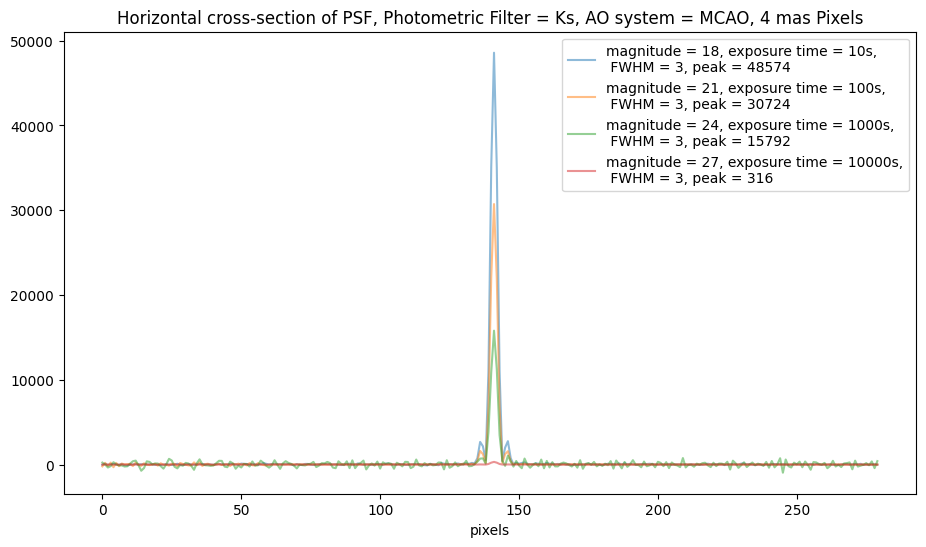

In [140]:
fluxcomparisonKsMCAO4 = []
mags = [18,21,24,27]
extimes = [10,100,1000,10000]
for i in range(len(mags)):
    fluxcomparisonKsMCAO4.append(makeFits(amp=mags[i],AOsystem="MCAO",exposure_time=extimes[i]))


reducedlistKsMCAO4 = []
for f in fluxcomparisonKsMCAO4:
    reducedlistKsMCAO4.append(reduce(f,f+"_sky"))

hsetKsMCAO4 = []
vsetKsMCAO4 = []
for r in reducedlistKsMCAO4:
    h, v= intensity_1D(r,511,511,140,"pixels")
    hsetKsMCAO4.append(h)
    vsetKsMCAO4.append(v)

plot_PSFs(PSFset=hsetKsMCAO4, paramname="magnitude", paramvals=mags, HorV="h", photoband="Ks", AOsystem="MCAO", fov="4 mas" ,exposure_time=extimes)

x0 =  512  y0 =  512  R =  140
280


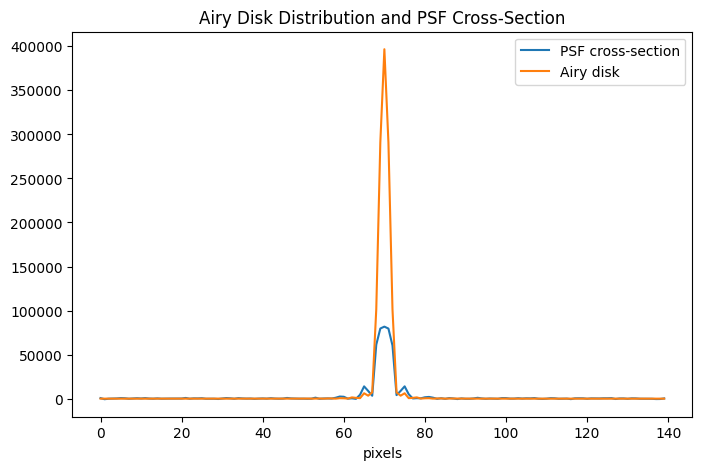

1224465.2431302029 462872.1525714286
0.20612171049719108
0.20612171049719108


In [51]:
hPSFset22, vPSFset22, hFWHMset22, vFWHMset22 = PSF_FWHM_set(["point22_Ks_IMG_4mas_SCAO_espt1000"], pointcoordx=512,pointcoordy=512,radius=140,coordtype="pixels")
strehl , airydisk = strehl_ratio(amp=22, AOsystem="SCAO", pixelscale=4, photofilter="Ks")
scale = sum(vPSFset22[0])/sum(airydisk)
print(len(airydisk))
scale2 = (vPSFset22[0][140]/airydisk[140])/strehl
for i in range(len(airydisk)):
    x = airydisk[i]
    airydisk[i] = x*scale2
plt.figure(figsize=(8,5))
plt.plot(range(140),vPSFset22[0][70:-70],label="PSF cross-section")
plt.plot(range(140),airydisk[70:-70],label="Airy disk")

plt.title("Airy Disk Distribution and PSF Cross-Section")
plt.xlabel("pixels")
plt.legend()
plt.savefig('C:/Users/krist/Dropbox/masters thesis/figs/strehlexampleKs22SCAO4mas')
plt.show()
print(sum(airydisk),sum(vPSFset22[0]))
print(strehl)
print(vPSFset22[0][140]/airydisk[140])


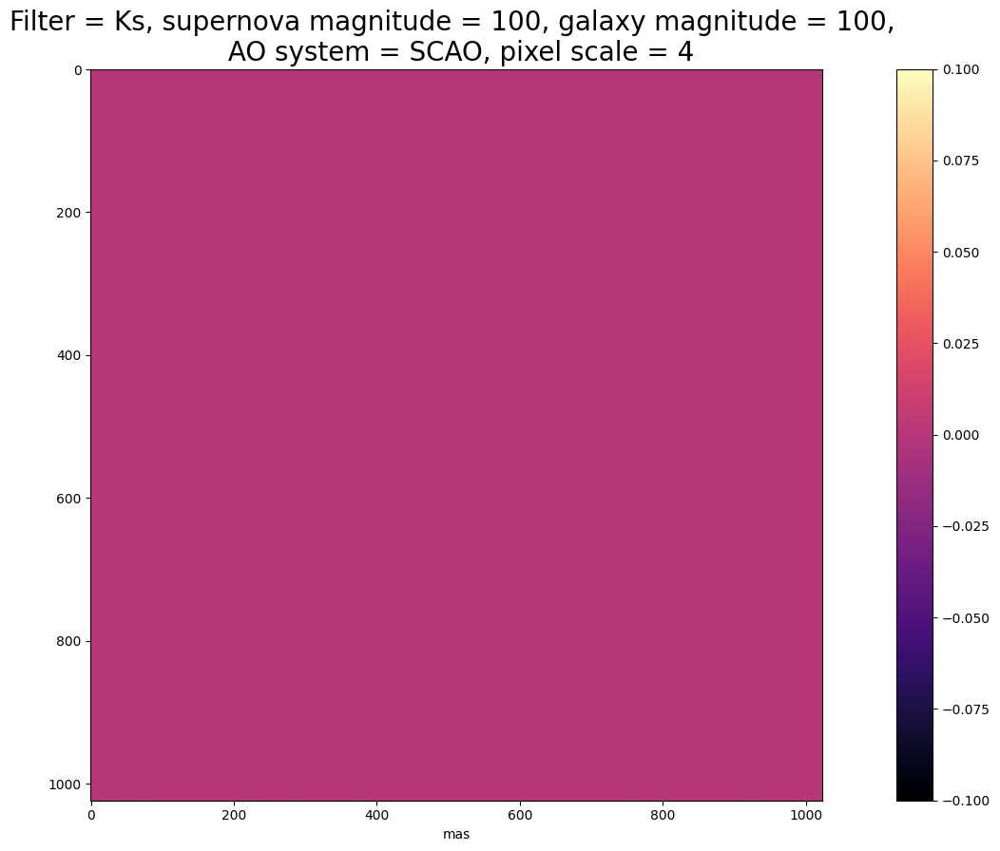

0.0


In [147]:
skydiff = reduce_and_plot("skytest1_SCAO_4mas_espt1000","skytest2_SCAO_4mas_espt1000",photofilter="Ks",pixscale=4,galmag=100,novamag=100,AO="SCAO")
print(skydiff.max())

In [ ]:
brightamps = [16,17,18,19,20]
dimamps = [21,22,23,24,25,26,27]
amps = [16,17,18,19,20,21,22,23,24,25,26,27]
for m in amps:
    #makeFits(amp=m,filt_cur="Ks",exposure_time=10,fov="IMG_4mas",AOsystem="SCAO",fw1="open",fw2="Ks")
    #makeFits(amp=m,filt_cur="Ks",exposure_time=10,fov="IMG_4mas",AOsystem="MCAO",fw1="open",fw2="Ks")
    #makeFits(amp=m,filt_cur="Ks",exposure_time=10,fov="IMG_1.5mas",AOsystem="SCAO",fw1="open",fw2="Ks")
    #makeFits(amp=m,filt_cur="Ks",exposure_time=10,fov="IMG_1.5mas",AOsystem="MCAO",fw1="open",fw2="Ks")
    #makeFits(amp=m,filt_cur="Ks",exposure_time=500,fov="IMG_4mas",AOsystem="SCAO",fw1="open",fw2="Ks")
    #makeFits(amp=m,filt_cur="Ks",exposure_time=500,fov="IMG_4mas",AOsystem="MCAO",fw1="open",fw2="Ks")
    #makeFits(amp=m,filt_cur="Ks",exposure_time=500,fov="IMG_1.5mas",AOsystem="SCAO",fw1="open",fw2="Ks")
    #makeFits(amp=m,filt_cur="Ks",exposure_time=500,fov="IMG_1.5mas",AOsystem="MCAO",fw1="open",fw2="Ks")

    #makeFits(amp=m,filt_cur="J",exposure_time=10,fov="IMG_4mas",AOsystem="SCAO",fw1="J",fw2="open")
    #makeFits(amp=m,filt_cur="J",exposure_time=10,fov="IMG_4mas",AOsystem="MCAO",fw1="J",fw2="open")
    #makeFits(amp=m,filt_cur="J",exposure_time=10,fov="IMG_1.5mas",AOsystem="SCAO",fw1="J",fw2="open")
    #makeFits(amp=m,filt_cur="J",exposure_time=10,fov="IMG_1.5mas",AOsystem="MCAO",fw1="J",fw2="open")
    makeFits(amp=m,filt_cur="J",exposure_time=500,fov="IMG_4mas",AOsystem="SCAO",fw1="J",fw2="open")
    makeFits(amp=m,filt_cur="J",exposure_time=500,fov="IMG_4mas",AOsystem="MCAO",fw1="J",fw2="open")
    makeFits(amp=m,filt_cur="J",exposure_time=500,fov="IMG_1.5mas",AOsystem="SCAO",fw1="J",fw2="open")
    makeFits(amp=m,filt_cur="J",exposure_time=500,fov="IMG_1.5mas",AOsystem="MCAO",fw1="J",fw2="open")

    #makeFits(amp=m,filt_cur="Y",exposure_time=10,fov="IMG_4mas",AOsystem="SCAO",fw1="Y",fw2="open")
    #makeFits(amp=m,filt_cur="Y",exposure_time=10,fov="IMG_4mas",AOsystem="MCAO",fw1="Y",fw2="open")
    #makeFits(amp=m,filt_cur="Y",exposure_time=10,fov="IMG_1.5mas",AOsystem="SCAO",fw1="Y",fw2="open")
    #makeFits(amp=m,filt_cur="Y",exposure_time=10,fov="IMG_1.5mas",AOsystem="MCAO",fw1="Y",fw2="open")
    makeFits(amp=m,filt_cur="Y",exposure_time=500,fov="IMG_4mas",AOsystem="SCAO",fw1="Y",fw2="open")
    makeFits(amp=m,filt_cur="Y",exposure_time=500,fov="IMG_4mas",AOsystem="MCAO",fw1="Y",fw2="open")
    makeFits(amp=m,filt_cur="Y",exposure_time=500,fov="IMG_1.5mas",AOsystem="SCAO",fw1="Y",fw2="open")
    makeFits(amp=m,filt_cur="Y",exposure_time=500,fov="IMG_1.5mas",AOsystem="MCAO",fw1="Y",fw2="open")

In [ ]:
amps = [22,23,24,25,26,27]
for i in [1000]:
    for m in amps:
        #makeFits(amp=m,filt_cur="Ks",exposure_time=i,fov="IMG_4mas",AOsystem="SCAO",fw1="open",fw2="Ks")
        #makeFits(amp=m,filt_cur="Ks",exposure_time=i,fov="IMG_4mas",AOsystem="MCAO",fw1="open",fw2="Ks")
        #makeFits(amp=m,filt_cur="Ks",exposure_time=i,fov="IMG_1.5mas",AOsystem="SCAO",fw1="open",fw2="Ks")
        #makeFits(amp=m,filt_cur="Ks",exposure_time=i,fov="IMG_1.5mas",AOsystem="MCAO",fw1="open",fw2="Ks")
#
        #makeFits(amp=m,filt_cur="J",exposure_time=i,fov="IMG_4mas",AOsystem="SCAO",fw1="open",fw2="Ks")
        #makeFits(amp=m,filt_cur="J",exposure_time=i,fov="IMG_4mas",AOsystem="MCAO",fw1="open",fw2="Ks")
        #makeFits(amp=m,filt_cur="J",exposure_time=i,fov="IMG_1.5mas",AOsystem="SCAO",fw1="open",fw2="Ks")
        #makeFits(amp=m,filt_cur="J",exposure_time=i,fov="IMG_1.5mas",AOsystem="MCAO",fw1="open",fw2="Ks")

        print(makeFits(amp=m,filt_cur="Y",exposure_time=i,fov="IMG_4mas",AOsystem="SCAO",fw1="open",fw2="Ks"))
        print(makeFits(amp=m,filt_cur="Y",exposure_time=i,fov="IMG_4mas",AOsystem="MCAO",fw1="open",fw2="Ks"))
        print(makeFits(amp=m,filt_cur="Y",exposure_time=i,fov="IMG_1.5mas",AOsystem="SCAO",fw1="open",fw2="Ks"))
        print(makeFits(amp=m,filt_cur="Y",exposure_time=i,fov="IMG_1.5mas",AOsystem="MCAO",fw1="open",fw2="Ks"))



In [58]:
strehllistKsSCAO4 = []
strehllistKsSCAO1p5 = []
strehllistKsMCAO4 = []
strehllistKsMCAO1p5 = []
strehllistJSCAO4 = []
strehllistJSCAO1p5 = []
strehllistJMCAO4 = []
strehllistJMCAO1p5 = []
strehllistYSCAO4 = []
strehllistYSCAO1p5 = []
strehllistYMCAO4 = []
strehllistYMCAO1p5 = []
amps1 = [16,17,18,19]
amps2 = [20,21,22,23]
amps3 = [24,25,26,27]
ampslist = [16,17,18,19,20,21,22,23,24,25,26,27]
exposuretimes = [1,2,5,5,5,10,10,100,100,1000,1000,1000]

for i in range(len(ampslist)):
    strehllistKsSCAO4.append(strehl_ratio(amp=ampslist[i],AOsystem="SCAO",pixelscale=4,photofilter="Ks",espt=exposuretimes[i]))
    if strehllistKsSCAO4[-1] >= 1 or strehllistKsSCAO4[-1] <=0:
        strehllistKsSCAO4[-1] = float("nan")
    strehllistKsSCAO1p5.append(strehl_ratio(amp=ampslist[i],AOsystem="SCAO",pixelscale=1.5,photofilter="Ks",espt=exposuretimes[i]))
    if strehllistKsSCAO1p5[-1] >= 1 or strehllistKsSCAO1p5[-1] <=0:
        strehllistKsSCAO1p5[-1] = float("nan")
    strehllistKsMCAO4.append(strehl_ratio(amp=ampslist[i],AOsystem="MCAO",pixelscale=4,photofilter="Ks",espt=exposuretimes[i]))
    if strehllistKsMCAO4[-1] >= 1 or strehllistKsMCAO4[-1] <=0:
        strehllistKsMCAO4[-1] = float("nan")
    strehllistKsMCAO1p5.append(strehl_ratio(amp=ampslist[i],AOsystem="MCAO",pixelscale=1.5,photofilter="Ks",espt=exposuretimes[i]))
    if strehllistKsMCAO1p5[-1] >= 1 or strehllistKsMCAO1p5[-1] <=0:
        strehllistKsMCAO1p5[-1] = float("nan")
    strehllistJSCAO4.append(strehl_ratio(amp=ampslist[i],AOsystem="SCAO",pixelscale=4,photofilter="J",espt=exposuretimes[i]))
    if strehllistJSCAO4[-1] >= 1 or strehllistJSCAO4[-1] <=0:
        strehllistJSCAO4[-1] = float("nan")
    strehllistJSCAO1p5.append(strehl_ratio(amp=ampslist[i],AOsystem="SCAO",pixelscale=1.5,photofilter="J",espt=exposuretimes[i]))
    if strehllistJSCAO1p5[-1] >= 1 or strehllistJSCAO1p5[-1] <=0:
        strehllistJSCAO1p5[-1] = float("nan")
    strehllistJMCAO4.append(strehl_ratio(amp=ampslist[i],AOsystem="MCAO",pixelscale=4,photofilter="J",espt=exposuretimes[i]))
    if strehllistJMCAO4[-1] >= 1 or strehllistJMCAO4[-1] <=0:
        strehllistJMCAO4[-1] = float("nan")
    strehllistJMCAO1p5.append(strehl_ratio(amp=ampslist[i],AOsystem="MCAO",pixelscale=1.5,photofilter="J",espt=exposuretimes[i]))
    if strehllistJMCAO1p5[-1] >= 1 or strehllistJMCAO1p5[-1] <=0:
        strehllistJMCAO1p5[-1] = float("nan")
    strehllistYSCAO4.append(strehl_ratio(amp=ampslist[i],AOsystem="SCAO",pixelscale=4,photofilter="Y",espt=exposuretimes[i]))
    if strehllistYSCAO4[-1] >= 1 or strehllistYSCAO4[-1] <=0:
        strehllistYSCAO4[-1] = float("nan")
    strehllistYSCAO1p5.append(strehl_ratio(amp=ampslist[i],AOsystem="SCAO",pixelscale=1.5,photofilter="Y",espt=exposuretimes[i]))
    if strehllistYSCAO1p5[-1] >= 1 or strehllistYSCAO1p5[-1] <=0:
        strehllistYSCAO1p5[-1] = float("nan")
    strehllistYMCAO4.append(strehl_ratio(amp=ampslist[i],AOsystem="MCAO",pixelscale=4,photofilter="Y",espt=exposuretimes[i]))
    if strehllistYMCAO4[-1] >= 1 or strehllistYMCAO4[-1]  <=0:
        strehllistYMCAO4[-1] = float("nan")
    strehllistYMCAO1p5.append(strehl_ratio(amp=ampslist[i],AOsystem="MCAO",pixelscale=1.5,photofilter="Y",espt=exposuretimes[i]))
    if strehllistYMCAO1p5[-1] >= 1 or strehllistYMCAO1p5[-1] <=0:
        strehllistYMCAO1p5[-1] = float("nan")



In [64]:
strehllistKsSCAO4ex1 = []
strehllistKsSCAO1p5ex1 = []
strehllistKsMCAO4ex1 = []
strehllistKsMCAO1p5ex1 = []
strehllistJSCAO4ex1 = []
strehllistJSCAO1p5ex1 = []
strehllistJMCAO4ex1 = []
strehllistJMCAO1p5ex1 = []
strehllistYSCAO4ex1 = []
strehllistYSCAO1p5ex1 = []
strehllistYMCAO4ex1 = []
strehllistYMCAO1p5ex1 = []

strehllistKsSCAO4ex2 = []
strehllistKsSCAO1p5ex2 = []
strehllistKsMCAO4ex2 = []
strehllistKsMCAO1p5ex2 = []
strehllistJSCAO4ex2 = []
strehllistJSCAO1p5ex2 = []
strehllistJMCAO4ex2 = []
strehllistJMCAO1p5ex2 = []
strehllistYSCAO4ex2 = []
strehllistYSCAO1p5ex2 = []
strehllistYMCAO4ex2 = []
strehllistYMCAO1p5ex2 = []

strehllistKsSCAO4ex5 = []
strehllistKsSCAO1p5ex5 = []
strehllistKsMCAO4ex5 = []
strehllistKsMCAO1p5ex5 = []
strehllistJSCAO4ex5 = []
strehllistJSCAO1p5ex5 = []
strehllistJMCAO4ex5 = []
strehllistJMCAO1p5ex5 = []
strehllistYSCAO4ex5 = []
strehllistYSCAO1p5ex5 = []
strehllistYMCAO4ex5 = []
strehllistYMCAO1p5ex5 = []

strehllistKsSCAO4ex10 = []
strehllistKsSCAO1p5ex10 = []
strehllistKsMCAO4ex10 = []
strehllistKsMCAO1p5ex10 = []
strehllistJSCAO4ex10 = []
strehllistJSCAO1p5ex10 = []
strehllistJMCAO4ex10 = []
strehllistJMCAO1p5ex10 = []
strehllistYSCAO4ex10 = []
strehllistYSCAO1p5ex10 = []
strehllistYMCAO4ex10 = []
strehllistYMCAO1p5ex10 = []

strehllistKsSCAO4ex100 = []
strehllistKsSCAO1p5ex100 = []
strehllistKsMCAO4ex100 = []
strehllistKsMCAO1p5ex100 = []
strehllistJSCAO4ex100 = []
strehllistJSCAO1p5ex100 = []
strehllistJMCAO4ex100 = []
strehllistJMCAO1p5ex100 = []
strehllistYSCAO4ex100 = []
strehllistYSCAO1p5ex100 = []
strehllistYMCAO4ex100 = []
strehllistYMCAO1p5ex100 = []

strehllistKsSCAO4ex1000 = []
strehllistKsSCAO1p5ex1000 = []
strehllistKsMCAO4ex1000 = []
strehllistKsMCAO1p5ex1000 = []
strehllistJSCAO4ex1000 = []
strehllistJSCAO1p5ex1000 = []
strehllistJMCAO4ex1000 = []
strehllistJMCAO1p5ex1000 = []
strehllistYSCAO4ex1000 = []
strehllistYSCAO1p5ex1000 = []
strehllistYMCAO4ex1000 = []
strehllistYMCAO1p5ex1000 = []

ampslist1 = [16, 17, 18, 19]
ampslist2 = [20,21,22,23]
ampslist3 = [24,25,26,27]
ampslistALL = [16, 17, 18, 19,20,21,22,23,24,25,26,27]

for i in range(len(ampslistALL)):
    strehllistKsSCAO4ex1.append(strehl_ratio(amp=ampslistALL[i],AOsystem="SCAO",pixelscale=4, photofilter="Ks",espt=1))
    strehllistKsSCAO1p5ex1.append(strehl_ratio(amp=ampslistALL[i],AOsystem="SCAO",pixelscale=1.5,photofilter="Ks",espt=1))
    strehllistKsMCAO4ex1.append(strehl_ratio(amp=ampslistALL[i],AOsystem="MCAO",pixelscale=4, photofilter="Ks",espt=1))
    strehllistKsMCAO1p5ex1.append(strehl_ratio(amp=ampslistALL[i],AOsystem="MCAO",pixelscale=1.5,photofilter="Ks",espt=1))
    strehllistJSCAO4ex1.append(strehl_ratio(amp=ampslistALL[i],AOsystem="SCAO", pixelscale=4, photofilter="J",espt=1))
    strehllistJSCAO1p5ex1.append(strehl_ratio(amp=ampslistALL[i],AOsystem="SCAO", pixelscale=1.5, photofilter="J",espt=1))
    strehllistJMCAO4ex1.append(strehl_ratio(amp=ampslistALL[i],AOsystem="MCAO", pixelscale=4, photofilter="J",espt=1))
    strehllistJMCAO1p5ex1.append(strehl_ratio(amp=ampslistALL[i],AOsystem="MCAO", pixelscale=1.5, photofilter="J",espt=1))
    strehllistYSCAO4ex1.append(strehl_ratio(amp=ampslistALL[i],AOsystem="SCAO", pixelscale=4,photofilter="Y", espt=1))
    strehllistYSCAO1p5ex1.append(strehl_ratio(amp=ampslistALL[i],AOsystem="SCAO", pixelscale=1.5,photofilter="Y", espt=1))
    strehllistYMCAO4ex1.append(strehl_ratio(amp=ampslistALL[i],AOsystem="MCAO", pixelscale=4,photofilter="Y", espt=1))
    strehllistYMCAO1p5ex1.append(strehl_ratio(amp=ampslistALL[i],AOsystem="MCAO", pixelscale=1.5,photofilter="Y", espt=1))

    strehllistKsSCAO4ex2.append(strehl_ratio(amp=ampslistALL[i],AOsystem="SCAO",pixelscale=4, photofilter="Ks", espt=2))
    strehllistKsSCAO1p5ex2.append(strehl_ratio(amp=ampslistALL[i],AOsystem="SCAO",pixelscale=1.5, photofilter="Ks", espt=2))
    strehllistKsMCAO4ex2.append(strehl_ratio(amp=ampslistALL[i],AOsystem="MCAO",pixelscale=4, photofilter="Ks", espt=2))
    strehllistKsMCAO1p5ex2.append(strehl_ratio(amp=ampslistALL[i],AOsystem="MCAO",pixelscale=1.5, photofilter="Ks", espt=2))
    strehllistJSCAO4ex2.append(strehl_ratio(amp=ampslistALL[i],AOsystem="SCAO",pixelscale=4, photofilter="J", espt=2))
    strehllistJSCAO1p5ex2.append(strehl_ratio(amp=ampslistALL[i],AOsystem="SCAO",pixelscale=1.5, photofilter="J", espt=2))
    strehllistJMCAO4ex2.append(strehl_ratio(amp=ampslistALL[i],AOsystem="MCAO",pixelscale=4, photofilter="J", espt=2))
    strehllistJMCAO1p5ex2.append(strehl_ratio(amp=ampslistALL[i],AOsystem="MCAO",pixelscale=1.5, photofilter="J", espt=2))
    strehllistYSCAO4ex2.append(strehl_ratio(amp=ampslistALL[i],AOsystem="SCAO",pixelscale=4, photofilter="Y", espt=2))
    strehllistYSCAO1p5ex2.append(strehl_ratio(amp=ampslistALL[i],AOsystem="SCAO",pixelscale=1.5, photofilter="Y", espt=2))
    strehllistYMCAO4ex2.append(strehl_ratio(amp=ampslistALL[i],AOsystem="MCAO",pixelscale=4, photofilter="Y", espt=2))
    strehllistYMCAO1p5ex2.append(strehl_ratio(amp=ampslistALL[i],AOsystem="MCAO",pixelscale=1.5, photofilter="Y", espt=2))

    strehllistKsSCAO4ex5.append(strehl_ratio(amp=ampslistALL[i],AOsystem="SCAO" ,pixelscale=4 , photofilter="Ks", espt=5))
    strehllistKsSCAO1p5ex5.append(strehl_ratio(amp=ampslistALL[i],AOsystem="SCAO" ,pixelscale=1.5 , photofilter="Ks", espt=5))
    strehllistKsMCAO4ex5.append(strehl_ratio(amp=ampslistALL[i],AOsystem="MCAO" ,pixelscale=4 , photofilter="Ks", espt=5))
    strehllistKsMCAO1p5ex5.append(strehl_ratio(amp=ampslistALL[i],AOsystem="MCAO" ,pixelscale=1.5 , photofilter="Ks", espt=5))
    strehllistJSCAO4ex5.append(strehl_ratio(amp=ampslistALL[i],AOsystem="SCAO" ,pixelscale=4 , photofilter="J", espt=5))
    strehllistJSCAO1p5ex5.append(strehl_ratio(amp=ampslistALL[i],AOsystem="SCAO" ,pixelscale=1.5 , photofilter="J", espt=5))
    strehllistJMCAO4ex5.append(strehl_ratio(amp=ampslistALL[i],AOsystem="MCAO" ,pixelscale=4 , photofilter="J", espt=5))
    strehllistJMCAO1p5ex5.append(strehl_ratio(amp=ampslistALL[i],AOsystem="MCAO" ,pixelscale=1.5 , photofilter="J", espt=5))
    strehllistYSCAO4ex5.append(strehl_ratio(amp=ampslistALL[i],AOsystem="SCAO" ,pixelscale=4 , photofilter="Y", espt=5))
    strehllistYSCAO1p5ex5.append(strehl_ratio(amp=ampslistALL[i],AOsystem="SCAO" ,pixelscale=1.5 , photofilter="Y", espt=5))
    strehllistYMCAO4ex5.append(strehl_ratio(amp=ampslistALL[i],AOsystem="MCAO" ,pixelscale=4 , photofilter="Y", espt=5))
    strehllistYMCAO1p5ex5.append(strehl_ratio(amp=ampslistALL[i],AOsystem="MCAO" ,pixelscale=1.5 , photofilter="Y", espt=5))

    strehllistKsSCAO4ex10.append(strehl_ratio(amp=ampslistALL[i],AOsystem="SCAO",pixelscale=4,photofilter="Ks",espt=10))
    strehllistKsSCAO1p5ex10.append(strehl_ratio(amp=ampslistALL[i],AOsystem="SCAO",pixelscale=1.5,photofilter="Ks",espt=10))
    strehllistKsMCAO4ex10.append(strehl_ratio(amp=ampslistALL[i],AOsystem="MCAO",pixelscale=4,photofilter="Ks",espt=10))
    strehllistKsMCAO1p5ex10.append(strehl_ratio(amp=ampslistALL[i],AOsystem="MCAO",pixelscale=1.5,photofilter="Ks",espt=10))
    strehllistJSCAO4ex10.append(strehl_ratio(amp=ampslistALL[i],AOsystem="SCAO",pixelscale=4,photofilter="J",espt=10))
    strehllistJSCAO1p5ex10.append(strehl_ratio(amp=ampslistALL[i],AOsystem="SCAO",pixelscale=1.5,photofilter="J",espt=10))
    strehllistJMCAO4ex10.append(strehl_ratio(amp=ampslistALL[i],AOsystem="MCAO",pixelscale=4,photofilter="J",espt=10))
    strehllistJMCAO1p5ex10.append(strehl_ratio(amp=ampslistALL[i],AOsystem="MCAO",pixelscale=1.5,photofilter="J",espt=10))
    strehllistYSCAO4ex10.append(strehl_ratio(amp=ampslistALL[i],AOsystem="SCAO",pixelscale=4,photofilter="Y",espt=10))
    strehllistYSCAO1p5ex10.append(strehl_ratio(amp=ampslistALL[i],AOsystem="SCAO",pixelscale=1.5,photofilter="Y",espt=10))
    strehllistYMCAO4ex10.append(strehl_ratio(amp=ampslistALL[i],AOsystem="MCAO",pixelscale=4,photofilter="Y",espt=10))
    strehllistYMCAO1p5ex10.append(strehl_ratio(amp=ampslistALL[i],AOsystem="MCAO",pixelscale=1.5,photofilter="Y",espt=10))

    strehllistKsSCAO4ex100.append(strehl_ratio(amp=ampslistALL[i],AOsystem="SCAO",pixelscale=4,photofilter="Ks",espt=100))
    strehllistKsSCAO1p5ex100.append(strehl_ratio(amp=ampslistALL[i],AOsystem="SCAO",pixelscale=1.5,photofilter="Ks",espt=100))
    strehllistKsMCAO4ex100.append(strehl_ratio(amp=ampslistALL[i],AOsystem="MCAO",pixelscale=4,photofilter="Ks",espt=100))
    strehllistKsMCAO1p5ex100.append(strehl_ratio(amp=ampslistALL[i],AOsystem="MCAO",pixelscale=1.5,photofilter="Ks",espt=100))
    strehllistJSCAO4ex100.append(strehl_ratio(amp=ampslistALL[i],AOsystem="SCAO",pixelscale=4,photofilter="J",espt=100))
    strehllistJSCAO1p5ex100.append(strehl_ratio(amp=ampslistALL[i],AOsystem="SCAO",pixelscale=1.5,photofilter="J",espt=100))
    strehllistJMCAO4ex100.append(strehl_ratio(amp=ampslistALL[i],AOsystem="MCAO",pixelscale=4,photofilter="J",espt=100))
    strehllistJMCAO1p5ex100.append(strehl_ratio(amp=ampslistALL[i],AOsystem="MCAO",pixelscale=1.5,photofilter="J",espt=100))
    strehllistYSCAO4ex100.append(strehl_ratio(amp=ampslistALL[i],AOsystem="SCAO",pixelscale=4,photofilter="Y",espt=100))
    strehllistYSCAO1p5ex100.append(strehl_ratio(amp=ampslistALL[i],AOsystem="SCAO",pixelscale=1.5,photofilter="Y",espt=100))
    strehllistYMCAO4ex100.append(strehl_ratio(amp=ampslistALL[i],AOsystem="MCAO",pixelscale=4,photofilter="Y",espt=100))
    strehllistYMCAO1p5ex100.append(strehl_ratio(amp=ampslistALL[i],AOsystem="MCAO",pixelscale=1.5,photofilter="Y",espt=100))

    strehllistKsSCAO4ex1000.append(strehl_ratio(amp=ampslistALL[i],AOsystem="SCAO",pixelscale=4,photofilter="Ks",espt=1000))
    strehllistKsSCAO1p5ex1000.append(strehl_ratio(amp=ampslistALL[i],AOsystem="SCAO",pixelscale=1.5,photofilter="Ks",espt=1000))
    strehllistKsMCAO4ex1000.append(strehl_ratio(amp=ampslistALL[i],AOsystem="MCAO",pixelscale=4,photofilter="Ks",espt=1000))
    strehllistKsMCAO1p5ex1000.append(strehl_ratio(amp=ampslistALL[i],AOsystem="MCAO",pixelscale=1.5,photofilter="Ks",espt=1000))
    strehllistJSCAO4ex1000.append(strehl_ratio(amp=ampslistALL[i],AOsystem="SCAO",pixelscale=4,photofilter="J",espt=1000))
    strehllistJSCAO1p5ex1000.append(strehl_ratio(amp=ampslistALL[i],AOsystem="SCAO",pixelscale=1.5,photofilter="J",espt=1000))
    strehllistJMCAO4ex1000.append(strehl_ratio(amp=ampslistALL[i],AOsystem="MCAO",pixelscale=4,photofilter="J",espt=1000))
    strehllistJMCAO1p5ex1000.append(strehl_ratio(amp=ampslistALL[i],AOsystem="MCAO",pixelscale=1.5,photofilter="J",espt=1000))
    strehllistYSCAO4ex1000.append(strehl_ratio(amp=ampslistALL[i],AOsystem="SCAO",pixelscale=4,photofilter="Y",espt=1000))
    strehllistYSCAO1p5ex1000.append(strehl_ratio(amp=ampslistALL[i],AOsystem="SCAO",pixelscale=1.5,photofilter="Y",espt=1000))
    strehllistYMCAO4ex1000.append(strehl_ratio(amp=ampslistALL[i],AOsystem="MCAO",pixelscale=4,photofilter="Y",espt=1000))
    strehllistYMCAO1p5ex1000.append(strehl_ratio(amp=ampslistALL[i],AOsystem="MCAO",pixelscale=1.5,photofilter="Y",espt=1000))

In [156]:
ampslistALL = [16, 17, 18, 19,20,21,22,23,24,25,26,27]

strehllistKsSCAO4ex500 = []
strehllistKsSCAO1p5ex500 = []
strehllistKsMCAO4ex500 = []
strehllistKsMCAO1p5ex500 = []
strehllistJSCAO4ex500 = []
strehllistJSCAO1p5ex500 = []
strehllistJMCAO4ex500 = []
strehllistJMCAO1p5ex500 = []
strehllistYSCAO4ex500 = []
strehllistYSCAO1p5ex500 = []
strehllistYMCAO4ex500 = []
strehllistYMCAO1p5ex500 = []

strehllistKsSCAO4ex5 = []
strehllistKsSCAO1p5ex5 = []
strehllistKsMCAO4ex5 = []
strehllistKsMCAO1p5ex5 = []
strehllistJSCAO4ex5 = []
strehllistJSCAO1p5ex5 = []
strehllistJMCAO4ex5 = []
strehllistJMCAO1p5ex5 = []
strehllistYSCAO4ex5 = []
strehllistYSCAO1p5ex5 = []
strehllistYMCAO4ex5 = []
strehllistYMCAO1p5ex5 = []

for i in range(len(ampslistALL)):
    strehllistKsSCAO4ex500.append(strehl_ratio(amp=ampslistALL[i],AOsystem="SCAO",pixelscale=4,photofilter="Ks",espt=500))
    strehllistKsSCAO1p5ex500.append(strehl_ratio(amp=ampslistALL[i],AOsystem="SCAO",pixelscale=1.5,photofilter="Ks",espt=500))
    strehllistKsMCAO4ex500.append(strehl_ratio(amp=ampslistALL[i],AOsystem="MCAO",pixelscale=4,photofilter="Ks",espt=500))
    strehllistKsMCAO1p5ex500.append(strehl_ratio(amp=ampslistALL[i],AOsystem="MCAO",pixelscale=1.5,photofilter="Ks",espt=500))
    strehllistJSCAO4ex500.append(strehl_ratio(amp=ampslistALL[i],AOsystem="SCAO",pixelscale=4,photofilter="J",espt=500))
    strehllistJSCAO1p5ex500.append(strehl_ratio(amp=ampslistALL[i],AOsystem="SCAO",pixelscale=1.5,photofilter="J",espt=500))
    strehllistJMCAO4ex500.append(strehl_ratio(amp=ampslistALL[i],AOsystem="MCAO",pixelscale=4,photofilter="J",espt=500))
    strehllistJMCAO1p5ex500.append(strehl_ratio(amp=ampslistALL[i],AOsystem="MCAO",pixelscale=1.5,photofilter="J",espt=500))
    strehllistYSCAO4ex500.append(strehl_ratio(amp=ampslistALL[i],AOsystem="SCAO",pixelscale=4,photofilter="Y",espt=500))
    strehllistYSCAO1p5ex500.append(strehl_ratio(amp=ampslistALL[i],AOsystem="SCAO",pixelscale=1.5,photofilter="Y",espt=500))
    strehllistYMCAO4ex500.append(strehl_ratio(amp=ampslistALL[i],AOsystem="MCAO",pixelscale=4,photofilter="Y",espt=500))
    strehllistYMCAO1p5ex500.append(strehl_ratio(amp=ampslistALL[i],AOsystem="MCAO",pixelscale=1.5,photofilter="Y",espt=500))

    strehllistKsSCAO4ex5.append(strehl_ratio(amp=ampslistALL[i],AOsystem="SCAO",pixelscale=4,photofilter="Ks",espt=5))
    strehllistKsSCAO1p5ex5.append(strehl_ratio(amp=ampslistALL[i],AOsystem="SCAO",pixelscale=1.5,photofilter="Ks",espt=5))
    strehllistKsMCAO4ex5.append(strehl_ratio(amp=ampslistALL[i],AOsystem="MCAO",pixelscale=4,photofilter="Ks",espt=5))
    strehllistKsMCAO1p5ex5.append(strehl_ratio(amp=ampslistALL[i],AOsystem="MCAO",pixelscale=1.5,photofilter="Ks",espt=5))
    strehllistJSCAO4ex5.append(strehl_ratio(amp=ampslistALL[i],AOsystem="SCAO",pixelscale=4,photofilter="J",espt=5))
    strehllistJSCAO1p5ex5.append(strehl_ratio(amp=ampslistALL[i],AOsystem="SCAO",pixelscale=1.5,photofilter="J",espt=5))
    strehllistJMCAO4ex5.append(strehl_ratio(amp=ampslistALL[i],AOsystem="MCAO",pixelscale=4,photofilter="J",espt=5))
    strehllistJMCAO1p5ex5.append(strehl_ratio(amp=ampslistALL[i],AOsystem="MCAO",pixelscale=1.5,photofilter="J",espt=5))
    strehllistYSCAO4ex5.append(strehl_ratio(amp=ampslistALL[i],AOsystem="SCAO",pixelscale=4,photofilter="Y",espt=5))
    strehllistYSCAO1p5ex5.append(strehl_ratio(amp=ampslistALL[i],AOsystem="SCAO",pixelscale=1.5,photofilter="Y",espt=5))
    strehllistYMCAO4ex5.append(strehl_ratio(amp=ampslistALL[i],AOsystem="MCAO",pixelscale=4,photofilter="Y",espt=5))
    strehllistYMCAO1p5ex5.append(strehl_ratio(amp=ampslistALL[i],AOsystem="MCAO",pixelscale=1.5,photofilter="Y",espt=5))

In [129]:
import statistics as stat
print(stat.mean(strehllistKsSCAO4ex10[0:6]))
print(stat.mean(strehllistKsMCAO4ex10[0:6]))
print(stat.mean(strehllistKsSCAO1p5ex10[0:6]))
print(stat.mean(strehllistKsMCAO1p5ex10[0:6]))



0.41864898887935836
0.25064075246136347
0.5147927752147318
0.2924109356784473


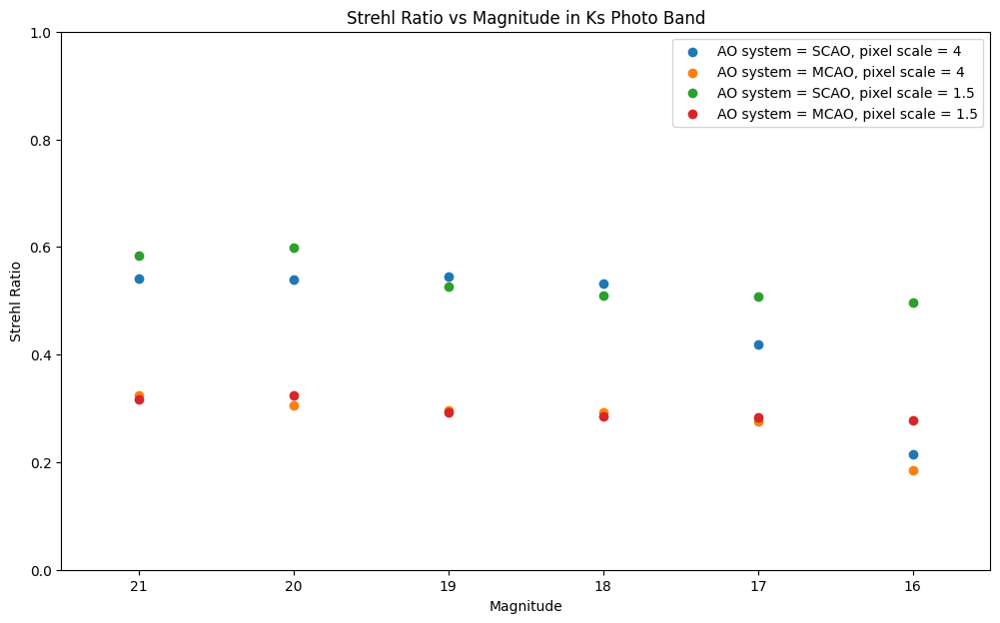

In [162]:
plt.figure(figsize=(12,7))
plt.scatter(ampslistALL[0:6], strehllistKsSCAO4ex5[0:6], label = "AO system = SCAO, pixel scale = 4")
plt.scatter(ampslistALL[0:6], strehllistKsMCAO4ex5[0:6], label = "AO system = MCAO, pixel scale = 4")
plt.scatter(ampslistALL[0:6], strehllistKsSCAO1p5ex5[0:6], label = "AO system = SCAO, pixel scale = 1.5")
plt.scatter(ampslistALL[0:6], strehllistKsMCAO1p5ex5[0:6], label = "AO system = MCAO, pixel scale = 1.5")
plt.xlim(max(ampslistALL[0:6])+.5,min(ampslistALL[0:6])-.5)
plt.ylim(0,1)
plt.xlabel("Magnitude")
plt.ylabel("Strehl Ratio")
plt.legend()
plt.title("Strehl Ratio vs Magnitude in Ks Photo Band")
#plt.savefig('C:/Users/krist/Dropbox/masters thesis/figs/strehlKs1621')
plt.show()

In [141]:
print(stat.mean(strehllistKsSCAO4ex1000[6:12]))
print(stat.mean(strehllistKsMCAO4ex1000[6:12]))
print(stat.mean(strehllistKsSCAO1p5ex1000[6:11]))
print(stat.mean(strehllistKsMCAO1p5ex1000[6:11]))

print(strehllistKsSCAO4ex1000[6:12])
print(strehllistKsMCAO4ex1000[6:12])
print(strehllistKsSCAO1p5ex1000[6:11])
print(strehllistKsMCAO1p5ex1000[6:11])

0.4892604387128143
0.2806178387731551
0.5766046049379487
0.3488897922027794
[0.20612171049719108, 0.4010489373024143, 0.5632245812522653, 0.5656541127864472, 0.5976549385866826, 0.6018583518518855]
[0.14249147931322192, 0.25094241211689045, 0.32337676364716106, 0.32806463348328296, 0.2937477210206443, 0.34508402305773]
[0.5425163748430666, 0.5564204456507111, 0.5608043710802079, 0.5839961991715107, 0.6392856339442476]
[0.303388713011062, 0.3033918560559486, 0.30429633230269365, 0.35266236329762857, 0.48070969634656413]


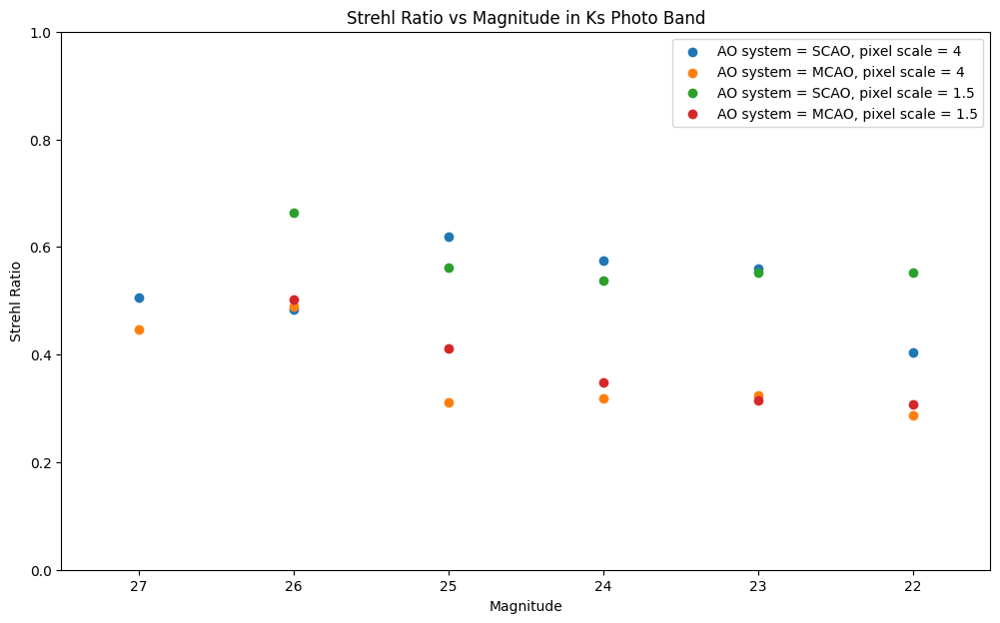

In [158]:
plt.figure(figsize=(12,7))
plt.scatter(ampslistALL[6:12], strehllistKsSCAO4ex500[6:12], label = "AO system = SCAO, pixel scale = 4")
plt.scatter(ampslistALL[6:12], strehllistKsMCAO4ex500[6:12], label = "AO system = MCAO, pixel scale = 4")
plt.scatter(ampslistALL[6:12], strehllistKsSCAO1p5ex500[6:12], label = "AO system = SCAO, pixel scale = 1.5")
plt.scatter(ampslistALL[6:12], strehllistKsMCAO1p5ex500[6:12], label = "AO system = MCAO, pixel scale = 1.5")
plt.xlim(max(ampslistALL[6:12])+.5,min(ampslistALL[6:12])-.5)
plt.ylim(0,1)
plt.xlabel("Magnitude")
plt.ylabel("Strehl Ratio")
plt.legend()
plt.title("Strehl Ratio vs Magnitude in Ks Photo Band")
#plt.savefig('C:/Users/krist/Dropbox/masters thesis/figs/strehlKs2227')
plt.show()

In [143]:
print(stat.mean(strehllistJSCAO4ex1000[6:12]))
print(stat.mean(strehllistJMCAO4ex1000[6:12]))
print(stat.mean(strehllistJSCAO1p5ex1000[6:12]))
print(stat.mean(strehllistJMCAO1p5ex1000[6:12]))

0.21431330641171129
0.03522792121283182
0.21886839643007727
0.04329091846708506


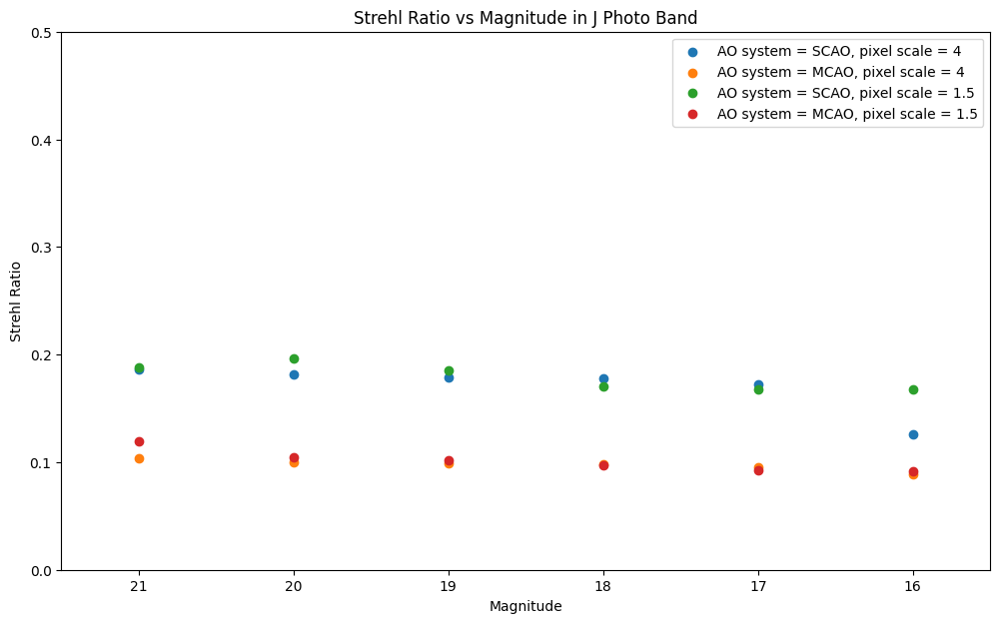

In [159]:
plt.figure(figsize=(12,7))
plt.scatter(ampslistALL[0:6], strehllistJSCAO4ex5[0:6], label = "AO system = SCAO, pixel scale = 4")
plt.scatter(ampslistALL[0:6], strehllistJMCAO4ex5[0:6], label = "AO system = MCAO, pixel scale = 4")
plt.scatter(ampslistALL[0:6], strehllistJSCAO1p5ex5[0:6], label = "AO system = SCAO, pixel scale = 1.5")
plt.scatter(ampslistALL[0:6], strehllistJMCAO1p5ex5[0:6], label = "AO system = MCAO, pixel scale = 1.5")
plt.xlim(max(ampslistALL[0:6])+.5,min(ampslistALL[0:6])-.5)
plt.ylim(0,.5)
plt.xlabel("Magnitude")
plt.ylabel("Strehl Ratio")
plt.legend()
plt.title("Strehl Ratio vs Magnitude in J Photo Band")
#plt.savefig('C:/Users/krist/Dropbox/masters thesis/figs/strehlJ1621')
plt.show()

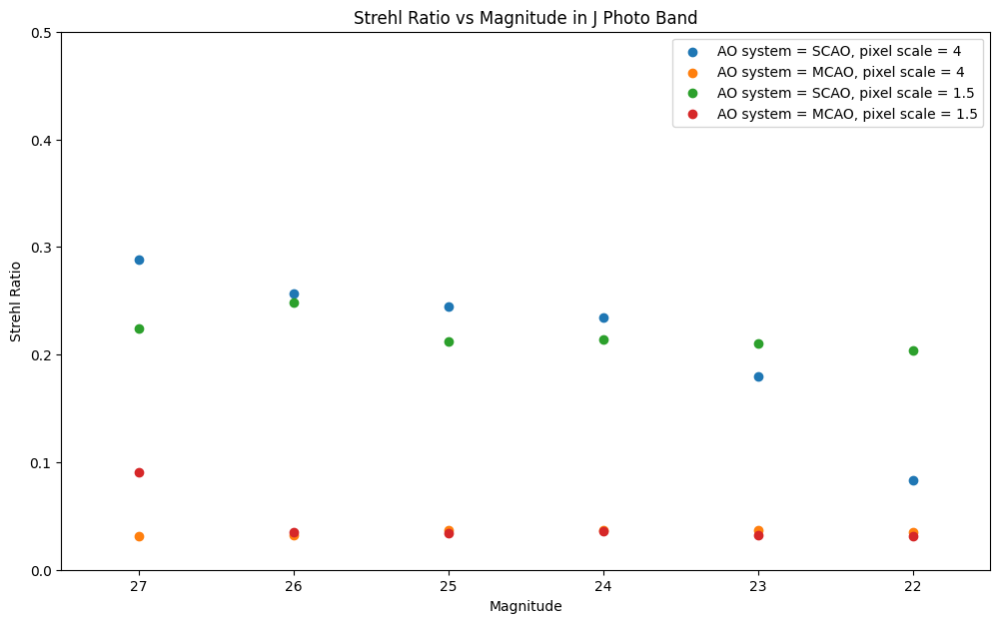

In [123]:
plt.figure(figsize=(12,7))
plt.scatter(ampslistALL[6:12], strehllistJSCAO4ex1000[6:12], label = "AO system = SCAO, pixel scale = 4")
plt.scatter(ampslistALL[6:12], strehllistJMCAO4ex1000[6:12], label = "AO system = MCAO, pixel scale = 4")
plt.scatter(ampslistALL[6:12], strehllistJSCAO1p5ex1000[6:12], label = "AO system = SCAO, pixel scale = 1.5")
plt.scatter(ampslistALL[6:12], strehllistJMCAO1p5ex1000[6:12], label = "AO system = MCAO, pixel scale = 1.5")
plt.xlim(max(ampslistALL[6:12])+.5,min(ampslistALL[6:12])-.5)
plt.ylim(0,.5)
plt.xlabel("Magnitude")
plt.ylabel("Strehl Ratio")
plt.legend()
plt.title("Strehl Ratio vs Magnitude in J Photo Band")
#plt.savefig('C:/Users/krist/Dropbox/masters thesis/figs/strehlJ2227')
plt.show()

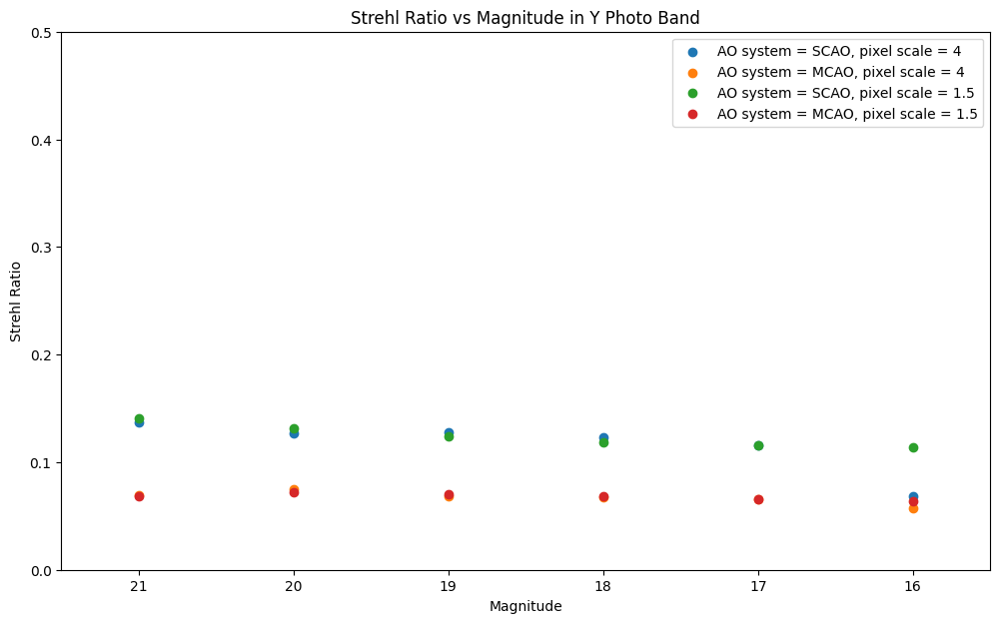

In [126]:
plt.figure(figsize=(12,7))
plt.scatter(ampslistALL[0:6], strehllistYSCAO4ex10[0:6], label = "AO system = SCAO, pixel scale = 4")
plt.scatter(ampslistALL[0:6], strehllistYMCAO4ex10[0:6], label = "AO system = MCAO, pixel scale = 4")
plt.scatter(ampslistALL[0:6], strehllistYSCAO1p5ex10[0:6], label = "AO system = SCAO, pixel scale = 1.5")
plt.scatter(ampslistALL[0:6], strehllistYMCAO1p5ex10[0:6], label = "AO system = MCAO, pixel scale = 1.5")
plt.xlim(max(ampslistALL[0:6])+.5,min(ampslistALL[0:6])-.5)
plt.ylim(0,.5)
plt.xlabel("Magnitude")
plt.ylabel("Strehl Ratio")
plt.legend()
plt.title("Strehl Ratio vs Magnitude in Y Photo Band")
#plt.savefig('C:/Users/krist/Dropbox/masters thesis/figs/strehlY1621')
plt.show()

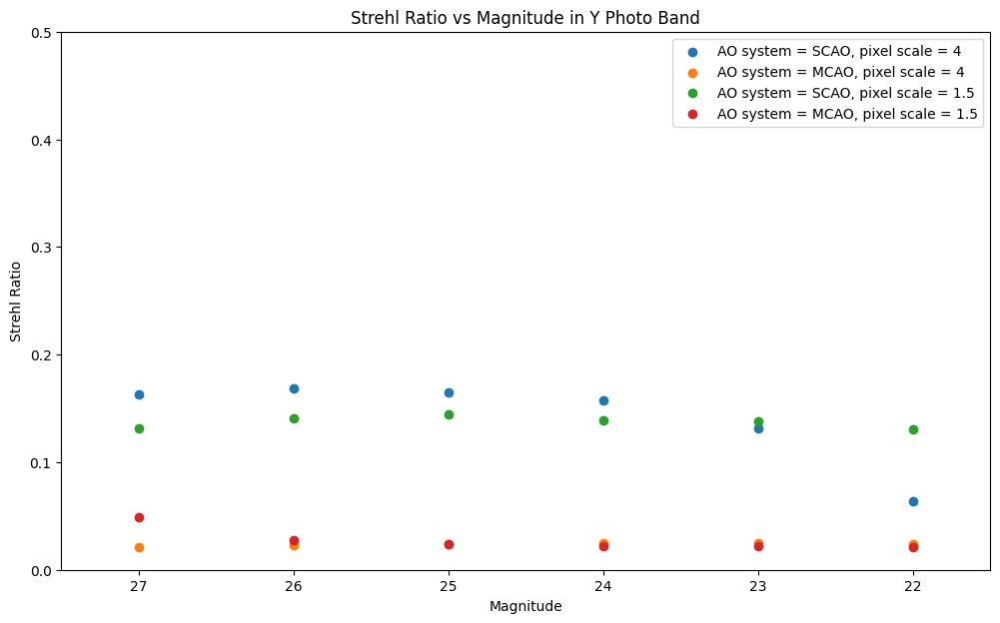

In [144]:
plt.figure(figsize=(12,7))
plt.scatter(ampslistALL[6:12], strehllistYSCAO4ex1000[6:12], label = "AO system = SCAO, pixel scale = 4")
plt.scatter(ampslistALL[6:12], strehllistYMCAO4ex1000[6:12], label = "AO system = MCAO, pixel scale = 4")
plt.scatter(ampslistALL[6:12], strehllistYSCAO1p5ex1000[6:12], label = "AO system = SCAO, pixel scale = 1.5")
plt.scatter(ampslistALL[6:12], strehllistYMCAO1p5ex1000[6:12], label = "AO system = MCAO, pixel scale = 1.5")
plt.xlim(max(ampslistALL[6:12])+.5,min(ampslistALL[6:12])-.5)
plt.ylim(0,.5)
plt.xlabel("Magnitude")
plt.ylabel("Strehl Ratio")
plt.legend()
plt.title("Strehl Ratio vs Magnitude in Y Photo Band")
#plt.savefig('C:/Users/krist/Dropbox/masters thesis/figs/strehlY2227')
plt.show()

Text(0.5, 1.0, 'Strehl Ratio vs Magnitude, Ks Photo Band, AO system = SCAO, pixel scale = 4 mas')

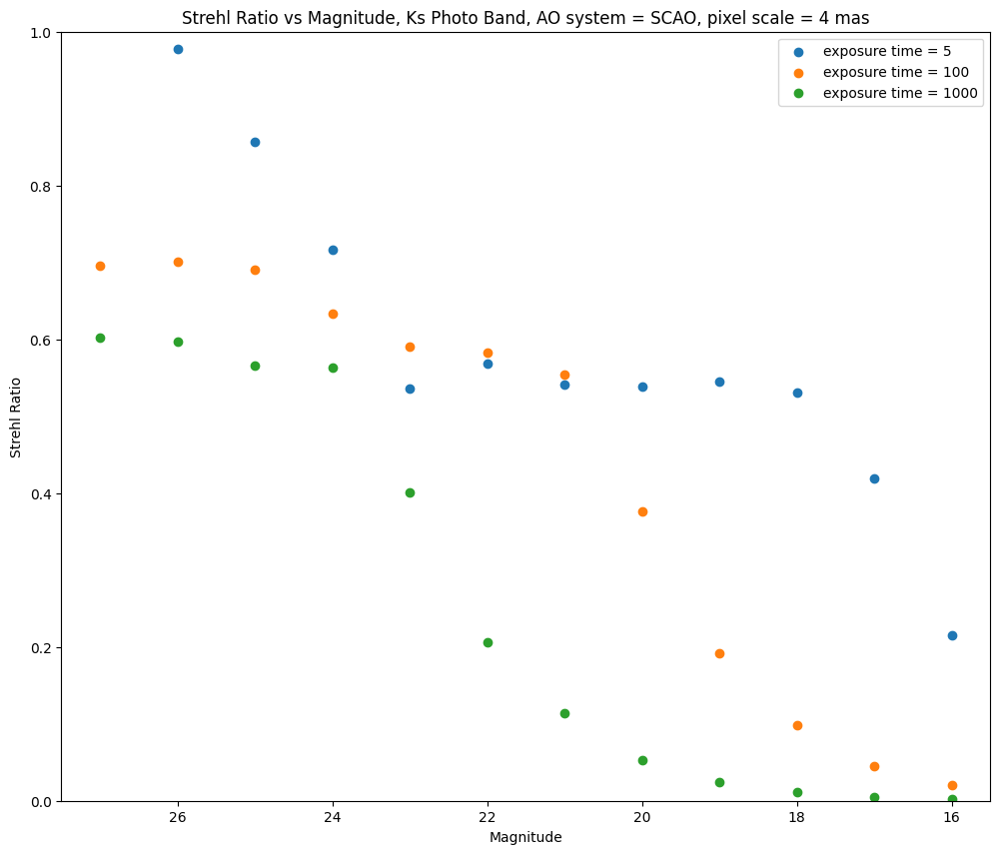

In [91]:
plt.figure(figsize=(12,10))
#plt.scatter(ampslistALL, strehllistKsSCAO4ex1, label = "exposure time = 1")
#plt.scatter(ampslistALL, strehllistKsSCAO4ex2, label = "exposure time = 2")
plt.scatter(ampslistALL, strehllistKsSCAO4ex5, label = "exposure time = 5")
##plt.scatter(ampslistALL, strehllistKsSCAO4ex10, label = "exposure time = 10")
plt.scatter(ampslistALL, strehllistKsSCAO4ex100, label = "exposure time = 100")
plt.scatter(ampslistALL, strehllistKsSCAO4ex1000, label = "exposure time = 1000")
plt.xlim(max(ampslistALL)+.5,min(ampslistALL)-.5)
plt.ylim(0,1)
plt.xlabel("Magnitude")
plt.ylabel("Strehl Ratio")
plt.legend()
plt.title("Strehl Ratio vs Magnitude, Ks Photo Band, AO system = SCAO, pixel scale = 4 mas")

Text(0.5, 1.0, 'Strehl Ratio vs Magnitude, Ks Photo Band, AO system = MCAO, pixel scale = 4 mas')

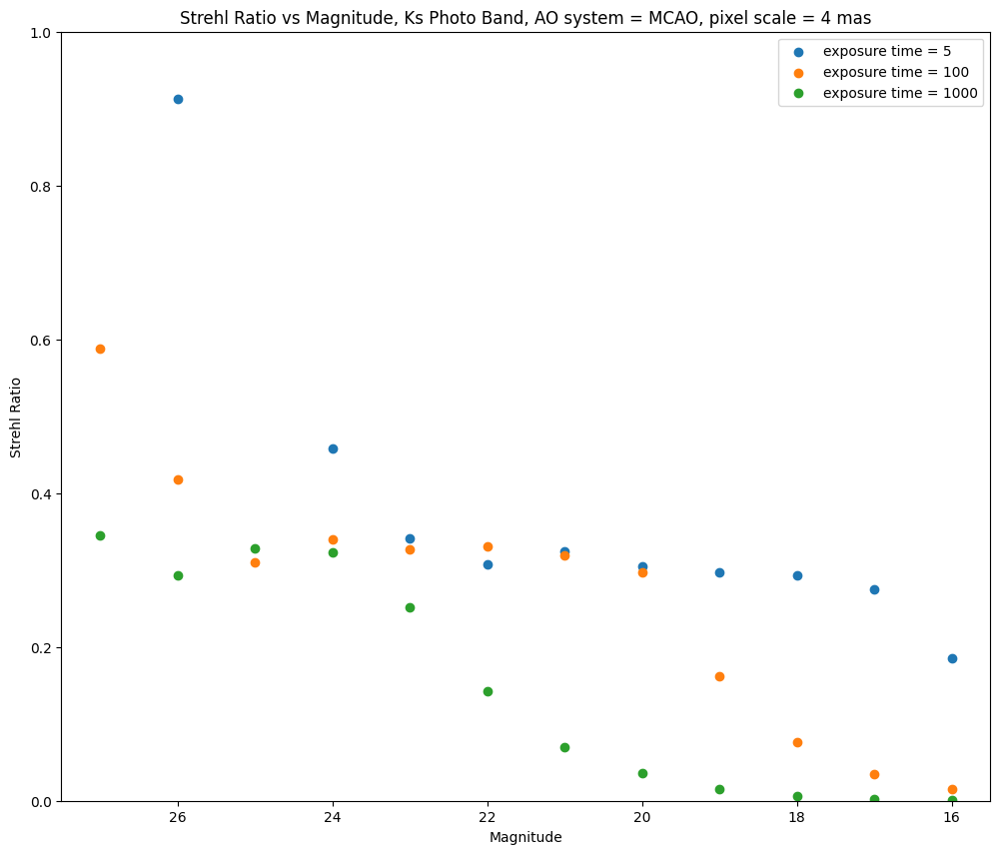

In [92]:
plt.figure(figsize=(12,10))
#plt.scatter(ampslistALL, strehllistKsMCAO4ex1, label = "exposure time = 1")
#plt.scatter(ampslistALL, strehllistKsMCAO4ex2, label = "exposure time = 2")
plt.scatter(ampslistALL, strehllistKsMCAO4ex5, label = "exposure time = 5")
#plt.scatter(ampslistALL, strehllistKsMCAO4ex10, label = "exposure time = 10")
plt.scatter(ampslistALL, strehllistKsMCAO4ex100, label = "exposure time = 100")
plt.scatter(ampslistALL, strehllistKsMCAO4ex1000, label = "exposure time = 1000")
plt.xlim(max(ampslistALL)+.5,min(ampslistALL)-.5)
plt.ylim(0,1)
plt.xlabel("Magnitude")
plt.ylabel("Strehl Ratio")
plt.legend()
plt.title("Strehl Ratio vs Magnitude, Ks Photo Band, AO system = MCAO, pixel scale = 4 mas")

Text(0.5, 1.0, 'Strehl Ratio vs Magnitude, Ks Photo Band, AO system = SCAO, pixel scale = 1.5 mas')

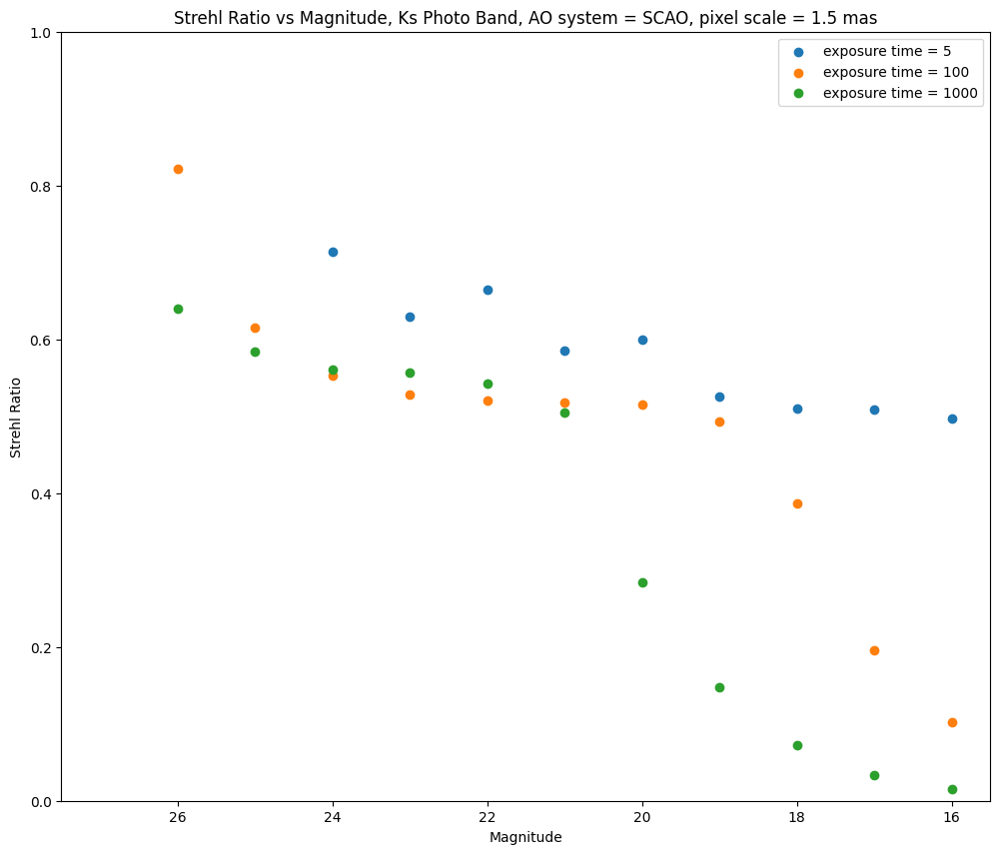

In [93]:
plt.figure(figsize=(12,10))
#plt.scatter(ampslistALL, strehllistKsSCAO1p5ex1, label = "exposure time = 1")
#plt.scatter(ampslistALL, strehllistKsSCAO1p5ex2, label = "exposure time = 2")
plt.scatter(ampslistALL, strehllistKsSCAO1p5ex5, label = "exposure time = 5")
#plt.scatter(ampslistALL, strehllistKsSCAO1p5ex10, label = "exposure time = 10")
plt.scatter(ampslistALL, strehllistKsSCAO1p5ex100, label = "exposure time = 100")
plt.scatter(ampslistALL, strehllistKsSCAO1p5ex1000, label = "exposure time = 1000")
plt.xlim(max(ampslistALL)+.5,min(ampslistALL)-.5)
plt.ylim(0,1)
plt.xlabel("Magnitude")
plt.ylabel("Strehl Ratio")
plt.legend()
plt.title("Strehl Ratio vs Magnitude, Ks Photo Band, AO system = SCAO, pixel scale = 1.5 mas")

Text(0.5, 1.0, 'Strehl Ratio vs Magnitude, Ks Photo Band, AO system = MCAO, pixel scale = 1.5 mas')

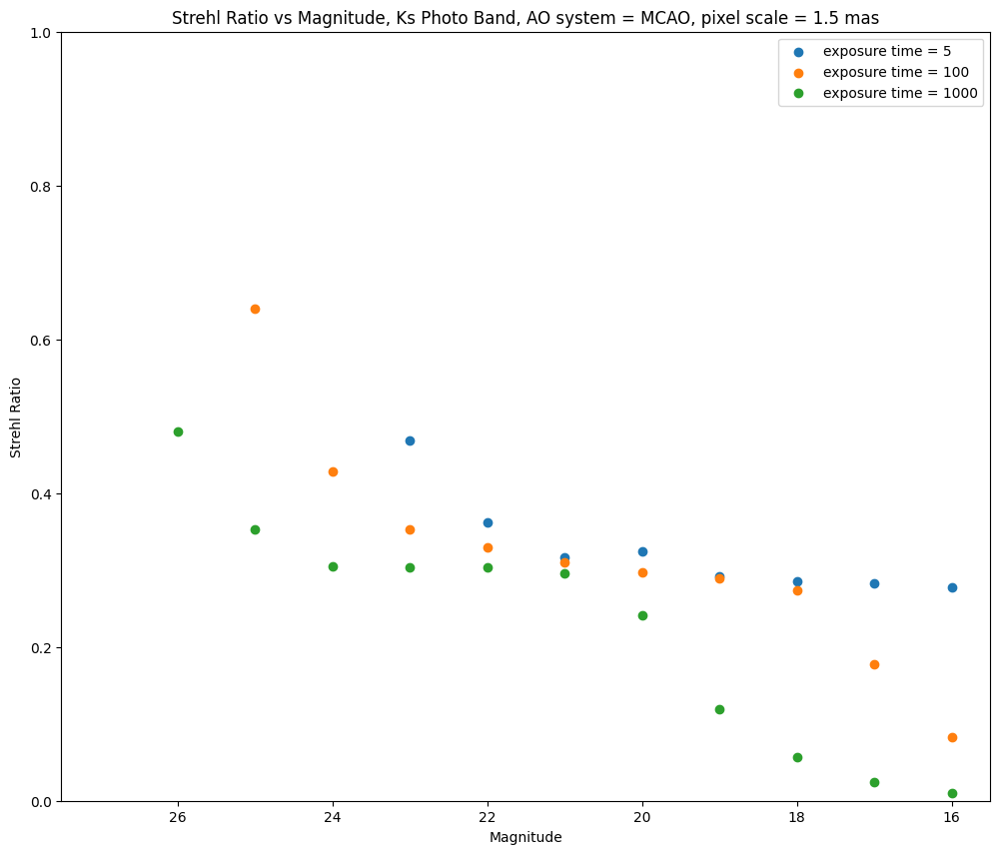

In [94]:
plt.figure(figsize=(12,10))
#plt.scatter(ampslistALL, strehllistKsMCAO1p5ex1, label = "exposure time = 1")
#plt.scatter(ampslistALL, strehllistKsMCAO1p5ex2, label = "exposure time = 2")
plt.scatter(ampslistALL, strehllistKsMCAO1p5ex5, label = "exposure time = 5")
#plt.scatter(ampslistALL, strehllistKsMCAO1p5ex10, label = "exposure time = 10")
plt.scatter(ampslistALL, strehllistKsMCAO1p5ex100, label = "exposure time = 100")
plt.scatter(ampslistALL, strehllistKsMCAO1p5ex1000, label = "exposure time = 1000")
plt.xlim(max(ampslistALL)+.5,min(ampslistALL)-.5)
plt.ylim(0,1)
plt.xlabel("Magnitude")
plt.ylabel("Strehl Ratio")
plt.legend()
plt.title("Strehl Ratio vs Magnitude, Ks Photo Band, AO system = MCAO, pixel scale = 1.5 mas")

Text(0.5, 1.0, 'Strehl Ratio vs Magnitude, J Photo Band, AO system = SCAO, pixel scale = 4 mas')

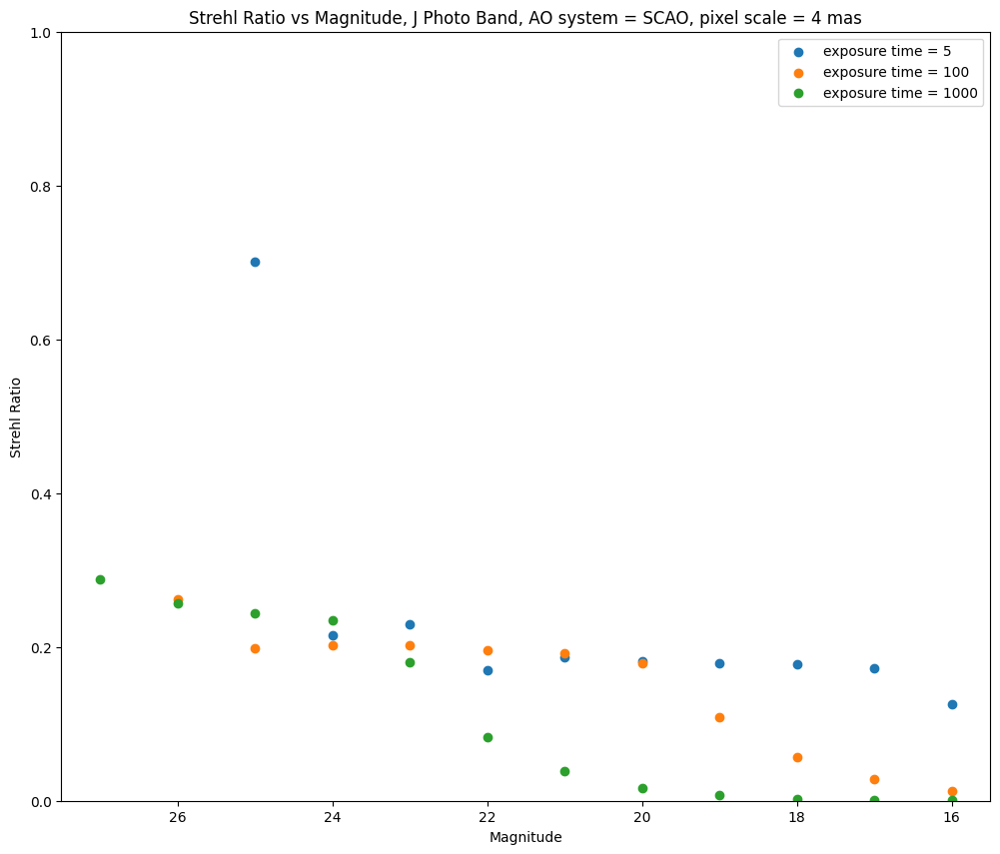

In [95]:
plt.figure(figsize=(12,10))
#plt.scatter(ampslistALL, strehllistJSCAO4ex1, label = "exposure time = 1")
#plt.scatter(ampslistALL, strehllistJSCAO4ex2, label = "exposure time = 2")
plt.scatter(ampslistALL, strehllistJSCAO4ex5, label = "exposure time = 5")
#plt.scatter(ampslistALL, strehllistJSCAO4ex10, label = "exposure time = 10")
plt.scatter(ampslistALL, strehllistJSCAO4ex100, label = "exposure time = 100")
plt.scatter(ampslistALL, strehllistJSCAO4ex1000, label = "exposure time = 1000")
plt.xlim(max(ampslistALL)+.5,min(ampslistALL)-.5)
plt.ylim(0,1)
plt.xlabel("Magnitude")
plt.ylabel("Strehl Ratio")
plt.legend()
plt.title("Strehl Ratio vs Magnitude, J Photo Band, AO system = SCAO, pixel scale = 4 mas")

Text(0.5, 1.0, 'Strehl Ratio vs Magnitude, J Photo Band, AO system = MCAO, pixel scale = 4 mas')

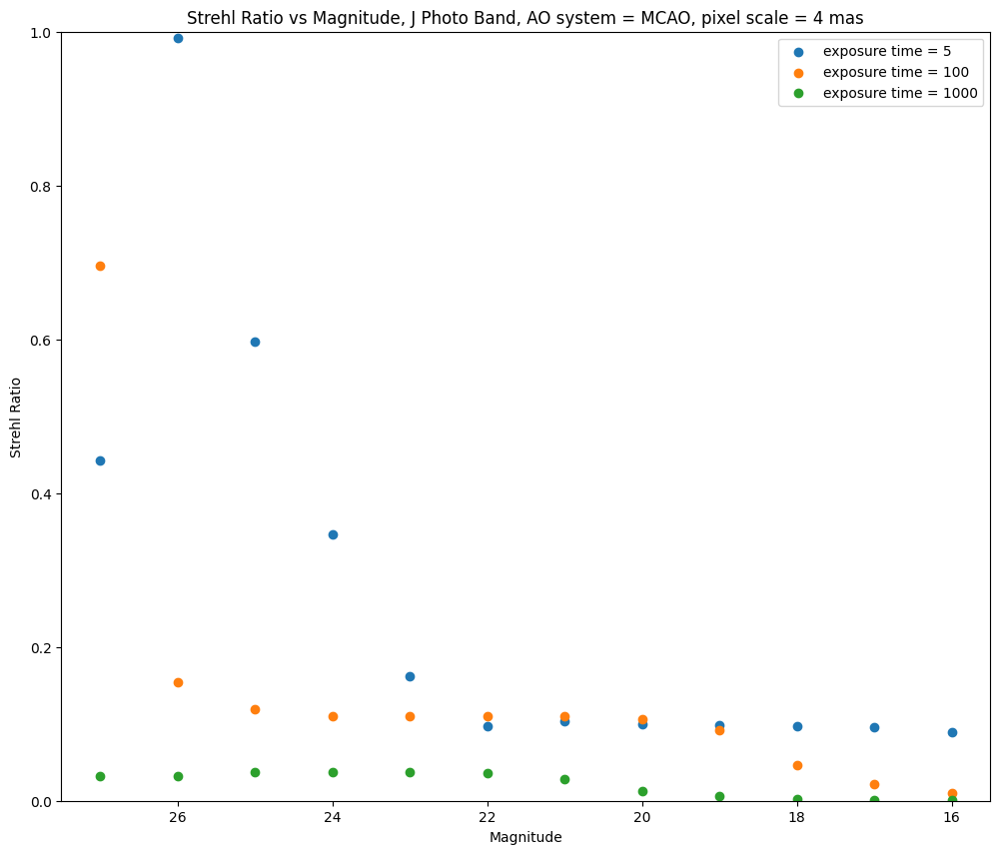

In [96]:
plt.figure(figsize=(12,10))
#plt.scatter(ampslistALL, strehllistJMCAO4ex1, label = "exposure time = 1")
#plt.scatter(ampslistALL, strehllistJMCAO4ex2, label = "exposure time = 2")
plt.scatter(ampslistALL, strehllistJMCAO4ex5, label = "exposure time = 5")
#plt.scatter(ampslistALL, strehllistJMCAO4ex10, label = "exposure time = 10")
plt.scatter(ampslistALL, strehllistJMCAO4ex100, label = "exposure time = 100")
plt.scatter(ampslistALL, strehllistJMCAO4ex1000, label = "exposure time = 1000")
plt.xlim(max(ampslistALL)+.5,min(ampslistALL)-.5)
plt.ylim(0,1)
plt.xlabel("Magnitude")
plt.ylabel("Strehl Ratio")
plt.legend()
plt.title("Strehl Ratio vs Magnitude, J Photo Band, AO system = MCAO, pixel scale = 4 mas")

Text(0.5, 1.0, 'Strehl Ratio vs Magnitude, J Photo Band, AO system = SCAO, pixel scale = 1.5 mas')

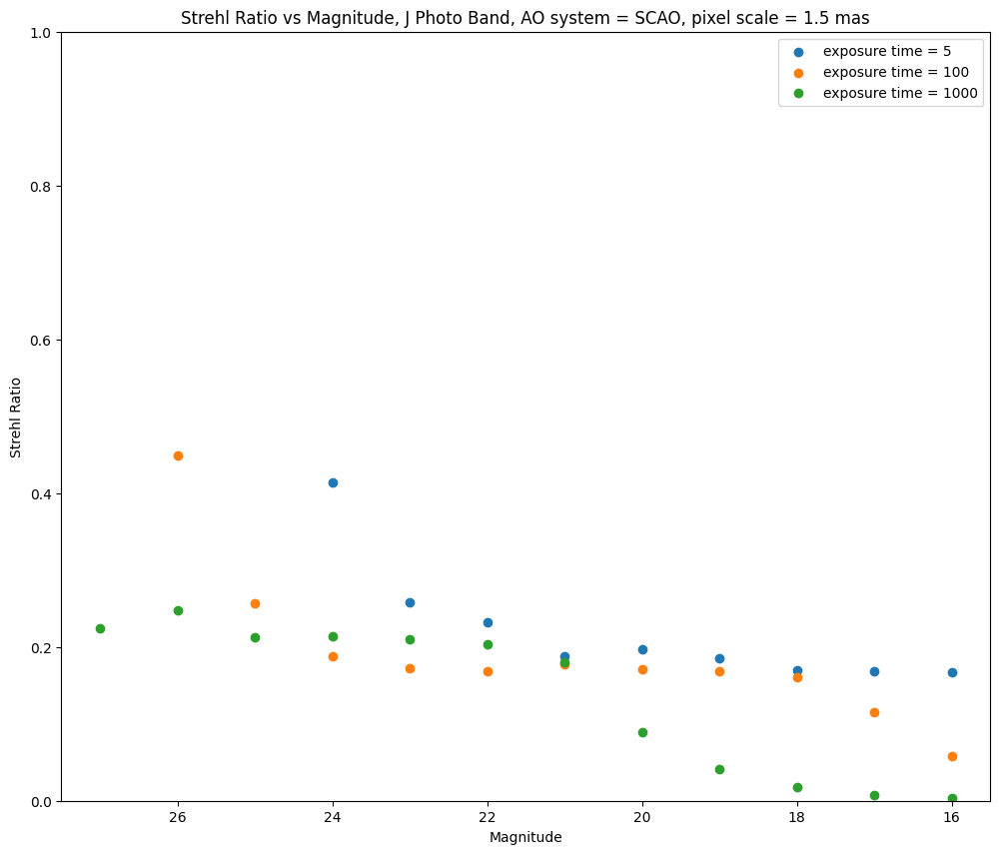

In [97]:
plt.figure(figsize=(12,10))
#plt.scatter(ampslistALL, strehllistJSCAO1p5ex1, label = "exposure time = 1")
#plt.scatter(ampslistALL, strehllistJSCAO1p5ex2, label = "exposure time = 2")
plt.scatter(ampslistALL, strehllistJSCAO1p5ex5, label = "exposure time = 5")
#plt.scatter(ampslistALL, strehllistJSCAO1p5ex10, label = "exposure time = 10")
plt.scatter(ampslistALL, strehllistJSCAO1p5ex100, label = "exposure time = 100")
plt.scatter(ampslistALL, strehllistJSCAO1p5ex1000, label = "exposure time = 1000")
plt.xlim(max(ampslistALL)+.5,min(ampslistALL)-.5)
plt.ylim(0,1)
plt.xlabel("Magnitude")
plt.ylabel("Strehl Ratio")
plt.legend()
plt.title("Strehl Ratio vs Magnitude, J Photo Band, AO system = SCAO, pixel scale = 1.5 mas")

Text(0.5, 1.0, 'Strehl Ratio vs Magnitude, J Photo Band, AO system = MCAO, pixel scale = 1.5 mas')

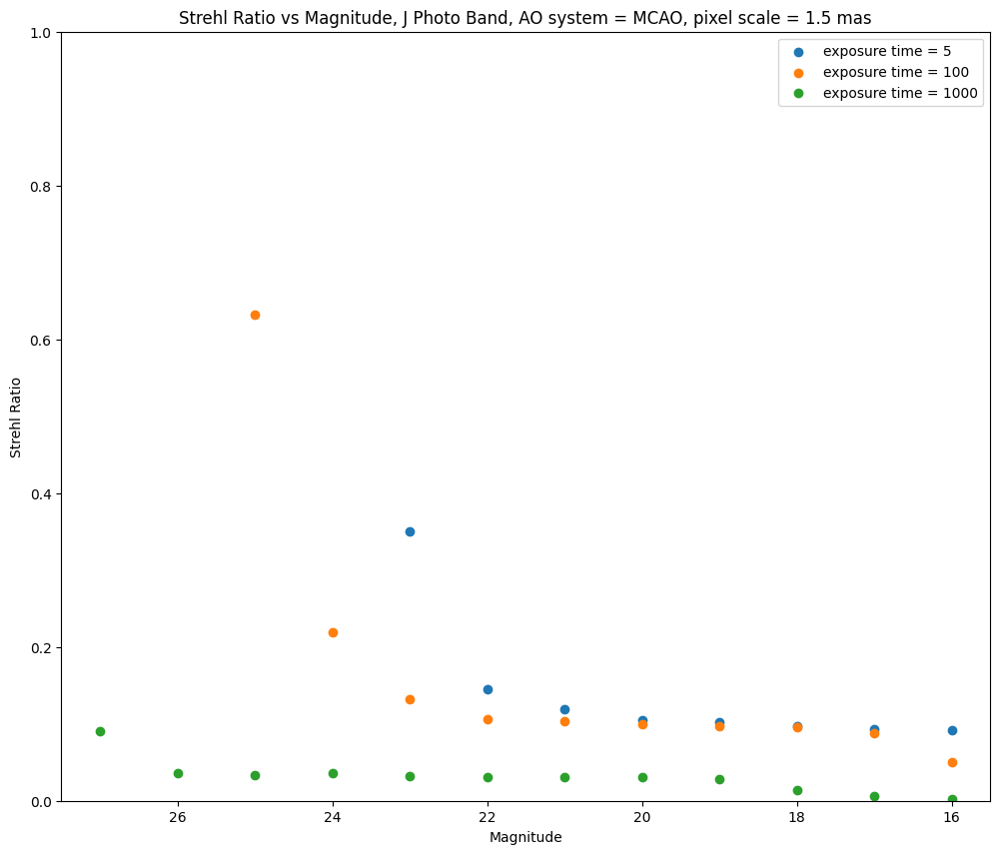

In [98]:
plt.figure(figsize=(12,10))
#plt.scatter(ampslistALL, strehllistJMCAO1p5ex1, label = "exposure time = 1")
#plt.scatter(ampslistALL, strehllistJMCAO1p5ex2, label = "exposure time = 2")
plt.scatter(ampslistALL, strehllistJMCAO1p5ex5, label = "exposure time = 5")
#plt.scatter(ampslistALL, strehllistJMCAO1p5ex10, label = "exposure time = 10")
plt.scatter(ampslistALL, strehllistJMCAO1p5ex100, label = "exposure time = 100")
plt.scatter(ampslistALL, strehllistJMCAO1p5ex1000, label = "exposure time = 1000")
plt.xlim(max(ampslistALL)+.5,min(ampslistALL)-.5)
plt.ylim(0,1)
plt.xlabel("Magnitude")
plt.ylabel("Strehl Ratio")
plt.legend()
plt.title("Strehl Ratio vs Magnitude, J Photo Band, AO system = MCAO, pixel scale = 1.5 mas")

Text(0.5, 1.0, 'Strehl Ratio vs Magnitude, Y Photo Band, AO system = SCAO, pixel scale = 4 mas')

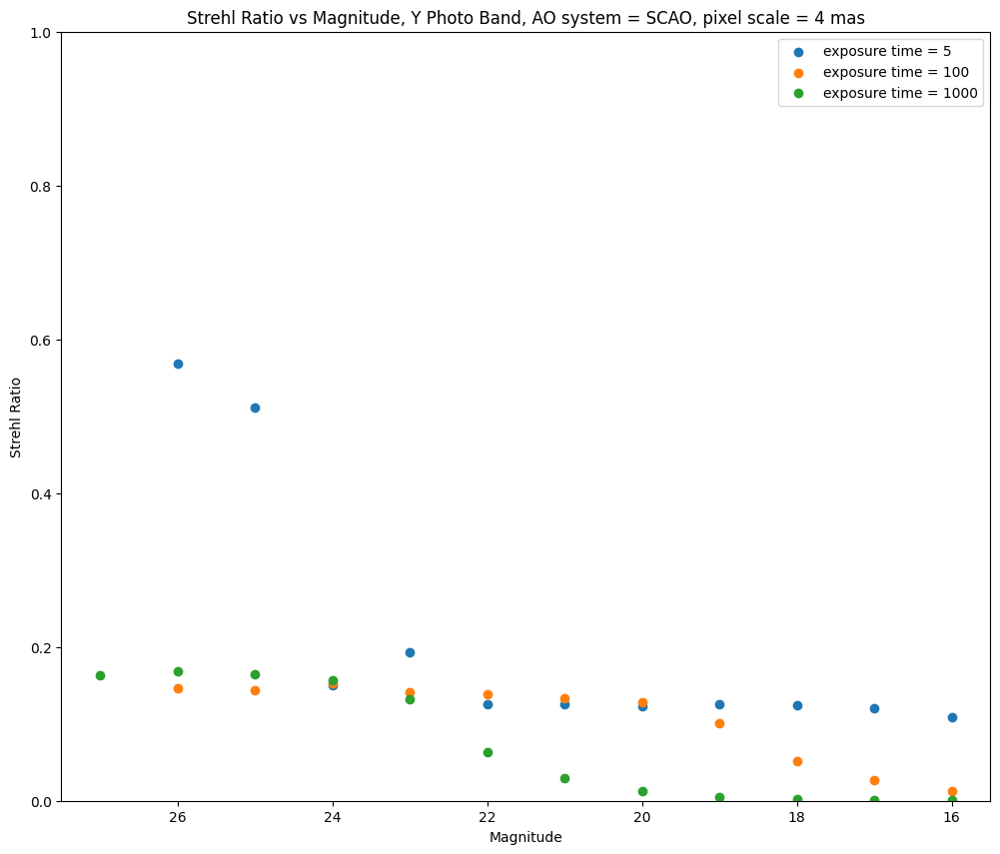

In [99]:
plt.figure(figsize=(12,10))
#plt.scatter(ampslistALL, strehllistYSCAO4ex1, label = "exposure time = 1")
#plt.scatter(ampslistALL, strehllistYSCAO4ex2, label = "exposure time = 2")
plt.scatter(ampslistALL, strehllistYSCAO4ex5, label = "exposure time = 5")
#plt.scatter(ampslistALL, strehllistYSCAO4ex10, label = "exposure time = 10")
plt.scatter(ampslistALL, strehllistYSCAO4ex100, label = "exposure time = 100")
plt.scatter(ampslistALL, strehllistYSCAO4ex1000, label = "exposure time = 1000")
plt.xlim(max(ampslistALL)+.5,min(ampslistALL)-.5)
plt.ylim(0,1)
plt.xlabel("Magnitude")
plt.ylabel("Strehl Ratio")
plt.legend()
plt.title("Strehl Ratio vs Magnitude, Y Photo Band, AO system = SCAO, pixel scale = 4 mas")

Text(0.5, 1.0, 'Strehl Ratio vs Magnitude, Y Photo Band, AO system = MCAO, pixel scale = 4 mas')

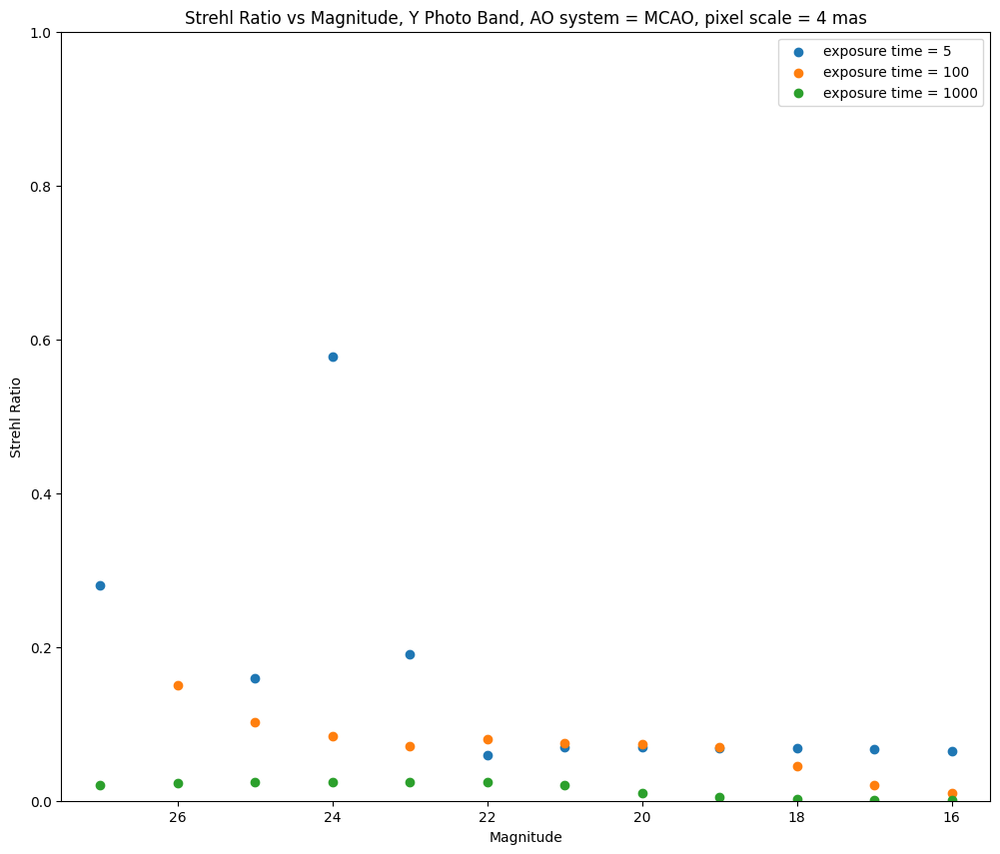

In [100]:
plt.figure(figsize=(12,10))
#plt.scatter(ampslistALL, strehllistYMCAO4ex1, label = "exposure time = 1")
#plt.scatter(ampslistALL, strehllistYMCAO4ex2, label = "exposure time = 2")
plt.scatter(ampslistALL, strehllistYMCAO4ex5, label = "exposure time = 5")
#plt.scatter(ampslistALL, strehllistYMCAO4ex10, label = "exposure time = 10")
plt.scatter(ampslistALL, strehllistYMCAO4ex100, label = "exposure time = 100")
plt.scatter(ampslistALL, strehllistYMCAO4ex1000, label = "exposure time = 1000")
plt.xlim(max(ampslistALL)+.5,min(ampslistALL)-.5)
plt.ylim(0,1)
plt.xlabel("Magnitude")
plt.ylabel("Strehl Ratio")
plt.legend()
plt.title("Strehl Ratio vs Magnitude, Y Photo Band, AO system = MCAO, pixel scale = 4 mas")

Text(0.5, 1.0, 'Strehl Ratio vs Magnitude, Y Photo Band, AO system = SCAO, pixel scale = 1.5 mas')

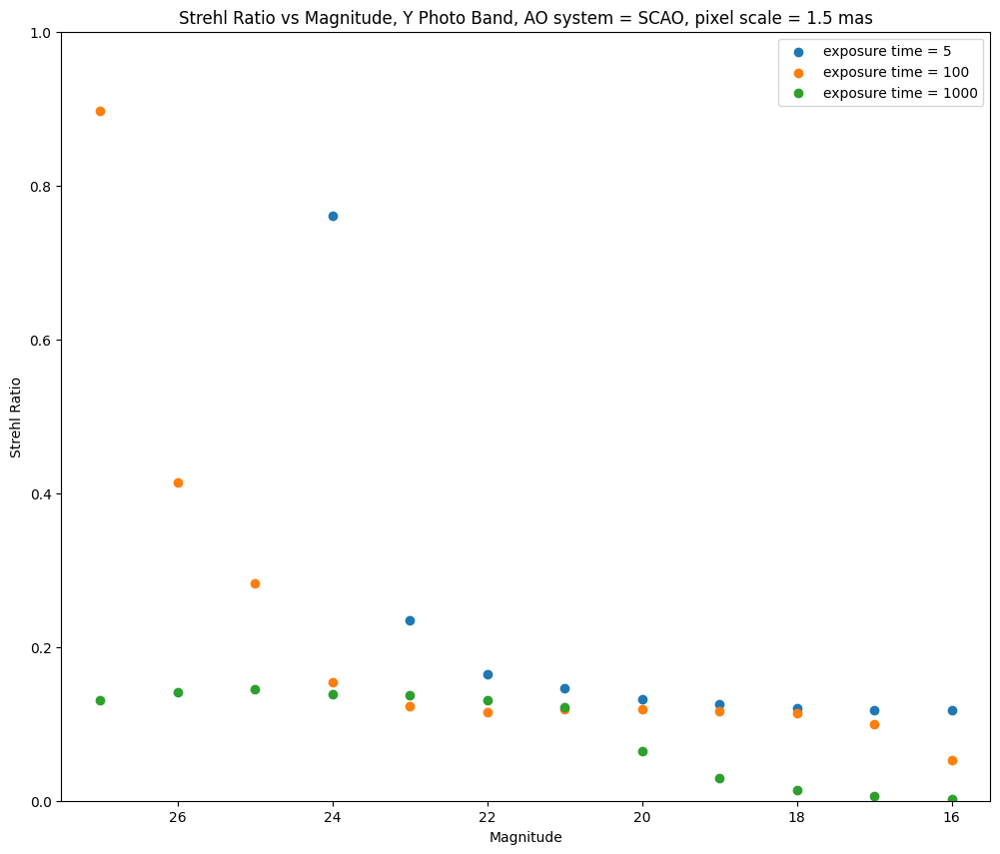

In [101]:
plt.figure(figsize=(12,10))
#plt.scatter(ampslistALL, strehllistYSCAO1p5ex1, label = "exposure time = 1")
#plt.scatter(ampslistALL, strehllistYSCAO1p5ex2, label = "exposure time = 2")
plt.scatter(ampslistALL, strehllistYSCAO1p5ex5, label = "exposure time = 5")
#plt.scatter(ampslistALL, strehllistYSCAO1p5ex10, label = "exposure time = 10")
plt.scatter(ampslistALL, strehllistYSCAO1p5ex100, label = "exposure time = 100")
plt.scatter(ampslistALL, strehllistYSCAO1p5ex1000, label = "exposure time = 1000")
plt.xlim(max(ampslistALL)+.5,min(ampslistALL)-.5)
plt.ylim(0,1)
plt.xlabel("Magnitude")
plt.ylabel("Strehl Ratio")
plt.legend()
plt.title("Strehl Ratio vs Magnitude, Y Photo Band, AO system = SCAO, pixel scale = 1.5 mas")

Text(0.5, 1.0, 'Strehl Ratio vs Magnitude, Y Photo Band, AO system = MCAO, pixel scale = 1.5 mas')

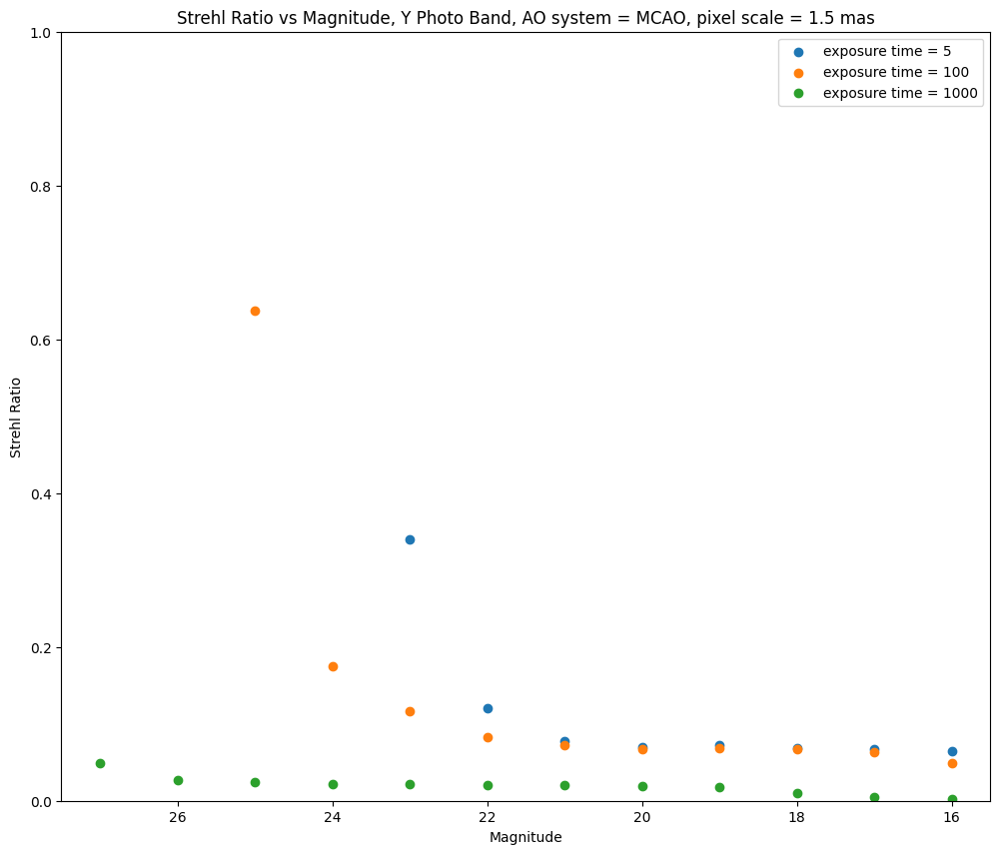

In [102]:
plt.figure(figsize=(12,10))
#plt.scatter(ampslistALL, strehllistYMCAO1p5ex1, label = "exposure time = 1")
#3plt.scatter(ampslistALL, strehllistYMCAO1p5ex2, label = "exposure time = 2")
plt.scatter(ampslistALL, strehllistYMCAO1p5ex5, label = "exposure time = 5")
#plt.scatter(ampslistALL, strehllistYMCAO1p5ex10, label = "exposure time = 10")
plt.scatter(ampslistALL, strehllistYMCAO1p5ex100, label = "exposure time = 100")
plt.scatter(ampslistALL, strehllistYMCAO1p5ex1000, label = "exposure time = 1000")
plt.xlim(max(ampslistALL)+.5,min(ampslistALL)-.5)
plt.ylim(0,1)
plt.xlabel("Magnitude")
plt.ylabel("Strehl Ratio")
plt.legend()
plt.title("Strehl Ratio vs Magnitude, Y Photo Band, AO system = MCAO, pixel scale = 1.5 mas")

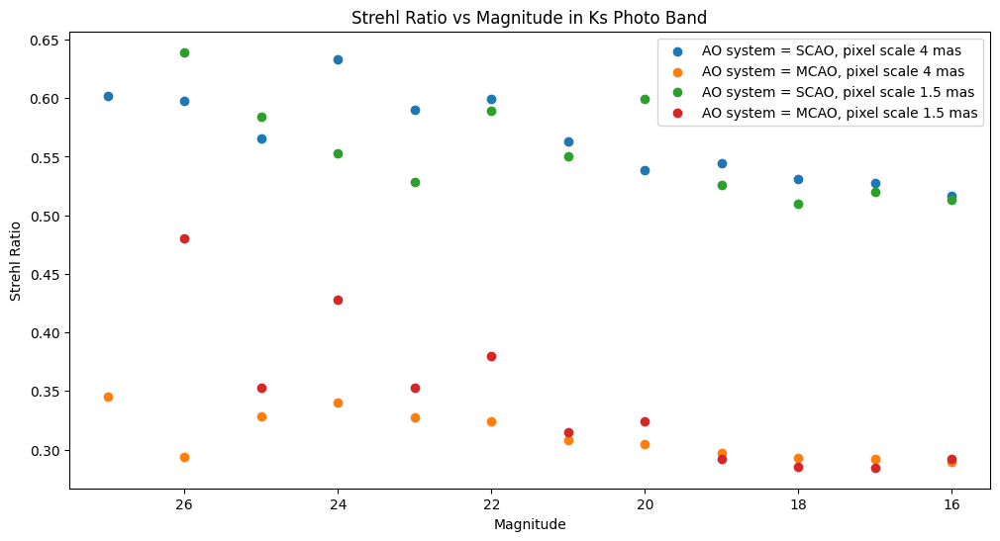

In [59]:
plt.figure(figsize=(12,6))
plt.scatter(ampslist, strehllistKsSCAO4, label = "AO system = SCAO, pixel scale 4 mas")
plt.scatter(ampslist, strehllistKsMCAO4, label = "AO system = MCAO, pixel scale 4 mas")
plt.scatter(ampslist, strehllistKsSCAO1p5, label = "AO system = SCAO, pixel scale 1.5 mas")
plt.scatter(ampslist, strehllistKsMCAO1p5, label = "AO system = MCAO, pixel scale 1.5 mas")
plt.xlim(max(ampslist)+.5,min(ampslist)-.5)
plt.xlabel("Magnitude")
plt.ylabel("Strehl Ratio")
plt.legend()
plt.title("Strehl Ratio vs Magnitude in Ks Photo Band")
plt.show()

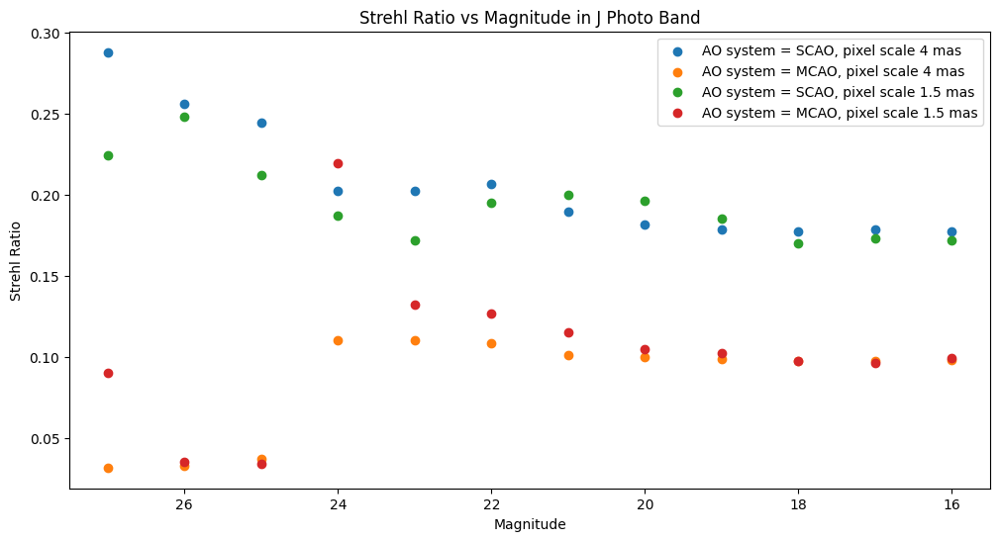

In [60]:
plt.figure(figsize=(12,6))
plt.scatter(ampslist, strehllistJSCAO4, label = "AO system = SCAO, pixel scale 4 mas")
plt.scatter(ampslist, strehllistJMCAO4, label = "AO system = MCAO, pixel scale 4 mas")
plt.scatter(ampslist, strehllistJSCAO1p5, label = "AO system = SCAO, pixel scale 1.5 mas")
plt.scatter(ampslist, strehllistJMCAO1p5, label = "AO system = MCAO, pixel scale 1.5 mas")
plt.xlim(max(ampslist)+.5,min(ampslist)-.5)
plt.xlabel("Magnitude")
plt.ylabel("Strehl Ratio")
plt.legend()
plt.title("Strehl Ratio vs Magnitude in J Photo Band")
plt.show()


In [61]:
#strehl_ratio(19,"SCAO",4,photofilter="Ks")

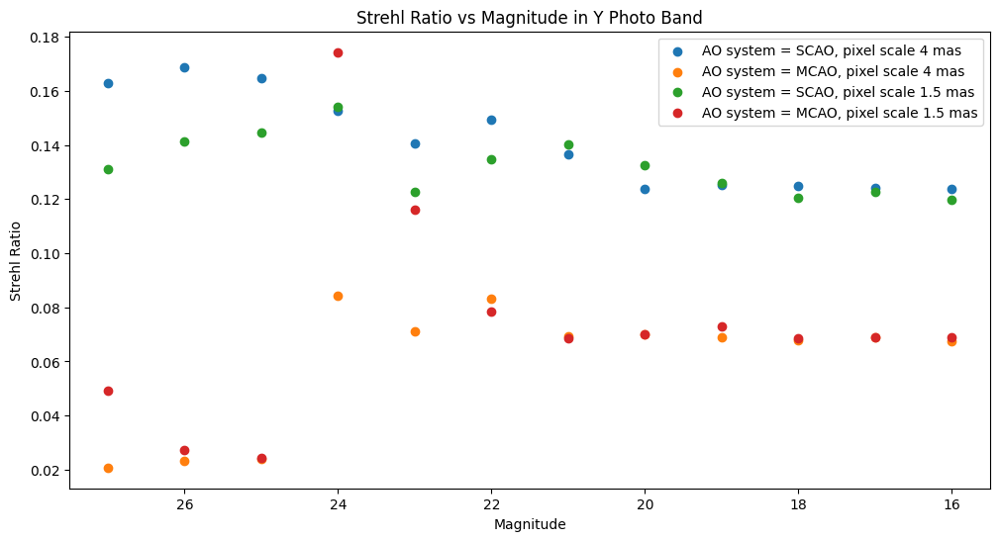

In [62]:
plt.figure(figsize=(12,6))
plt.scatter(ampslist, strehllistYSCAO4, label = "AO system = SCAO, pixel scale 4 mas")
plt.scatter(ampslist, strehllistYMCAO4, label = "AO system = MCAO, pixel scale 4 mas")
plt.scatter(ampslist, strehllistYSCAO1p5, label = "AO system = SCAO, pixel scale 1.5 mas")
plt.scatter(ampslist, strehllistYMCAO1p5, label = "AO system = MCAO, pixel scale 1.5 mas")
plt.xlim(max(ampslist)+.5,min(ampslist)-.5)
plt.xlabel("Magnitude")
plt.ylabel("Strehl Ratio")
plt.legend()
plt.title("Strehl Ratio vs Magnitude in Y Photo Band")
plt.show()

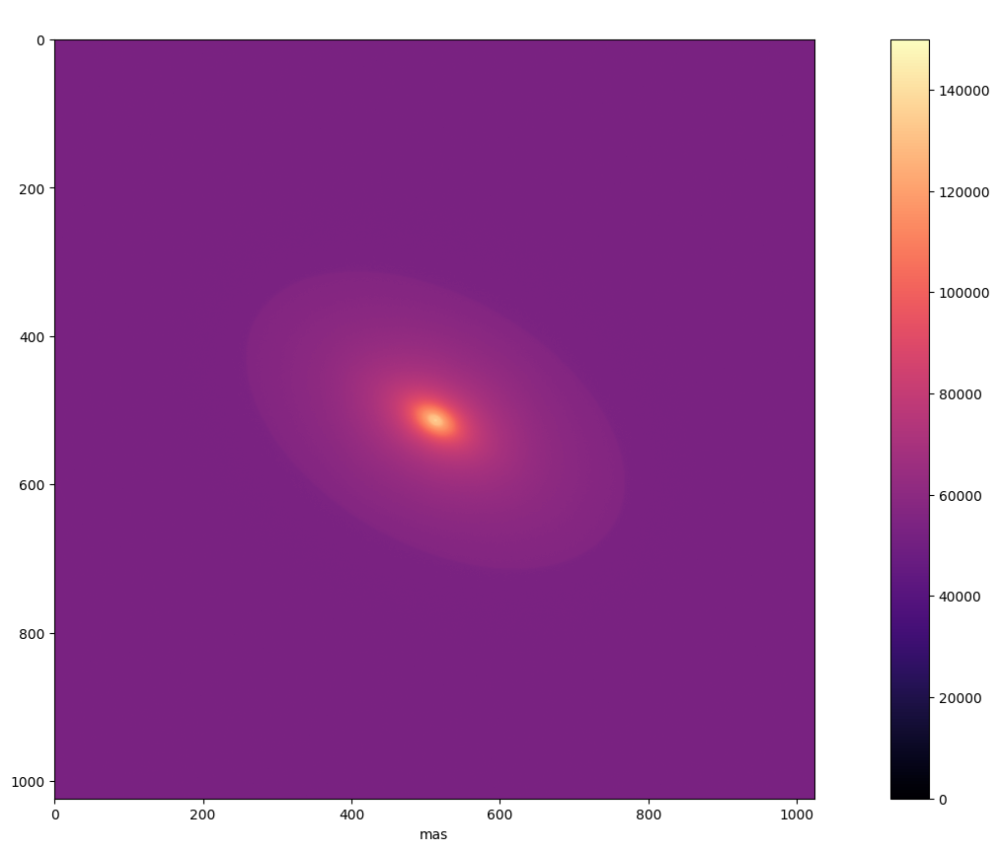

1024 1024


In [7]:
plot_img('galelliptest2_4mas_SCAO_espt1000')

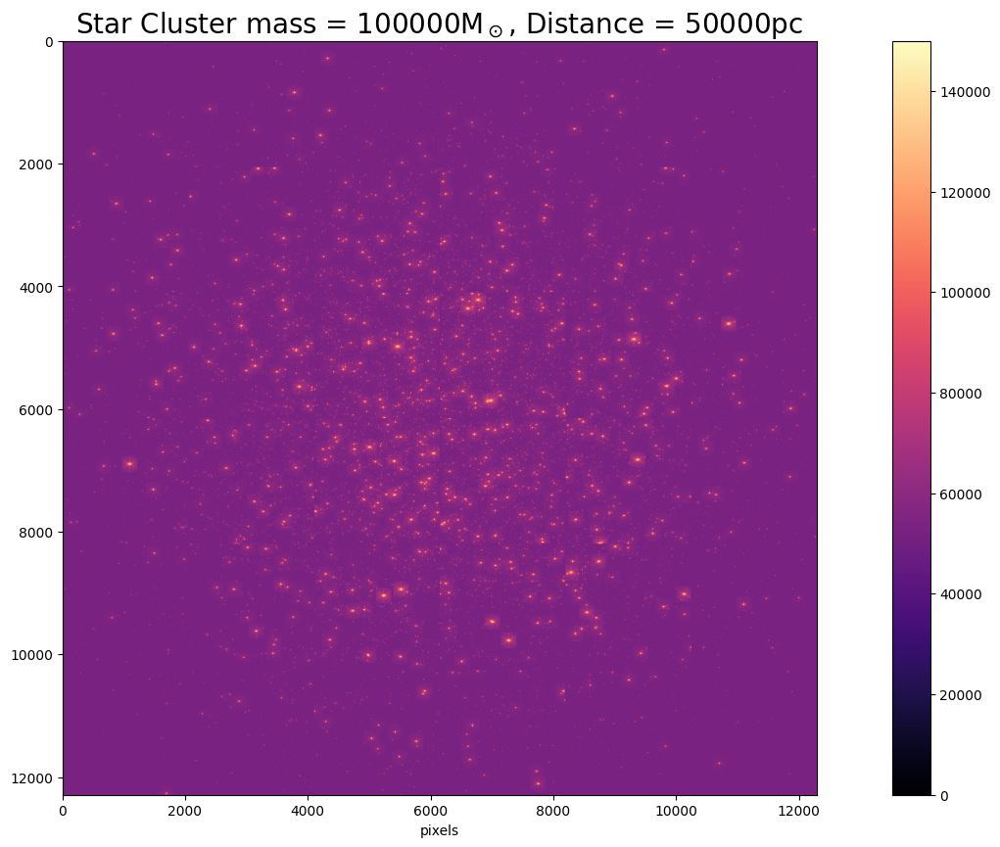

12288 12288


In [5]:
bigcluster = plot_img('bigcluster_4mas_SCAO_espt1000',title=r'Star Cluster mass = 100000M$_\odot$, Distance = 50000pc')


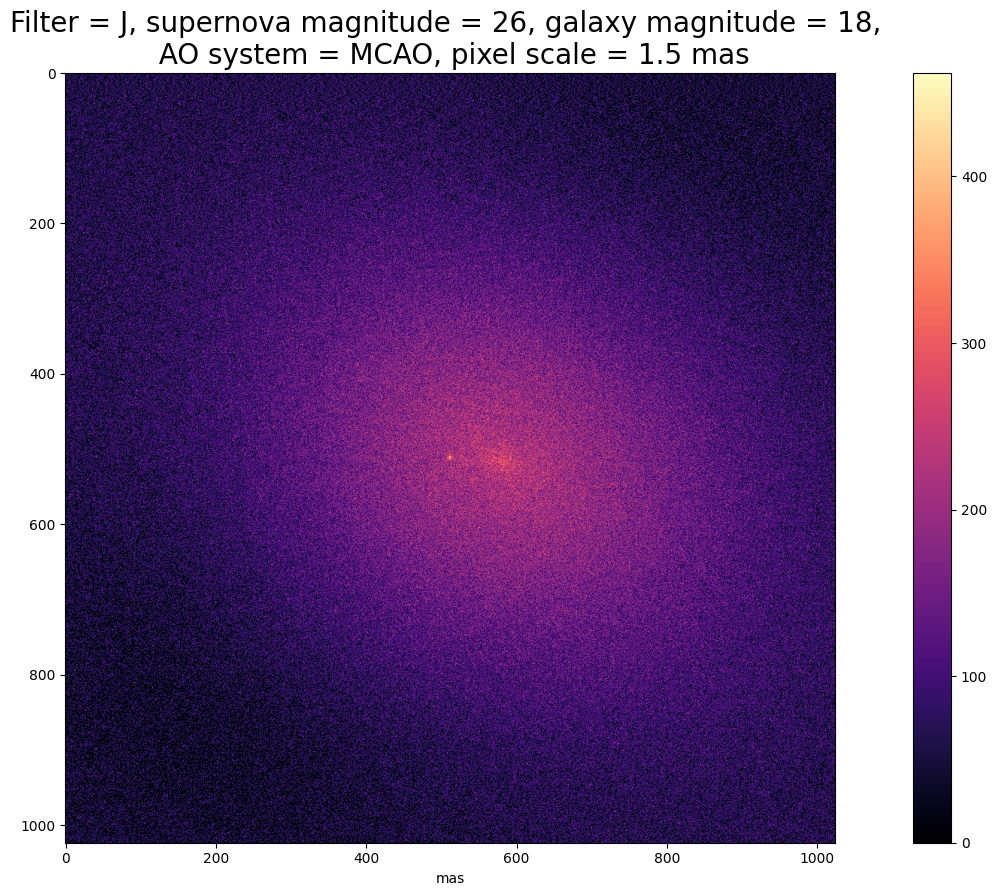

array([[ 61.05456577,  61.0812    ,  60.0096    , ...,  72.94848208,
         38.5776    , 111.8892008 ],
       [  2.1432    ,  94.56648048,  82.5132    , ...,  36.4344    ,
         57.8664    , 145.53384545],
       [  5.358     , -31.0764    ,  90.0144    , ...,  72.8688    ,
         38.5776    ,  60.0096    ],
       ...,
       [  7.5012    , 110.70240641,  67.86504064, ...,  61.0812    ,
         42.864     , 132.30264865],
       [ -4.2864    ,  -4.2864    ,   6.4296    , ..., 104.29056256,
         96.0720032 ,  -6.4296    ],
       [ 60.0096    ,  52.5084    , 106.5312008 , ...,  13.9308    ,
         56.7948    ,  61.0812    ]])

In [11]:
reduce_and_plot('galJ18nova26_1p5mas_MCAO_espt1000',sky="emptyskyJ_1.5mas_MCAO_espt1000", photofilter="J",AO="MCAO",pixscale="1.5 mas", galmag=18, novamag=26)

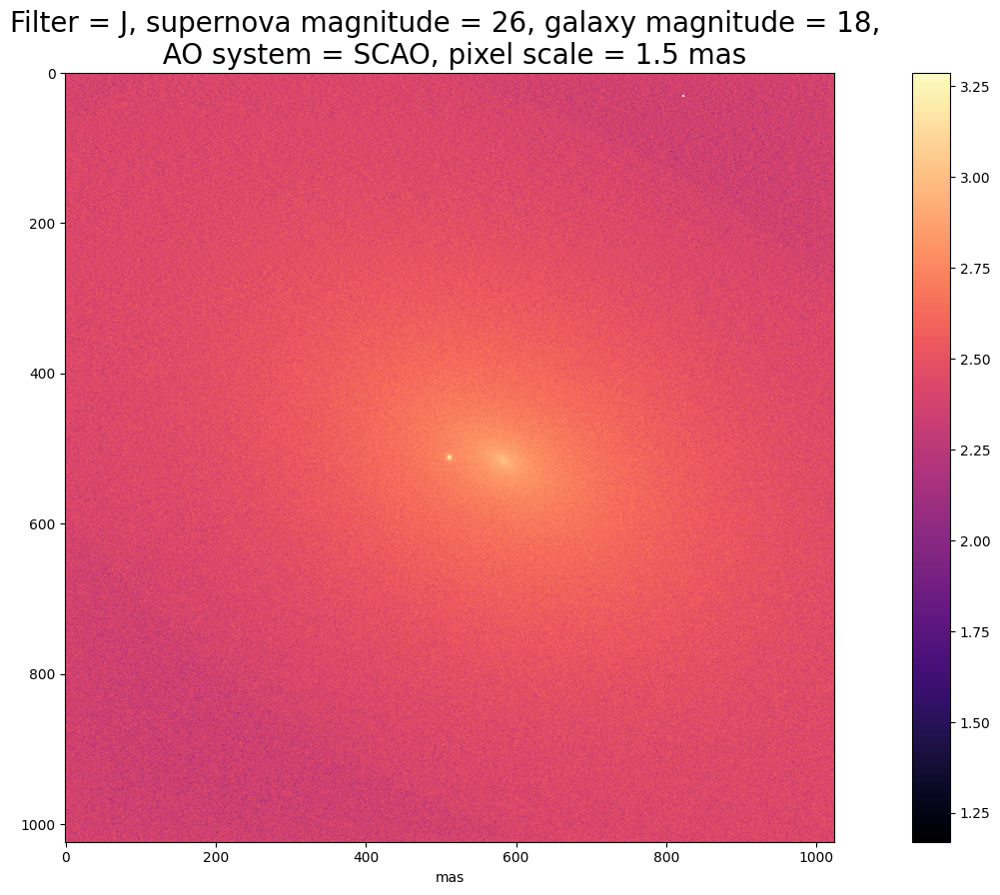

In [13]:
galarray = reduce_and_plot_log('galJ18nova26_1p5mas_SCAO_espt1000',sky="emptyskyJ_1.5mas_SCAO_espt1000", photofilter="J",AO="SCAO",pixscale="1.5 mas", galmag=18, novamag=26)

In [14]:
print(galarray.min())

0.0


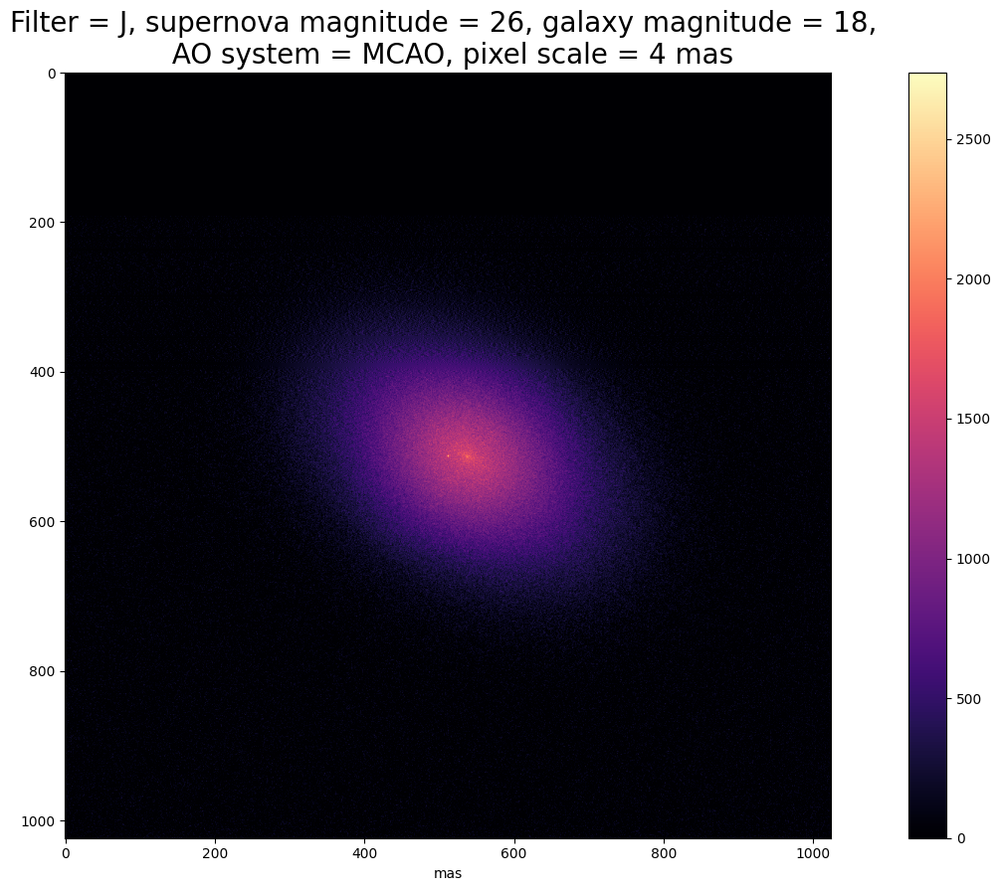

array([[   0.        ,    0.        ,    0.        , ...,    0.        ,
           0.        ,    0.        ],
       [   0.        ,    0.        ,    0.        , ...,    0.        ,
           0.        ,    0.        ],
       [   0.        ,    0.        ,    0.        , ...,    0.        ,
           0.        ,    0.        ],
       ...,
       [  -6.01885714,   10.03142857,   91.286     , ...,  138.43371429,
        -212.66628571, -206.64742857],
       [  97.30485714,   27.08485714,  -27.08485714, ...,  -21.066     ,
         -93.29228571,  -90.28285714],
       [-150.47142857, -140.44      ,  -22.06914286, ...,   -5.01571429,
        -112.352     ,  106.33314286]])

In [24]:
reduce_and_plot('galJ18nova26_4mas_MCAO_espt1000',sky="emptyskyJ_4mas_MCAO_espt1000", photofilter="J",AO="MCAO",pixscale="4 mas", galmag=18, novamag=26)

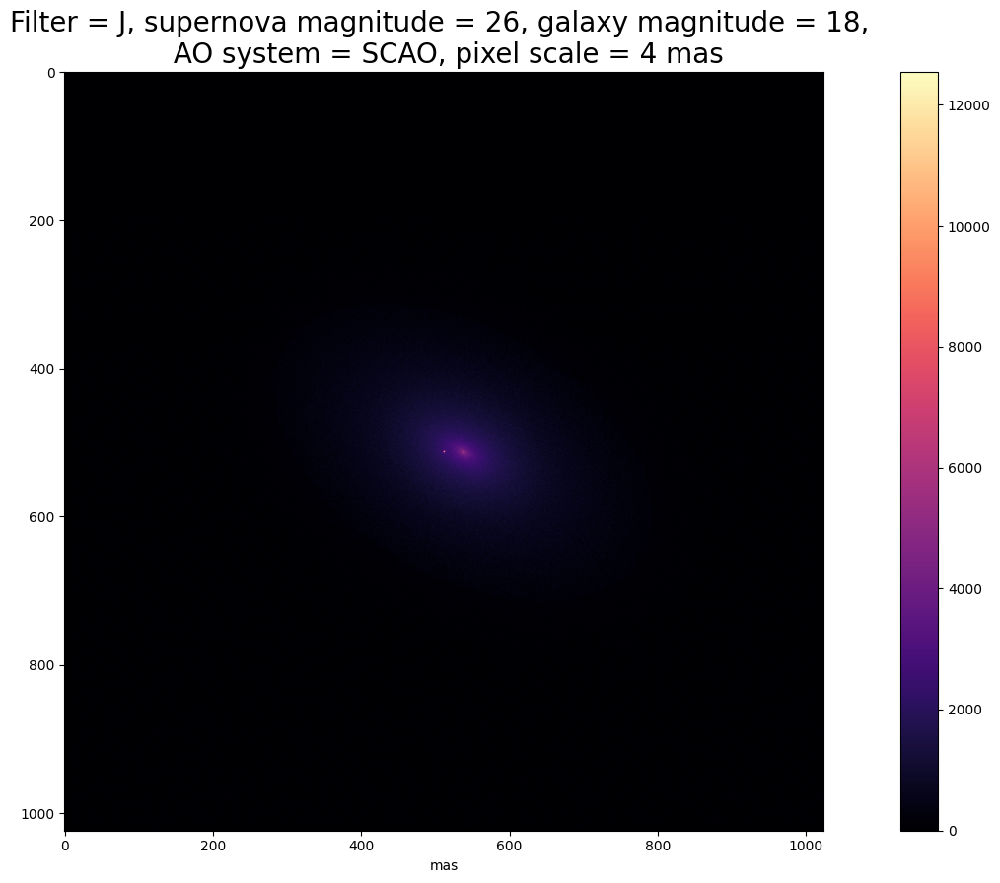

array([[   0.  ,    0.  ,    0.  , ...,    0.  ,    0.  ,    0.  ],
       [   0.  ,    0.  ,    0.  , ...,    0.  ,    0.  ,    0.  ],
       [   0.  ,    0.  ,    0.  , ...,    0.  ,    0.  ,    0.  ],
       ...,
       [ 101.97,    9.9 ,  148.5 , ...,   98.01,  256.41,   54.45],
       [-297.99,   30.69, -128.7 , ...,   46.53,   56.43,  196.02],
       [-147.51,  -92.07,  -15.84, ...,  140.58,  103.95,    5.94]])

In [23]:
reduce_and_plot('galJ18nova26_4mas_SCAO_espt1000',sky="emptyskyJ_4mas_SCAO_espt1000", photofilter="J",AO="SCAO",pixscale="4 mas", galmag=18, novamag=26)

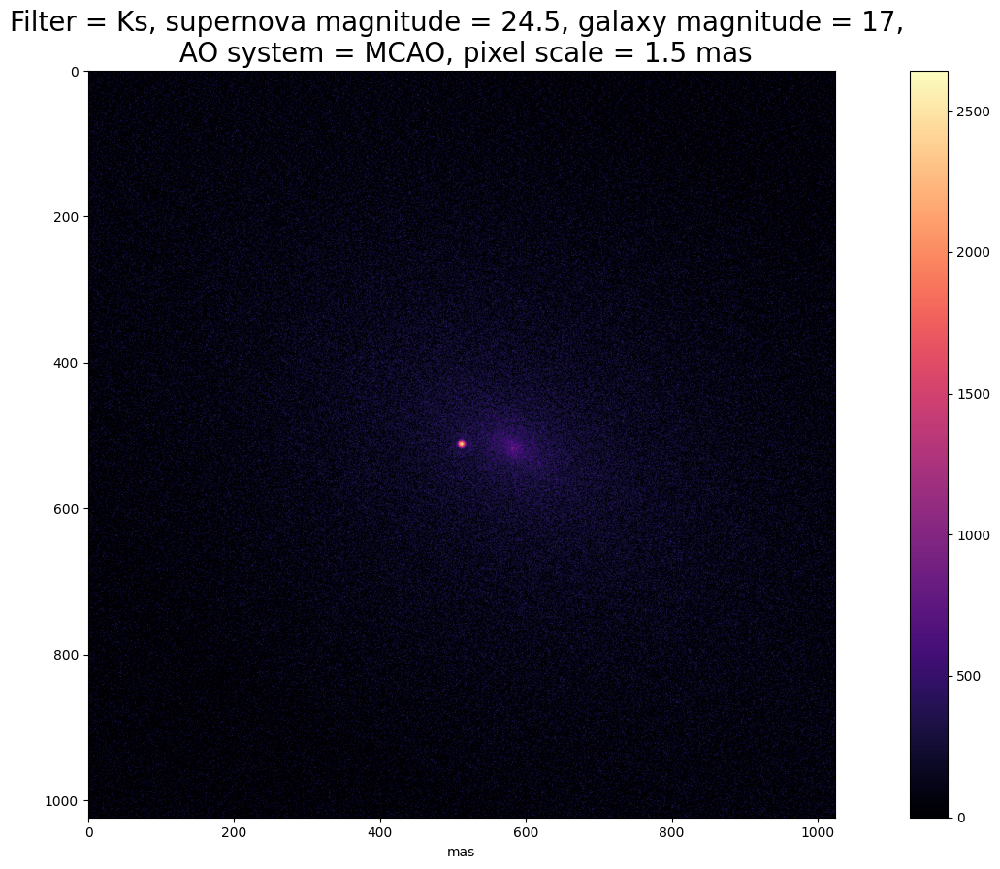

array([[  53.46,   53.46,   52.47, ...,  130.68,  -31.68,  134.64],
       [  38.61,  180.18, -251.46, ...,  129.69,   97.02, -144.54],
       [ 166.32,  -79.2 ,  158.4 , ...,   44.55, -112.86,   72.27],
       ...,
       [  35.64,   40.59,  -91.08, ...,   -3.96,   24.75,  -25.74],
       [  22.77,  -95.04,  161.37, ...,  -65.34,   29.7 ,   59.4 ],
       [ -89.1 ,   29.7 ,  164.34, ...,  172.26,   96.03,   23.76]])

In [22]:
reduce_and_plot('gal17nova24p5_1p5mas_MCAO_espt1000',sky = "emptysky_1.5mas_MCAO_espt1000", photofilter="Ks", AO="MCAO", pixscale="1.5 mas", galmag=17, novamag=24.5)

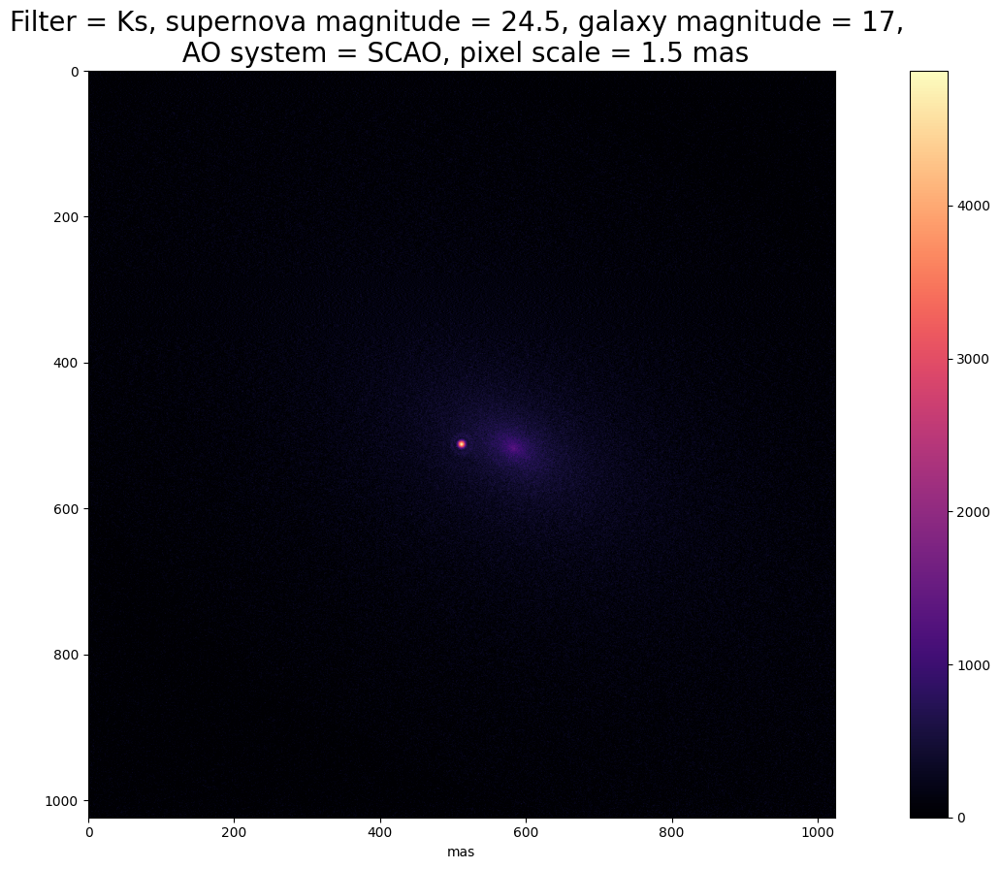

array([[  53.46,   52.47,   49.5 , ..., -117.81,  198.99,   64.35],
       [ 204.93, -158.4 ,  -51.48, ...,   42.57,   44.55,   47.52],
       [  48.51,   47.52,   43.56, ...,  150.48,   97.02,  -80.19],
       ...,
       [ 193.05,   -1.98,   21.78, ...,  316.8 ,    5.94,  -51.48],
       [ 127.71,  176.22,  242.55, ...,  142.56,   46.53,  110.88],
       [  61.38,  199.98,   45.54, ...,   39.6 ,   92.07,   22.77]])

In [21]:
reduce_and_plot('gal17nova24p5_1p5mas_SCAO_espt1000',sky = "emptysky_1.5mas_SCAO_espt1000", photofilter="Ks", AO="SCAO", pixscale="1.5 mas", galmag=17, novamag=24.5)

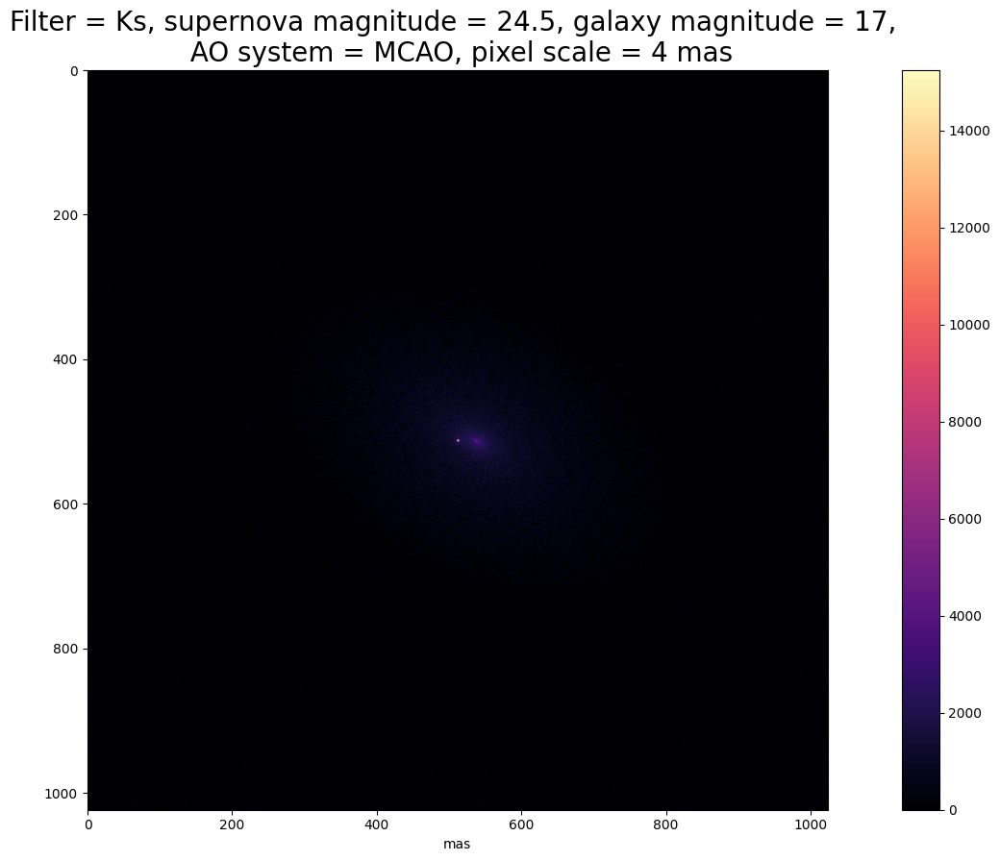

array([[   0.   ,    0.   ,    0.   , ...,    0.   ,    0.   ,    0.   ],
       [   0.   ,    0.   ,    0.   , ...,    0.   ,    0.   ,    0.   ],
       [   0.   ,    0.   ,    0.   , ...,    0.   ,    0.   ,    0.   ],
       ...,
       [ 730.216,  765.912,  114.848, ...,  413.76 ,  617.696, -172.272],
       [-271.6  , -676.672,  -29.488, ...,  -24.056,   82.256, -528.456],
       [  44.232,  288.672, -103.208, ...,  -18.624, -124.16 ,   72.944]])

In [20]:
reduce_and_plot('gal17nova24p5_4mas_MCAO_espt1000',sky = "emptysky_4mas_MCAO_espt1000", photofilter="Ks", AO="MCAO", pixscale="4 mas", galmag=17, novamag=24.5)

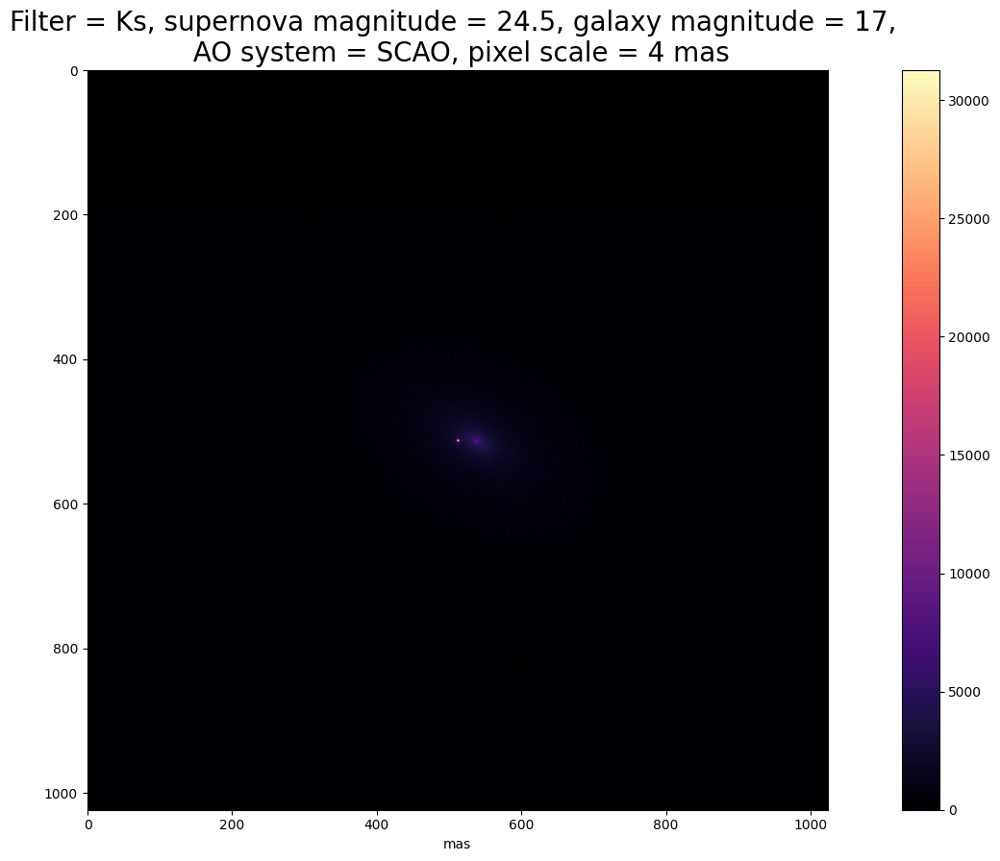

array([[   0.        ,    0.        ,    0.        , ...,    0.        ,
           0.        ,    0.        ],
       [   0.        ,    0.        ,    0.        , ...,    0.        ,
           0.        ,    0.        ],
       [   0.        ,    0.        ,    0.        , ...,    0.        ,
           0.        ,    0.        ],
       ...,
       [ 335.46914286, -157.55542857,  331.04342857, ...,   69.92628571,
        -296.52285714,  194.73142857],
       [  -7.96628571,  528.43028571,  302.71885714, ...,  -13.27714286,
        -318.65142857, -215.97485714],
       [-146.93371429, -454.07828571, -416.90228571, ..., -188.53542857,
          45.14228571,  -46.02742857]])

In [18]:
reduce_and_plot('gal17nova24p5_4mas_SCAO_espt1000',sky = "emptysky_4mas_SCAO_espt1000", photofilter="Ks", AO="SCAO", pixscale="4 mas", galmag=17, novamag=24.5)

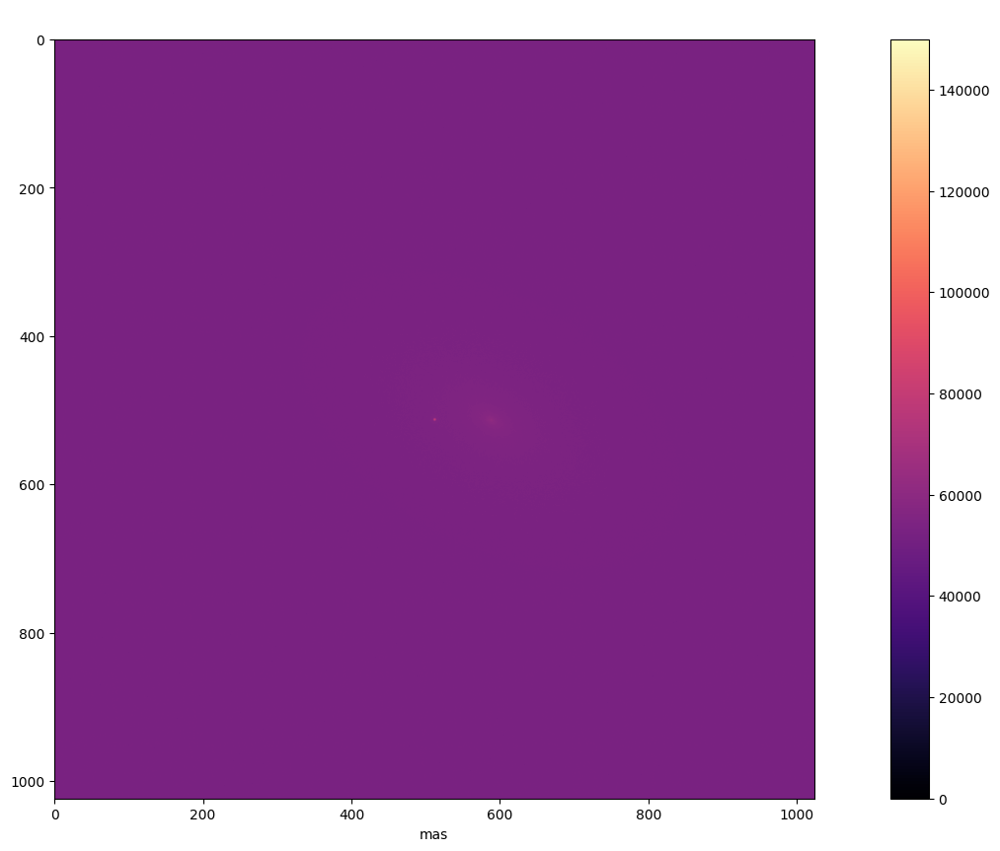

1024 1024


In [5]:
plot_img('gal17nova24p5_4mas_SCAO_espt1000',title=r' ')

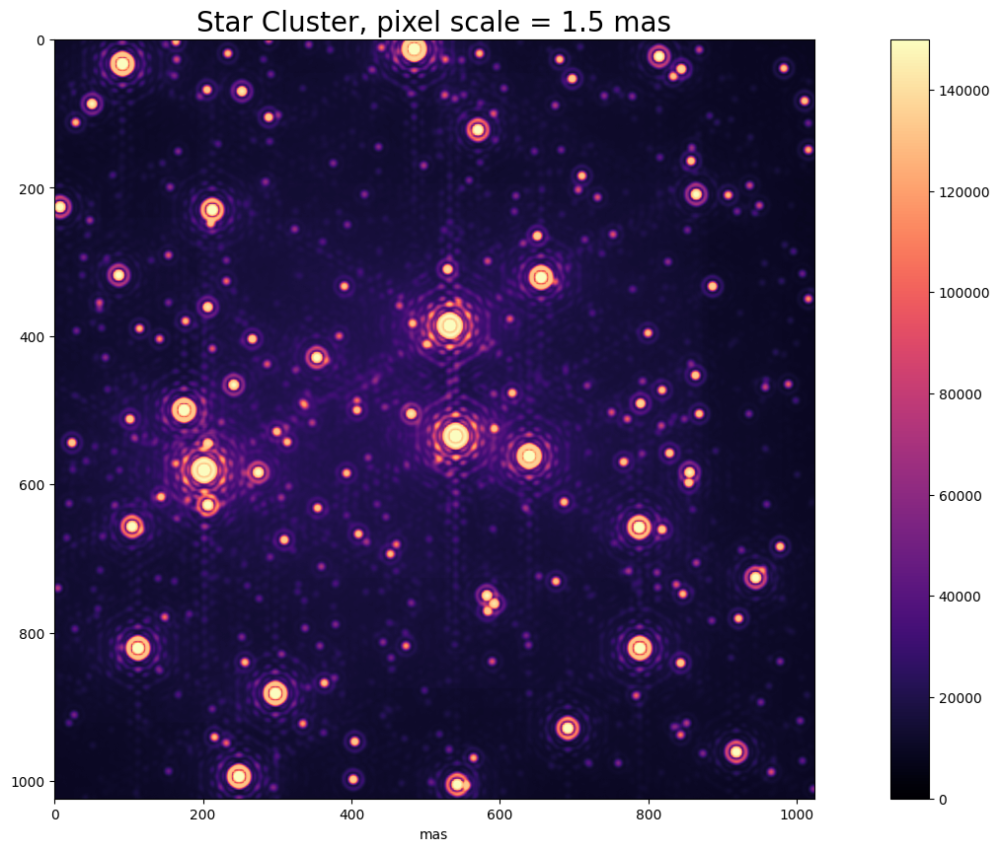

1024 1024


In [36]:
plot_img('densecluster_1p5mas_SCAO_espt1000',title=r'Star Cluster, pixel scale = 1.5 mas')

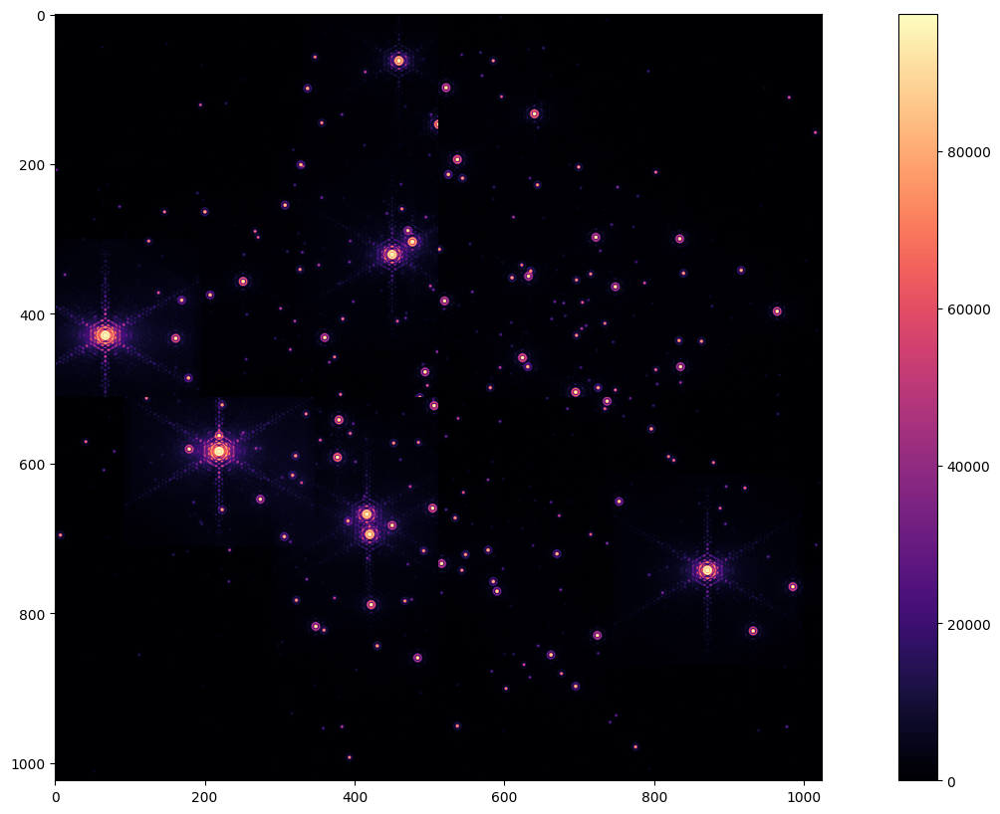

In [28]:
clusterzoom = galSN[5632:6656,5632:6656]
fig, ax = plt.subplots(1,1, figsize=(20,10))
im = ax.imshow(clusterzoom,cmap="magma",vmin=0)
plt.colorbar(im, ax=ax)
plt.show()

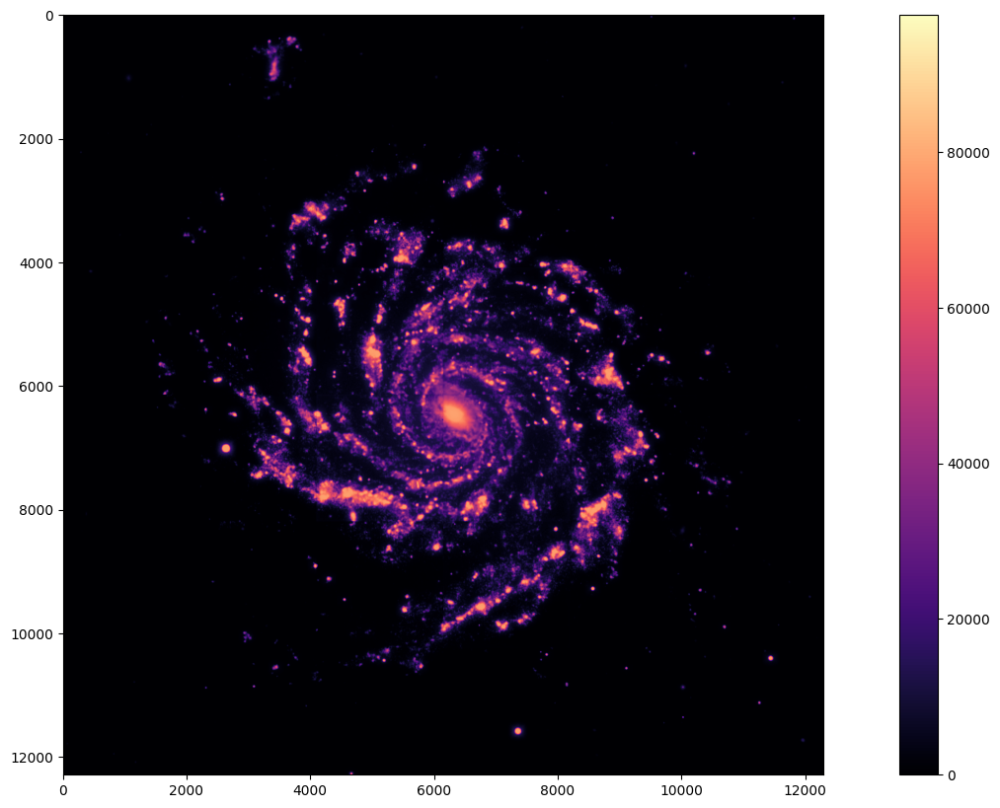

array([[    0.        ,     0.        ,     0.        , ...,
         -621.37028571,   194.73142857,   121.26457143],
       [  173.488     ,  -539.052     ,   387.69257143, ...,
          252.26571429,  -271.73885714,   102.67657143],
       [  -21.24342857,  -529.31542857,   676.24914286, ...,
          439.916     ,  -137.19714286,  -361.13828571],
       ...,
       [ -115.06857143,     7.96628571,   168.17714286, ...,
           74.352     ,   332.81371429,   -96.48057143],
       [-1113.45428571,   -53.10857143,   -53.10857143, ...,
           83.20342857,   125.69028571,   -62.84514286],
       [ -570.032     ,   453.19314286,   120.37942857, ...,
         -491.25428571,   133.65657143,   561.18057143]])

In [23]:
reduce_and_plot('gal2stest_nova5_4mas_SCAO_espt1000','emptysky_fullsize_4mas_SCAO_espt1000')

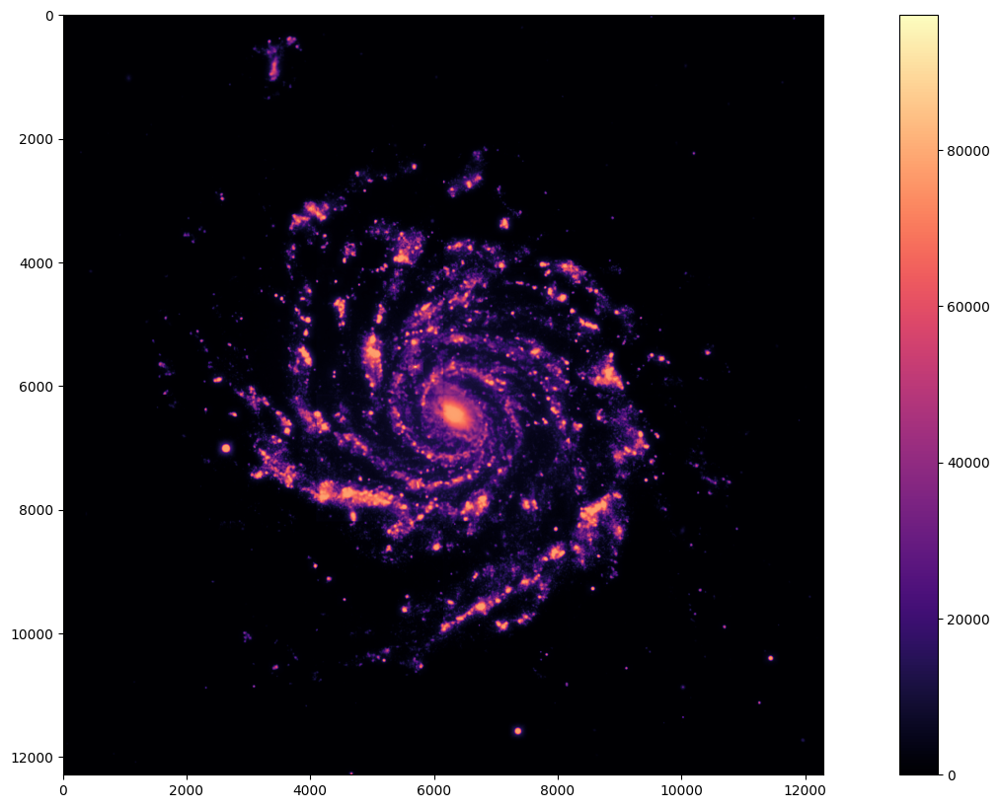

array([[   0.        ,    0.        ,    0.        , ..., -621.37028571,
         194.73142857,  121.26457143],
       [ 173.488     , -539.052     ,  387.69257143, ...,  252.26571429,
        -271.73885714,  102.67657143],
       [ -21.24342857, -529.31542857,  676.24914286, ...,  439.916     ,
        -137.19714286, -361.13828571],
       ...,
       [ 441.68628571,   31.86514286,  439.916     , ..., -177.02857143,
         487.71371429,  425.75371429],
       [-718.68057143,  255.80628571,  109.75771429, ...,  -60.18971429,
         -92.94      , -227.48171429],
       [-504.53142857,  -24.784     ,   34.52057143, ..., -350.51657143,
         -54.87885714,  501.876     ]])

In [25]:
reduce_and_plot('gal2stest_nova1_4mas_SCAO_espt1000','emptysky_fullsize_4mas_SCAO_espt1000')

In [14]:
#plot_img('emptysky_fullsize_4mas_SCAO_espt1000')

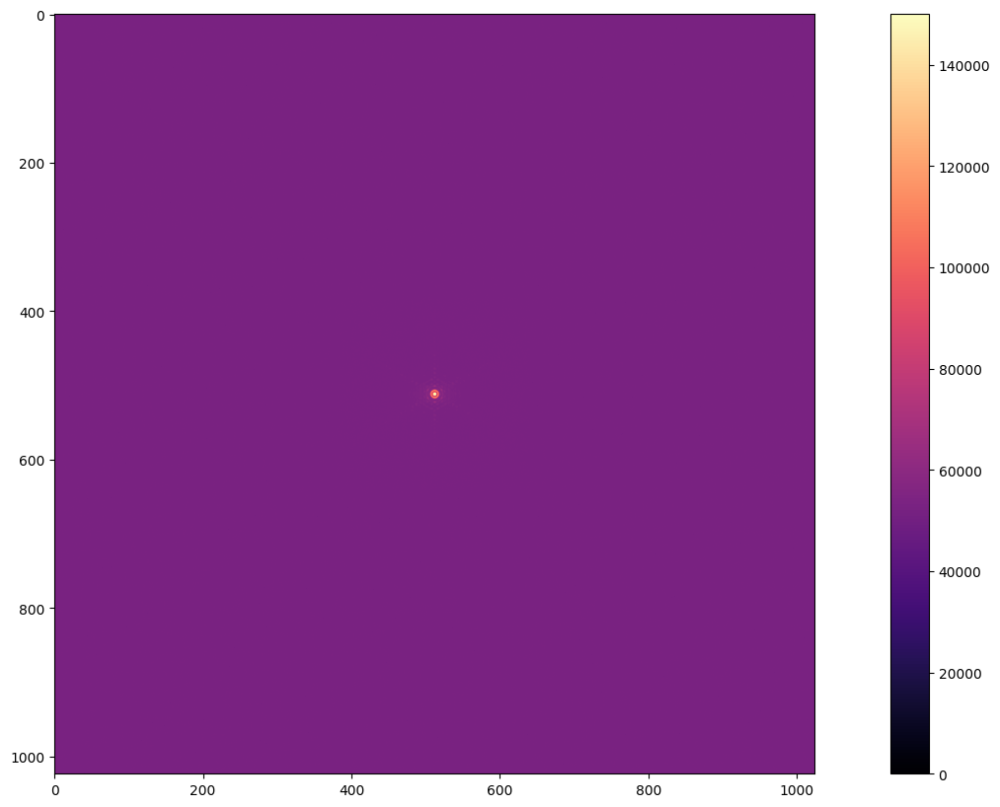

1024 1024


In [13]:
plot_img('point20_Ks_IMG_4mas_SCAO_espt1000')

In [6]:

#namesairmassdefaults = []
#namesairmassMCAO = []
#namesairmass15mas = []
#namesairmassMCAO15mas = []

#for i in np.arange(1,3,.1):
#    namesairmassdefaults.append(makeFits(airmass=i))
#    namesairmassMCAO.append(makeFits(airmass=i,AOsystem="MCAO"))
#    namesairmass15mas.append(makeFits(airmass=i,fov="IMG_1.5mas"))
#    namesairmassMCAO15mas.append(makeFits(airmass=i,AOsystem="MCAO",fov="IMG_1.5mas"))


In [6]:
""" 
names15airmassdefaults = []
names15airmassMCAO = []
names15airmass15mas = []
names15airmassMCAO15mas = []

for i in np.arange(1,3,.1):
    names15airmassdefaults.append(makeFits(amp=15, airmass=i))
    names15airmassMCAO.append(makeFits(amp=15, airmass=i,AOsystem="MCAO"))
    names15airmass15mas.append(makeFits(amp=15, airmass=i,fov="IMG_1.5mas"))
    names15airmassMCAO15mas.append(makeFits(amp=15, airmass=i,AOsystem="MCAO",fov="IMG_1.5mas"))

SyntaxError: incomplete input (1955344918.py, line 1)

In [ ]:
names_amp18_pos1p44_SCAO_4mas = []
names_amp18_pos1p44_MCAO_4mas = []
names_amp18_posp165_SCAO_15mas = []
names_amp18_posp165_MCAO_15mas = []

for i in [-1.44,0,1.44]:
    for j in [-1.44,0,1.44]:
        names_amp18_pos1p44_SCAO_4mas.append(makeFits(xcoord=i,ycoord=j,fov="IMG_4mas", AOsystem="SCAO"))
        names_amp18_pos1p44_MCAO_4mas.append(makeFits(xcoord=i,ycoord=j,fov="IMG_4mas", AOsystem="MCAO"))

for i in [-0.165,0,0.165]:
    for j in [-0.165,0,0.165]:
        names_amp18_posp165_SCAO_15mas.append(makeFits(xcoord=i,ycoord=j,fov="IMG_1.5mas", AOsystem="SCAO"))
        names_amp18_posp165_MCAO_15mas.append(makeFits(xcoord=i,ycoord=j,fov="IMG_1.5mas", AOsystem="MCAO"))

In [ ]:
#defaults, amp range in YJIHK
names_amps1627_fcY_fw1Y_fw2open = []
names_amps1627_fcJ_fw1J_fw2open = []
names_amps1627_fcIlong_fw1Ilong_fw2open = []
names_amps1627_fcH_fw1open_fw2H = []
names_amps1627_fcKs_fw1open_fw2Ks = []

#mcao amp range Ks and J and Y
names_amps1627_fcKs_fw1open_fw2Ks_MCAO = []
names_amps1627_fcJ_fw1J_fw2open_MCAO = []
names_amps1627_fcY_fw1Y_fw2open_MCAO = []

#1.5mas fov amp range Ks and J, both SCAO and MCAO
names_amps1627_fcKs_fw1open_fw2Ks_15mas = []
names_amps1627_fcJ_fw1J_fw2open_15mas = []
names_amps1627_fcY_fw1Y_fw2open_15mas = []
names_amps1627_fcKs_fw1open_fw2Ks_MCAO_15mas = []
names_amps1627_fcJ_fw1J_fw2open_MCAO_15mas = []
names_amps1627_fcY_fw1Y_fw2open_MCAO_15mas = []

#atmospheric conditions Ks and Y
names_amp18_fcKs_fw1open_fw2Ks_airmass13 = []
names_amp18_fcY_fw1Y_fw2open_airmass13 = []

names_amp18_fcKs_fw1open_fw2Ks_temp020 = []
names_amp18_fcY_fw1Y_fw2open_temp020 = []

names_amp18_fcKs_fw1open_fw2Ks_humidity01 = []
names_amp18_fcY_fw1Y_fw2open_humidity01 = []

names_amp18_fcKs_fw1open_fw2Ks_pressure_p51 = []
names_amp18_fcY_fw1Y_fw2open_pressure_p51 = []

for i in np.arange(16,28,1):
    names_amps1627_fcY_fw1Y_fw2open.append(makeFits(amp=i, filt_cur="Y", fw1="Y", fw2="open"))
    names_amps1627_fcJ_fw1J_fw2open.append(makeFits(amp=i, filt_cur="J", fw1="J", fw2="open"))
    names_amps1627_fcIlong_fw1Ilong_fw2open.append(makeFits(amp=i, filt_cur="I", fw1="I-long", fw2="open"))
    names_amps1627_fcH_fw1open_fw2H.append(makeFits(amp=i, filt_cur="H", fw1="open", fw2="H"))
    names_amps1627_fcKs_fw1open_fw2Ks.append(makeFits(amp=i, filt_cur="Ks", fw1="open", fw2="Ks"))
    names_amps1627_fcKs_fw1open_fw2Ks_MCAO.append(makeFits(amp=i, filt_cur="Ks", fw1="open", fw2="Ks", AOsystem="MCAO"))
    names_amps1627_fcJ_fw1J_fw2open_MCAO.append(makeFits(amp=i, filt_cur="J", fw1="J", fw2="open", AOsystem="MCAO"))
    names_amps1627_fcY_fw1Y_fw2open_MCAO.append(makeFits(amp=i, filt_cur="Y", fw1="Y", fw2="open", AOsystem="MCAO"))
    names_amps1627_fcKs_fw1open_fw2Ks_15mas.append(makeFits(amp=i, filt_cur="Ks", fw1="open", fw2="Ks", fov="IMG_1.5mas"))
    names_amps1627_fcJ_fw1J_fw2open_15mas.append(makeFits(amp=i, filt_cur="J", fw1="J", fw2="open", fov="IMG_1.5mas"))
    names_amps1627_fcY_fw1Y_fw2open_15mas.append(makeFits(amp=i, filt_cur="Y", fw1="Y", fw2="open", fov="IMG_1.5mas"))
    names_amps1627_fcKs_fw1open_fw2Ks_MCAO_15mas.append(makeFits(amp=i, filt_cur="Ks", fw1="open", fw2="Ks", AOsystem="MCAO", fov="IMG_1.5mas"))
    names_amps1627_fcJ_fw1J_fw2open_MCAO_15mas.append(makeFits(amp=i, filt_cur="J", fw1="J", fw2="open", AOsystem="MCAO", fov="IMG_1.5mas"))
    names_amps1627_fcY_fw1Y_fw2open_MCAO_15mas.append(makeFits(amp=i, filt_cur="Y", fw1="Y", fw2="open", AOsystem="MCAO", fov="IMG_1.5mas"))

for i in np.arange(1,3,.2):
    names_amp18_fcKs_fw1open_fw2Ks_airmass13.append(makeFits(airmass=i))
    names_amp18_fcY_fw1Y_fw2open_airmass13.append(makeFits(airmass=i, filt_cur="Y", fw1="Y", fw2="open"))

for i in np.arange(0,20,2):
    names_amp18_fcKs_fw1open_fw2Ks_temp020.append(makeFits(temp=i))
    names_amp18_fcY_fw1Y_fw2open_temp020.append(makeFits(temp=i, filt_cur="Y", fw1="Y", fw2="open"))

for i in np.arange(0,1,.1):
    names_amp18_fcKs_fw1open_fw2Ks_humidity01.append(makeFits(humidity=i))
    names_amp18_fcY_fw1Y_fw2open_humidity01.append(makeFits(humidity=i, filt_cur="Y", fw1="Y", fw2="open"))

for i in np.arange(.5,1,.1):
    names_amp18_fcKs_fw1open_fw2Ks_pressure_p51.append(makeFits(pressure=i))
    names_amp18_fcY_fw1Y_fw2open_pressure_p51.append(makeFits(pressure=i, filt_cur="Y", fw1="Y", fw2="open"))

In [49]:

#defaults, amp range in YJIHK
amps1627_fcY_fw1Y_fw2openhPSFs, amps1627_fcY_fw1Y_fw2openvPSFs, amps1627_fcY_fw1Y_fw2openhFWHMs , amps1627_fcY_fw1Y_fw2openvFWHMs = PSF_FWHM_set(names_amps1627_fcY_fw1Y_fw2open,511,511,140,"pixels")
amps1627_fcJ_fw1J_fw2openhPSFs, amps1627_fcJ_fw1J_fw2openvPSFs, amps1627_fcJ_fw1J_fw2openhFWHMs , amps1627_fcJ_fw1J_fw2openvFWHMs = PSF_FWHM_set(names_amps1627_fcJ_fw1J_fw2open,511,511,140,"pixels")
amps1627_fcIlong_fw1Ilong_fw2openhPSFs, amps1627_fcIlong_fw1Ilong_fw2openvPSFs, amps1627_fcIlong_fw1Ilong_fw2openhFWHMs, amps1627_fcIlong_fw1Ilong_fw2openvFWHMs = PSF_FWHM_set(names_amps1627_fcIlong_fw1Ilong_fw2open ,511,511,140,"pixels")
amps1627_fcH_fw1open_fw2HhPSFs, amps1627_fcH_fw1open_fw2HvPSFs, amps1627_fcH_fw1open_fw2HhFWHMs, amps1627_fcH_fw1open_fw2HvFWHMs = PSF_FWHM_set(names_amps1627_fcH_fw1open_fw2H ,511,511,140,"pixels")
amps1627_fcKs_fw1open_fw2KshPSFs, amps1627_fcKs_fw1open_fw2KsvPSFs, amps1627_fcKs_fw1open_fw2KshFWHMs, amps1627_fcKs_fw1open_fw2KsvFWHMs = PSF_FWHM_set(names_amps1627_fcKs_fw1open_fw2Ks ,511,511,140,"pixels")

#mcao amp range Ks and J
amps1627_fcKs_fw1open_fw2Ks_MCAOhPSFs, amps1627_fcKs_fw1open_fw2Ks_MCAOvPSFs, amps1627_fcKs_fw1open_fw2Ks_MCAOhFWHMs, amps1627_fcKs_fw1open_fw2Ks_MCAOvFWHMs = PSF_FWHM_set(names_amps1627_fcKs_fw1open_fw2Ks_MCAO ,511,511,140,"pixels")
amps1627_fcJ_fw1J_fw2open_MCAOhPSFs, amps1627_fcJ_fw1J_fw2open_MCAOvPSFs, amps1627_fcJ_fw1J_fw2open_MCAOhFWHMs , amps1627_fcJ_fw1J_fw2open_MCAOvFWHMs = PSF_FWHM_set(names_amps1627_fcJ_fw1J_fw2open_MCAO ,511,511,140,"pixels")
amps1627_fcY_fw1Y_fw2open_MCAOhPSFs, amps1627_fcY_fw1Y_fw2open_MCAOvPSFs, amps1627_fcY_fw1Y_fw2open_MCAOhFWHMs , amps1627_fcY_fw1Y_fw2open_MCAOvFWHMs = PSF_FWHM_set(names_amps1627_fcY_fw1Y_fw2open_MCAO ,511,511,140,"pixels")

#1.5mas fov amp range Ks and J, both SCAO and MCAO
amps1627_fcKs_fw1open_fw2Ks_15mashPSFs, amps1627_fcKs_fw1open_fw2Ks_15masvPSFs, amps1627_fcKs_fw1open_fw2Ks_15mashFWHMs, amps1627_fcKs_fw1open_fw2Ks_15masvFWHMs = PSF_FWHM_set(names_amps1627_fcKs_fw1open_fw2Ks_15mas ,511,511,400,"pixels")
amps1627_fcJ_fw1J_fw2open_15mashPSFs, amps1627_fcJ_fw1J_fw2open_15masvPSFs, amps1627_fcJ_fw1J_fw2open_15mashFWHMs , amps1627_fcJ_fw1J_fw2open_15masvFWHMs = PSF_FWHM_set(names_amps1627_fcJ_fw1J_fw2open_15mas ,511,511,400,"pixels")
amps1627_fcY_fw1Y_fw2open_15mashPSFs, amps1627_fcY_fw1Y_fw2open_15masvPSFs, amps1627_fcY_fw1Y_fw2open_15mashFWHMs , amps1627_fcY_fw1Y_fw2open_15masvFWHMs = PSF_FWHM_set(names_amps1627_fcY_fw1Y_fw2open_15mas ,511,511,400,"pixels")

amps1627_fcKs_fw1open_fw2Ks_MCAO_15mashPSFs, amps1627_fcKs_fw1open_fw2Ks_MCAO_15masvPSFs, amps1627_fcKs_fw1open_fw2Ks_MCAO_15mashFWHMs, amps1627_fcKs_fw1open_fw2Ks_MCAO_15masvFWHMs = PSF_FWHM_set(names_amps1627_fcKs_fw1open_fw2Ks_MCAO_15mas ,511,511,400,"pixels")
amps1627_fcJ_fw1J_fw2open_MCAO_15mashPSFs, amps1627_fcJ_fw1J_fw2open_MCAO_15masvPSFs, amps1627_fcJ_fw1J_fw2open_MCAO_15mashFWHMs , amps1627_fcJ_fw1J_fw2open_MCAO_15masvFWHMs = PSF_FWHM_set(names_amps1627_fcJ_fw1J_fw2open_MCAO_15mas ,511,511,400,"pixels")
amps1627_fcY_fw1Y_fw2open_MCAO_15mashPSFs, amps1627_fcY_fw1Y_fw2open_MCAO_15masvPSFs, amps1627_fcY_fw1Y_fw2open_MCAO_15mashFWHMs , amps1627_fcY_fw1Y_fw2open_MCAO_15masvFWHMs = PSF_FWHM_set(names_amps1627_fcY_fw1Y_fw2open_MCAO_15mas ,511,511,400,"pixels")

#atmospheric conditions Ks and Y
amp18_fcKs_fw1open_fw2Ks_airmass13hPSFs, amp18_fcKs_fw1open_fw2Ks_airmass13vPSFs, amp18_fcKs_fw1open_fw2Ks_airmass13hFWHMs, amp18_fcKs_fw1open_fw2Ks_airmass13vFWHMs = PSF_FWHM_set(names_amp18_fcKs_fw1open_fw2Ks_airmass13 ,511,511,140,"pixels")
amp18_fcY_fw1Y_fw2open_airmass13hPSFs, amp18_fcY_fw1Y_fw2open_airmass13vPSFs, amp18_fcY_fw1Y_fw2open_airmass13hFWHMs, amp18_fcY_fw1Y_fw2open_airmass13vFWHMs = PSF_FWHM_set(names_amp18_fcY_fw1Y_fw2open_airmass13 ,511,511,140,"pixels")

amp18_fcKs_fw1open_fw2Ks_temp020hPSFs, amp18_fcKs_fw1open_fw2Ks_temp020vPSFs, amp18_fcKs_fw1open_fw2Ks_temp020hFWHMs, amp18_fcKs_fw1open_fw2Ks_temp020vFWHMs = PSF_FWHM_set(names_amp18_fcKs_fw1open_fw2Ks_temp020 ,511,511,140,"pixels")
amp18_fcY_fw1Y_fw2open_temp020hPSFs, amp18_fcY_fw1Y_fw2open_temp020vPSFs, amp18_fcY_fw1Y_fw2open_temp020hFWHMs, amp18_fcY_fw1Y_fw2open_temp020vFWHMs = PSF_FWHM_set(names_amp18_fcY_fw1Y_fw2open_temp020 ,511,511,140,"pixels")

amp18_fcKs_fw1open_fw2Ks_humidity01hPSFs, amp18_fcKs_fw1open_fw2Ks_humidity01vPSFs, amp18_fcKs_fw1open_fw2Ks_humidity01hFWHMs, amp18_fcKs_fw1open_fw2Ks_humidity01vFWHMs = PSF_FWHM_set(names_amp18_fcKs_fw1open_fw2Ks_humidity01 ,511,511,140,"pixels")
amp18_fcY_fw1Y_fw2open_humidity01hPSFs, amp18_fcY_fw1Y_fw2open_humidity01vPSFs, amp18_fcY_fw1Y_fw2open_humidity01hFWHMs, amp18_fcY_fw1Y_fw2open_humidity01vFWHMs = PSF_FWHM_set(names_amp18_fcY_fw1Y_fw2open_humidity01 ,511,511,140,"pixels")

amp18_fcKs_fw1open_fw2Ks_pressure_p51hPSFs, amp18_fcKs_fw1open_fw2Ks_pressure_p51vPSFs, amp18_fcKs_fw1open_fw2Ks_pressure_p51hFWHMs, amp18_fcKs_fw1open_fw2Ks_pressure_p51vFWHMs = PSF_FWHM_set(names_amp18_fcKs_fw1open_fw2Ks_pressure_p51 ,511,511,140,"pixels")
amp18_fcY_fw1Y_fw2open_pressure_p51hPSFs, amp18_fcY_fw1Y_fw2open_pressure_p51vPSFs, amp18_fcY_fw1Y_fw2open_pressure_p51hFWHMs, amp18_fcY_fw1Y_fw2open_pressure_p51vFWHMs = PSF_FWHM_set(names_amp18_fcY_fw1Y_fw2open_pressure_p51 ,511,511,140,"pixels")

In [8]:
amp18_pos1p44_SCAO_4mashPSFs, amp18_pos1p44_SCAO_4masvPSFs, amp18_pos1p44_SCAO_4mashFWHMs, amp18_pos1p44_SCAO_4masvFWHM = PSF_FWHM_set(names_amp18_pos1p44_SCAO_4mas, [-1.44,0,1.44], [-1.44,0,1.44],.56,"4mas")
amp18_pos1p44_MCAO_4mashPSFs, amp18_pos1p44_MCAO_4masvPSFs, amp18_pos1p44_MCAO_4mashFWHMs, amp18_pos1p44_MCAO_4masvFWHM = PSF_FWHM_set(names_amp18_pos1p44_MCAO_4mas, [-1.44,0,1.44], [-1.44,0,1.44],.56,"4mas")
amp18_posp165_SCAO_15mashPSFs, amp18_posp165_SCAO_15masvPSFs, amp18_posp165_SCAO_15mashFWHMs, amp18_posp165_SCAO_15masvFWHM = PSF_FWHM_set(names_amp18_posp165_SCAO_15mas, [-0.165,0,0.165], [-0.165,0,0.165], .6, "1.5mas")
amp18_posp165_MCAO_15mashPSFs, amp18_posp165_MCAO_15masvPSFs, amp18_posp165_MCAO_15mashFWHMs, amp18_posp165_MCAO_15masvFWHM = PSF_FWHM_set(names_amp18_posp165_MCAO_15mas, [-0.165,0,0.165], [-0.165,0,0.165], .6, "1.5mas")

In [89]:
airmassdefaultshPSFs, airmassdefaultsvPSFs, airmassdefaultshFWHMs, airmassdefaultsvFWHMs = PSF_FWHM_set(namesairmassdefaults,511,511,150,"pixels")
amp15airmassdefaultshPSFs, amp15airmassdefaultsvPSFs, amp15airmassdefaultshFWHMs, amp15airmassdefaultsvFWHMs = PSF_FWHM_set(names15airmassdefaults,511,511,150,"pixels")

amp15airmassMCAOhPSFs, amp15airmassMCAOvPSFs, amp15airmassMCAOhFWHMs, amp15airmassMCAOvFWHMs = PSF_FWHM_set(names15airmassMCAO,511,511,150,"pixels")


In [90]:

amp15airmassMCAO15mashPSFs, amp15airmassMCAO15masvPSFs, amp15airmassMCAO15mashFWHMs, amp15airmassMCAO15masvFWHMs = PSF_FWHM_set(names15airmassMCAO15mas, 511,511,400,"pixels")

In [91]:

amp15airmass15mashPSFs, amp15airmass15masvPSFs, amp15airmass15mashFWHMs, amp15airmass15masvFWHMs = PSF_FWHM_set(names15airmass15mas, 511,511,400,"pixels")

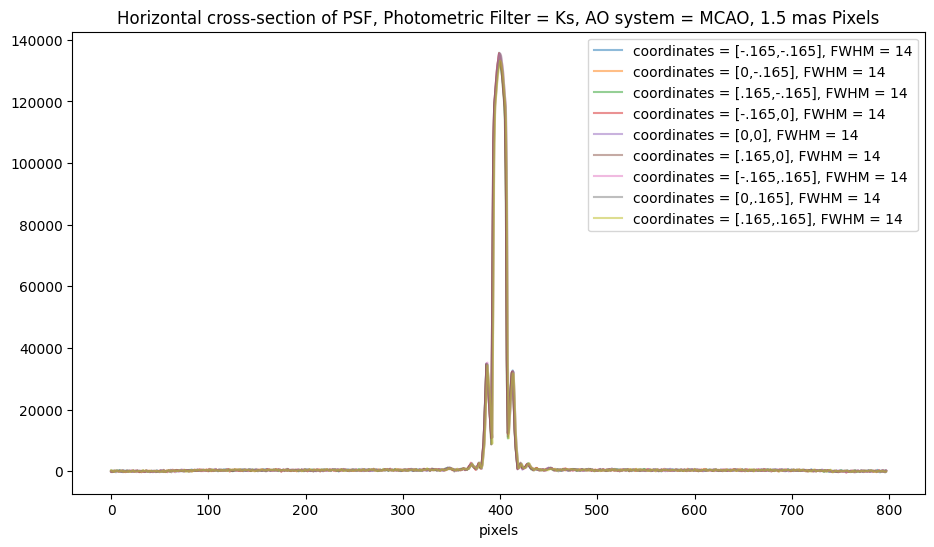

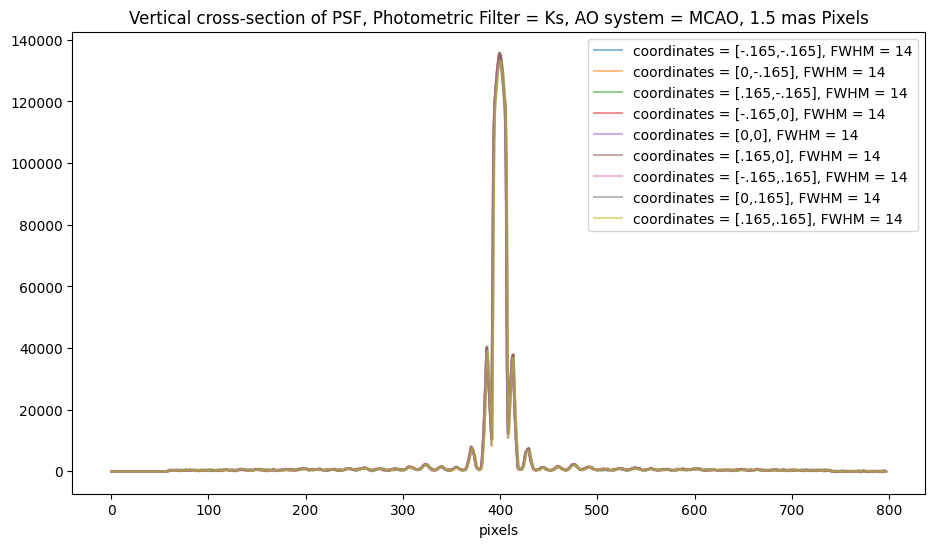

In [15]:
plot_PSFs(amp18_posp165_MCAO_15mashPSFs, "coordinates", ["[-.165,-.165]","[0,-.165]","[.165,-.165]","[-.165,0]","[0,0]","[.165,0]","[-.165,.165]","[0,.165]","[.165,.165]"], "H", "Ks", "MCAO", "1.5 mas")
plot_PSFs(amp18_posp165_MCAO_15masvPSFs, "coordinates", ["[-.165,-.165]","[0,-.165]","[.165,-.165]","[-.165,0]","[0,0]","[.165,0]","[-.165,.165]","[0,.165]","[.165,.165]"], "V", "Ks", "MCAO", "1.5 mas")
#plot_FWHM_vs_param(amps1627_fcY_fw1Y_fw2openhFWHMs, "magnitude", np.arange(16,28,1))
#plot_FWHM_vs_param(amps1627_fcY_fw1Y_fw2openvFWHMs,"magnitude", np.arange(16,28,1))

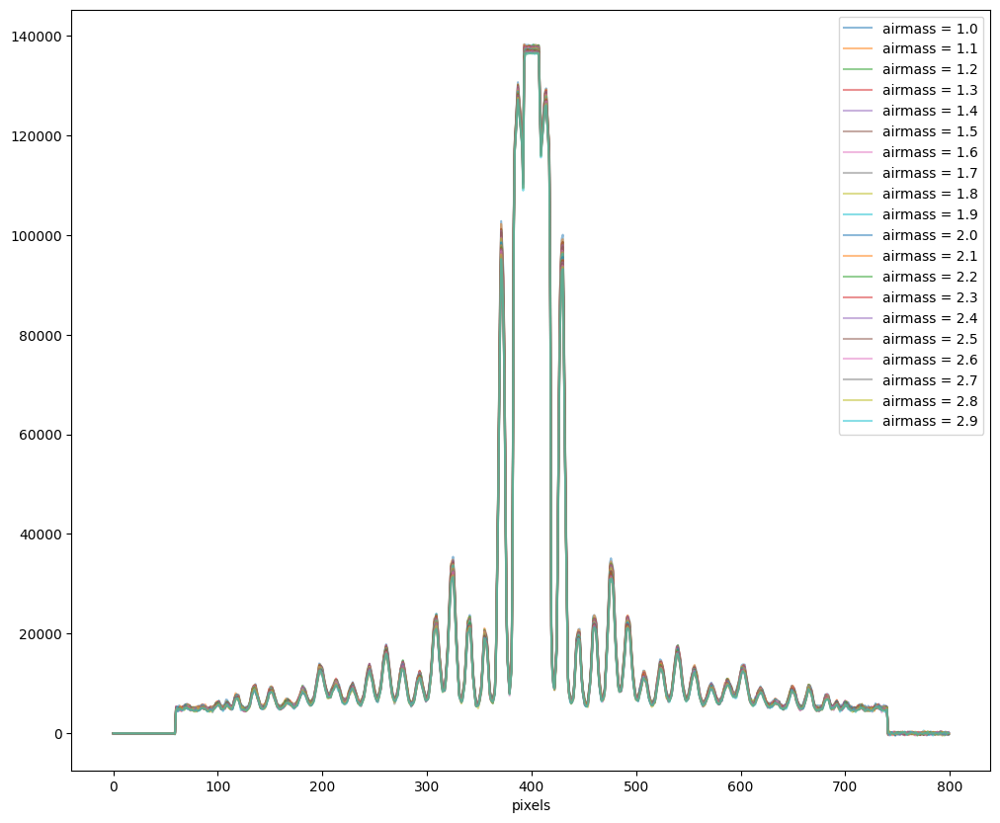

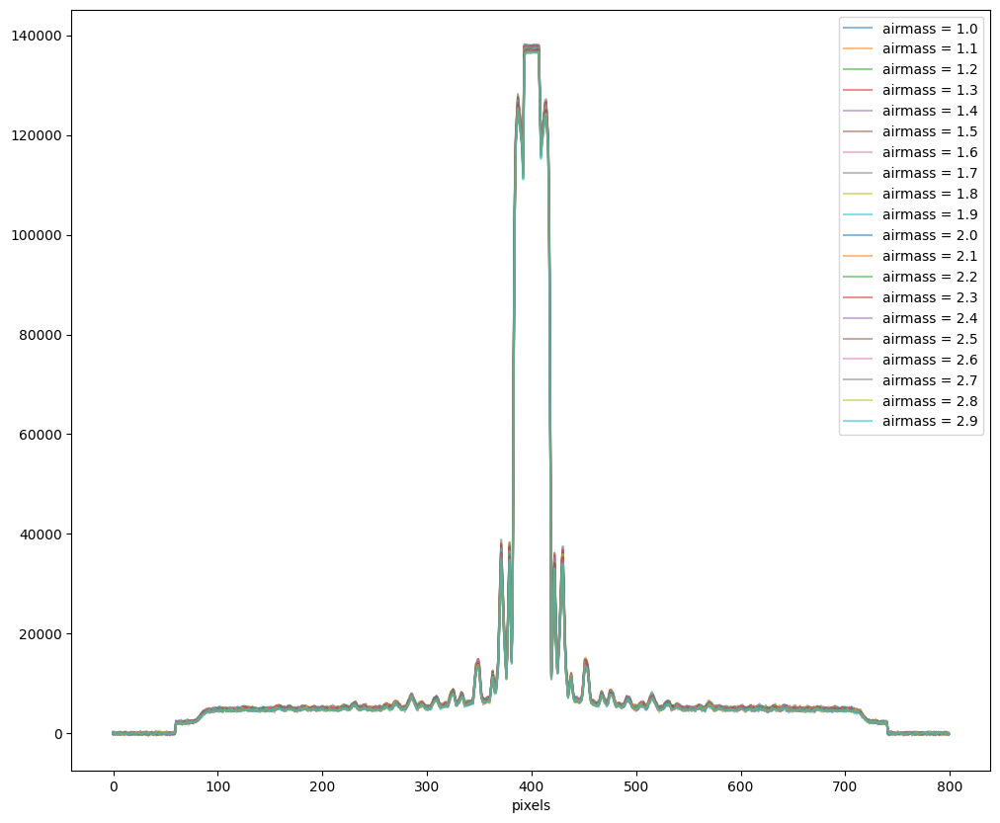

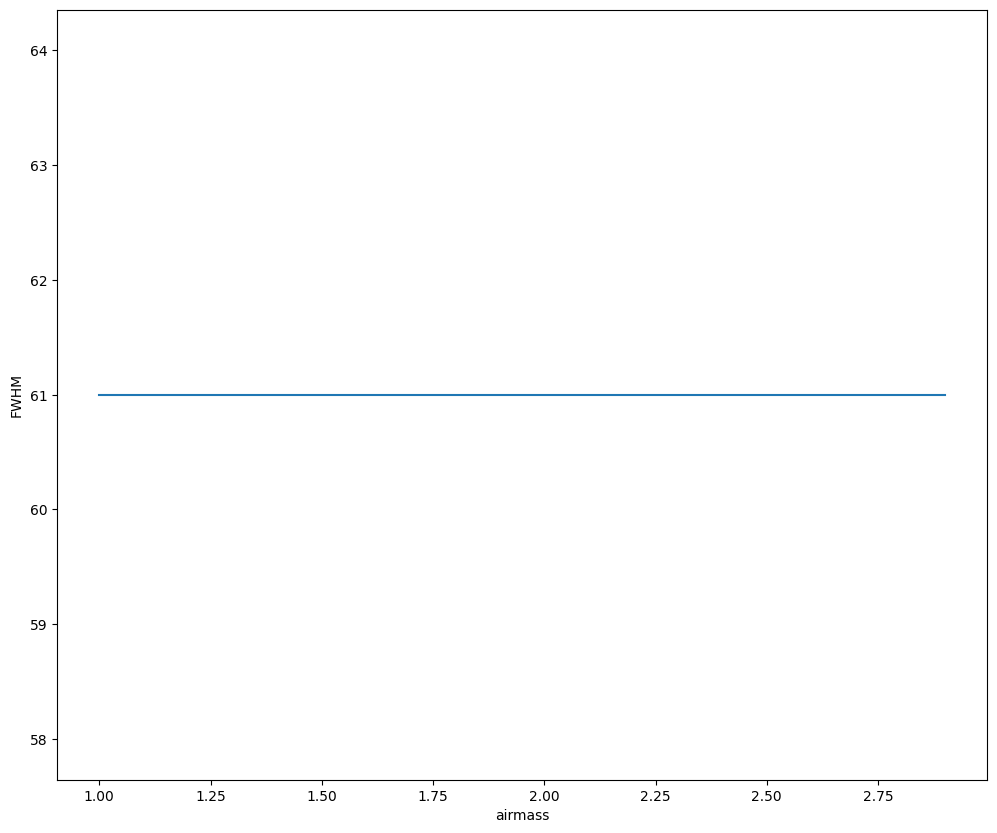

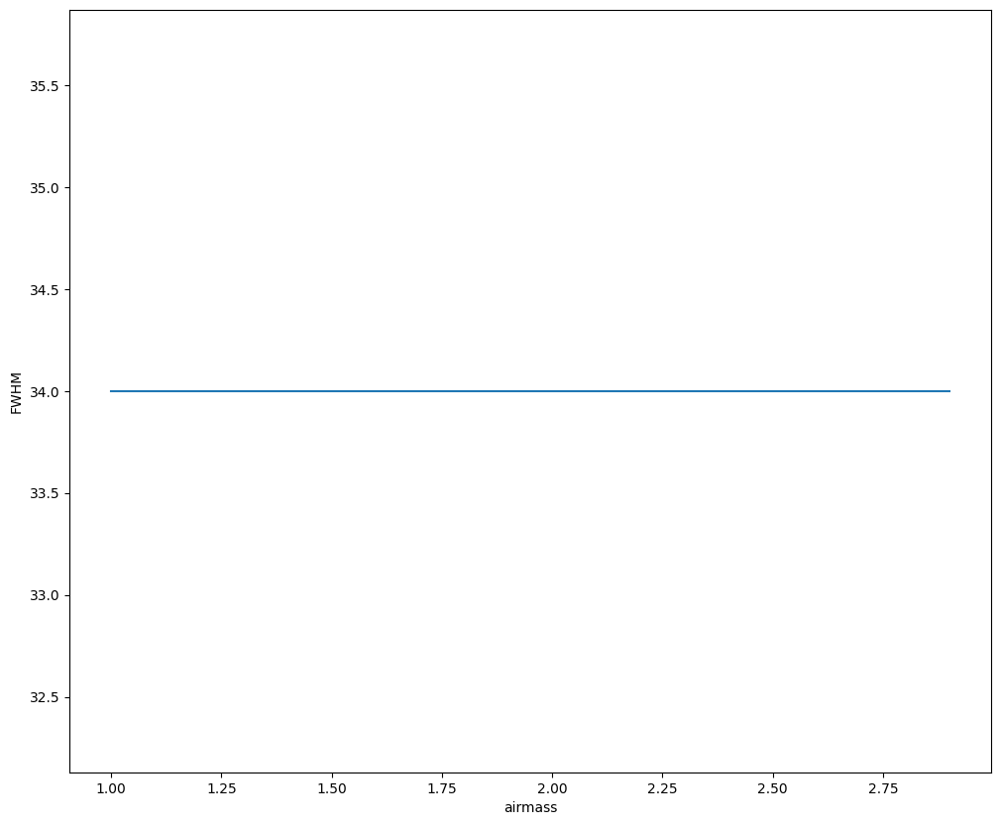

In [92]:
#plot_PSFs(airmassdefaultshPSFs, "airmass", np.arange(1,3,.1))
#plot_FWHM_vs_param(airmassdefaultshFWHMs, "airmass", np.arange(1,3,.1))
plot_PSFs(amp15airmassMCAO15masvPSFs, "airmass", np.arange(1,3,.1))
plot_PSFs(amp15airmassMCAO15mashPSFs, "airmass", np.arange(1,3,.1))
plot_FWHM_vs_param(amp15airmassMCAO15masvFWHMs, "airmass", np.arange(1,3,.1))
plot_FWHM_vs_param(amp15airmassMCAO15mashFWHMs, "airmass", np.arange(1,3,.1))

In [86]:
filelist = ["cluster_defaultstest_1_espt1000","cluster_humidity_1_espt1000","cluster_atm_1_espt1000","cluster_airmass_2.25_espt1000","cluster_temp_20_espt1000"]
plotnames = ["Default parameters", "Humidity = 1", "Air pressure = 1 atm", "Airmass = 2.25", "Temperature = 20 C"]

In [1]:
#plot_spec_set(filelist,plotnames)


In [4]:
#plot_spec_set(["cluster_defaultstest_1_espt1000","cluster_defaultstest_mcao_espt1000"],["scao","mcao"])

In [5]:
#plot_spec_set(["galellip2_espt1000","galellip2_SN1a_espt1000"],["galaxy without a SN", "galaxy WITH a SN"])

In [93]:
#reduce("galellip_defaults_espt1000","emptysky_espt1000")
#plot_img("galellip_defaults_espt1000")

In [6]:
#reduce("clustertest1_espt1000","emptysky_espt1000")

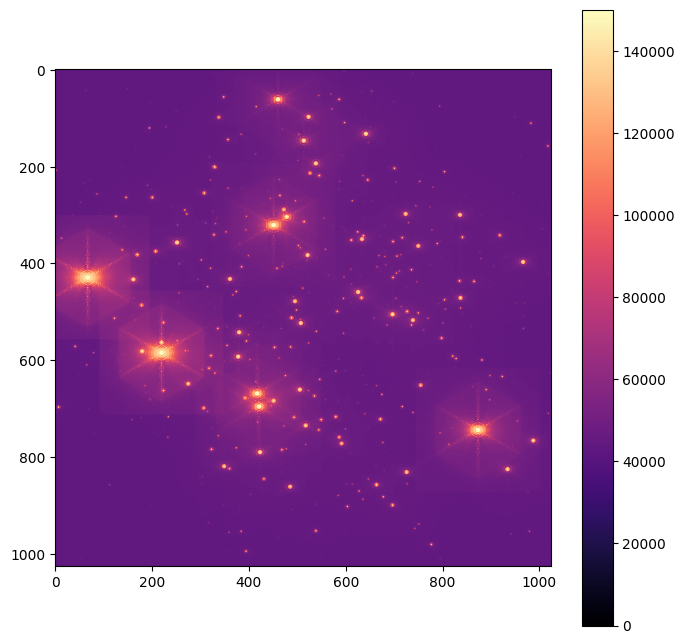

[[43745.5776125  44341.77342934 44283.69443936 ... 44134.6324855
  44168.99709998 43935.34044538]
 [44174.47943762 44027.28176598 44150.58022205 ... 44185.16795748
  44111.54177485 44144.09628463]
 [44187.12855578 44179.61822844 43978.16541817 ... 43930.1624138
  43969.42422229 44276.35455462]
 ...
 [44210.32820763 44053.2142139  44259.30769404 ... 43876.22877219
  44081.38412331 44050.65111787]
 [44081.01893112 44257.36626798 44414.45859371 ... 43820.18314226
  44009.60693673 44079.25547672]
 [43692.95999967 44012.85237429 44167.05624819 ... 44219.15792369
  44244.12615626 44194.57381022]]
1024


In [6]:
with fits.open(f'../fitsOutput/cluster_fw2_H_espt1000.fits') as file:
    image = file[1].data.copy()
    file.close()


fig, ax = plt.subplots(1,1, figsize=(8,8))
im = ax.imshow(image,cmap="magma",vmin=0,vmax=150000)
plt.colorbar(im, ax=ax)

plt.show() 

print(image)
print(len(image[0]))

x0 =  871  y0 =  743  R =  153


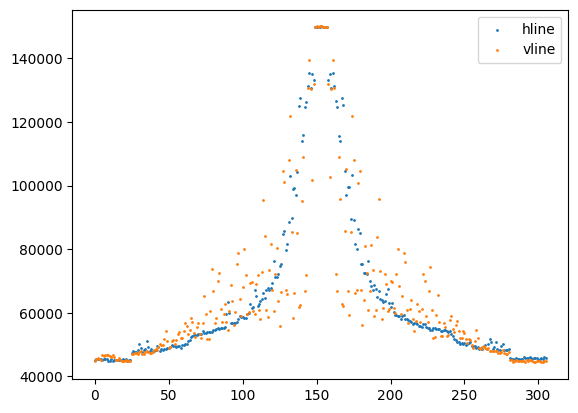

In [82]:
hline, vline = intensity_1D("cluster_fw2_H_espt1000", 743, 871, 200, "pixels")

plt.figure()

plt.scatter(range(0,len(hline)), hline, label="hline", s=1)
plt.scatter(range(0,len(vline)), vline, label="vline", s=1)
plt.legend()
plt.show()



In [90]:
hlineFWHM = FWHM(hline)
vlineFWHM = FWHM(vline)

 while loop 1, midlist0 =  132
 while loop 2, midlist1 =  174
peak is  150019.54303482216 , min is  44710.49421249484 , peak range is  [132, 174]
 while loop 1, midlist0 =  127
 while loop 2, midlist1 =  179
peak is  150024.20183043942 , min is  44357.74177492194 , peak range is  [127, 179]


x0 =  512  y0 =  962  R =  62


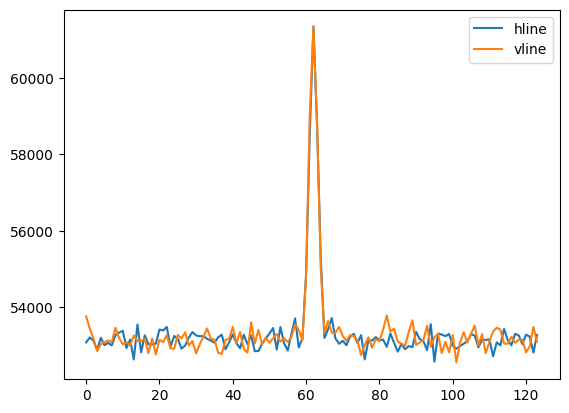

In [69]:
hline, vline = intensity_1D("novagrid_fw2_Ks_espt1000", 1.8, 0, .5,"4mas")
plt.figure()

plt.plot(range(0,len(hline)), hline, label="hline")
plt.plot(range(0,len(vline)), vline, label="vline")
plt.legend()
plt.show()


In [96]:
#plot_img("novagrid_fw2_Ks_espt1000")

In [94]:
#plot_spec("nova_withgal2_espt1000")

In [95]:
#plot_img("novagrid26_IMG_1.5mas_espt1000")

x0 =  577  y0 =  511  R =  100


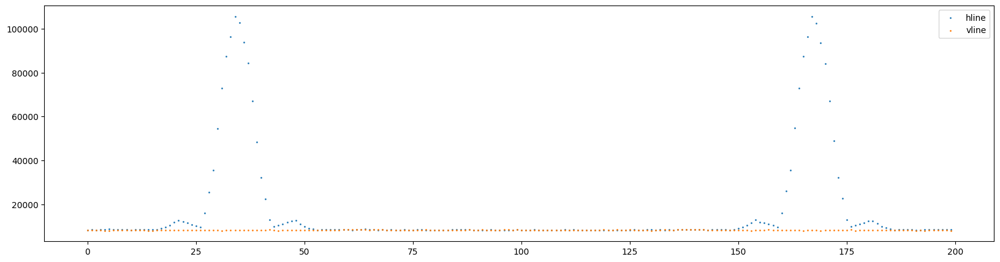

In [76]:
hline, vline = intensity_1D("novagrid26_IMG_1.5mas_espt1000", 511, 577, 100, "pixels")

plt.figure(figsize=[20,5])
plt.scatter(range(0,len(hline)), hline, label="hline", s = 1)
plt.scatter(range(0,len(vline)), vline, label="vline", s = 1)

#plt.xlim(195,340)
plt.legend()
plt.show()


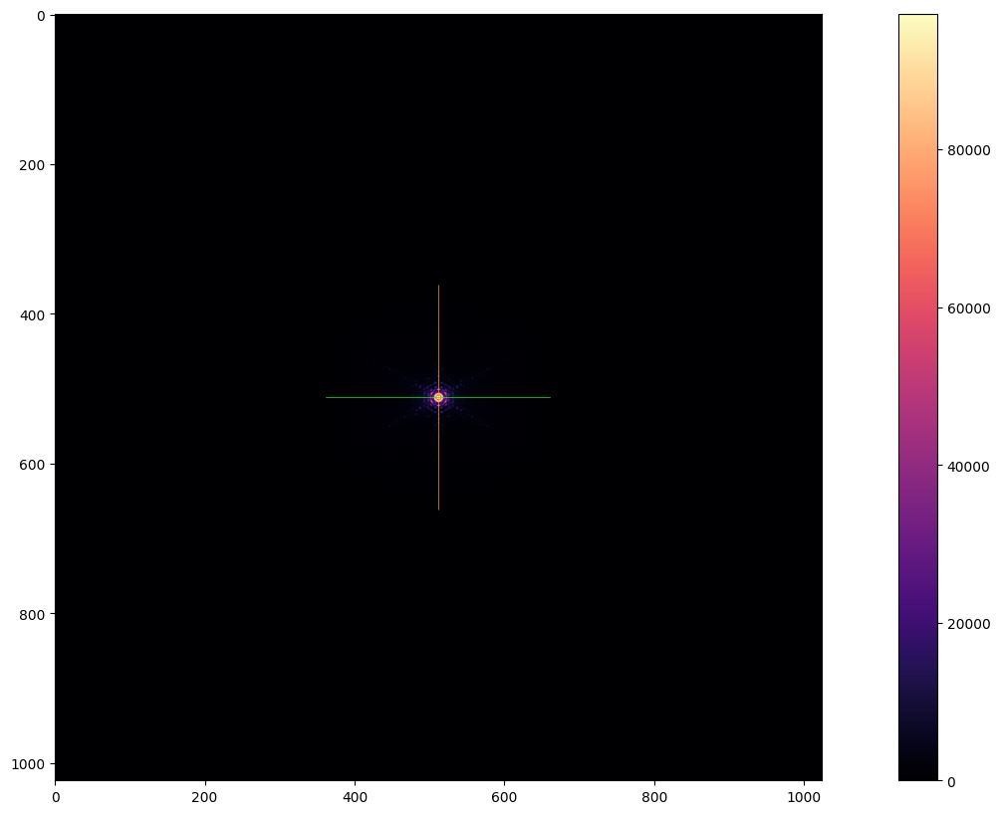

In [4]:
#ex18 = reduce("point18_Ks_IMG_4mas_SCAO_espt1000", "emptysky_espt1000")

x0 =  511  y0 =  511  R =  150
x0 =  511  y0 =  511  R =  150


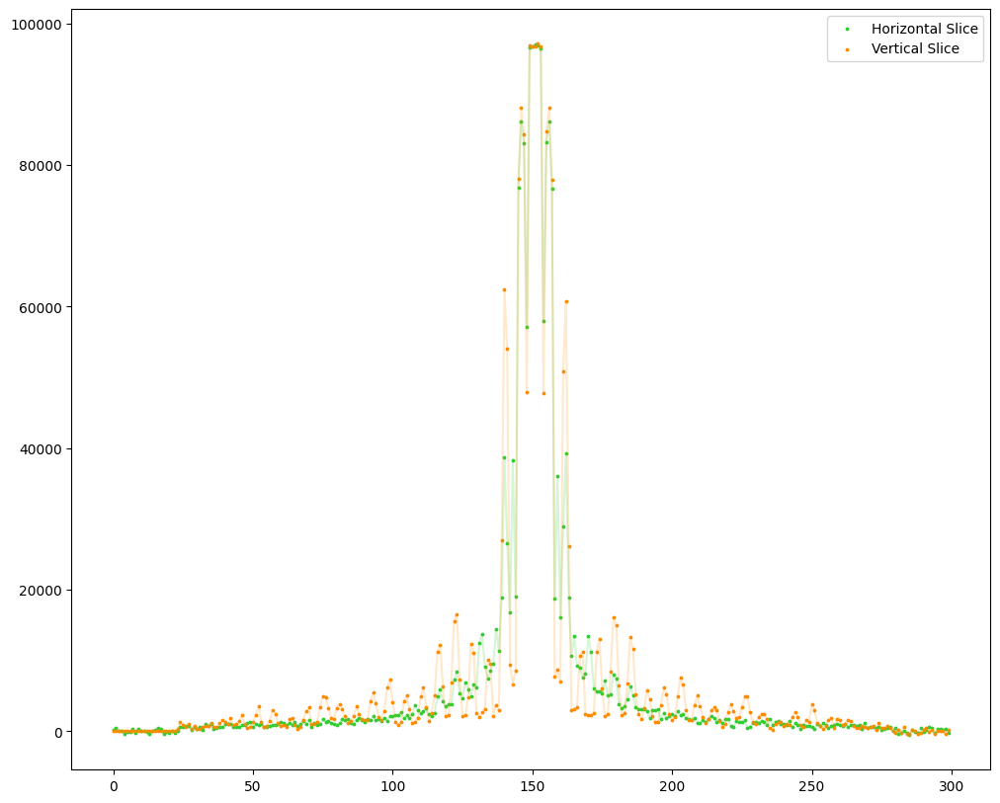

In [5]:
hline, vline = intensity_1D("point18_Ks_IMG_4mas_SCAO_espt1000", 511, 511, 150, "pixels")
hempty, vempty = intensity_1D("emptysky_espt1000",511, 511, 150, "pixels")
hdiff = [hline[i]-hempty[i] for i in range(len(hline))]
vdiff = [vline[i]-vempty[i] for i in range(len(vline))]


plt.figure(figsize=[12,10])
plt.scatter(range(0,len(hline)), hdiff, label="Horizontal Slice",s=3, color = 'limegreen')
plt.scatter(range(0,len(vline)), vdiff, label="Vertical Slice",s=3,color= 'darkorange')
plt.plot(range(0,len(hline)), hdiff, color = 'limegreen', alpha = 0.2)
plt.plot(range(0,len(vline)), vdiff, color= 'darkorange', alpha = 0.2)
plt.legend()
plt.show()

In [6]:
hFWHM = FWHM(hdiff)
vFWHM = FWHM(vdiff)

peak is  96988.83085714285 , min is  -548.788571428573 , peak range is  [145, 157]
peak is  97126.02799999999 , min is  -423.0982857142808 , peak range is  [140, 162]


In [7]:
print(hFWHM)
print(vFWHM)
print(max(ex18[511]))

12
22
96988.83085714285


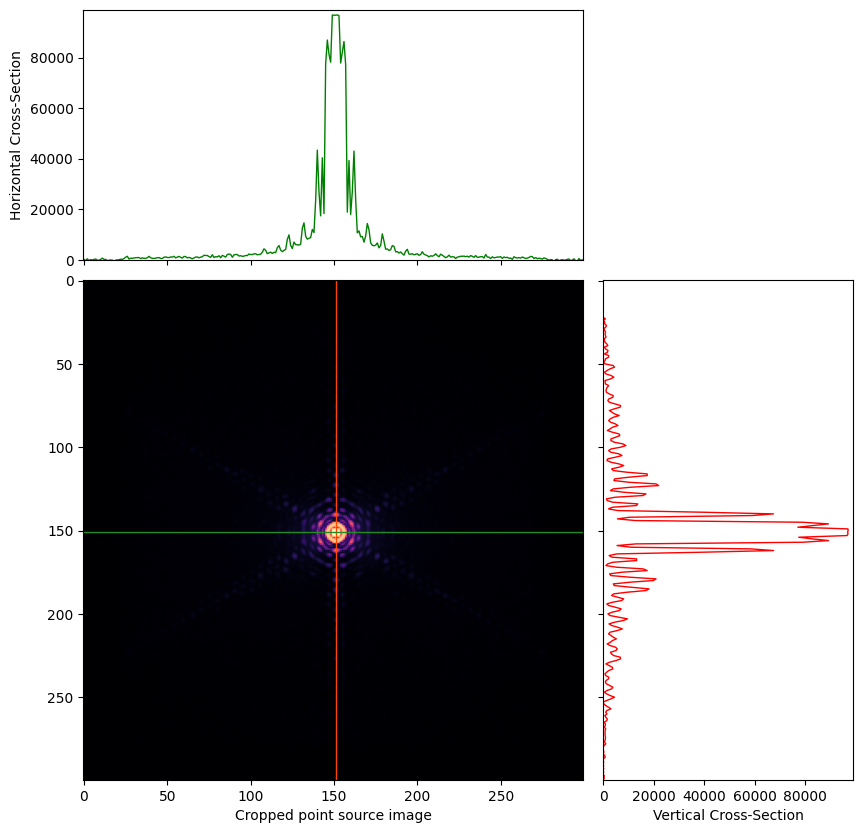

In [10]:
fig, main_ax = plt.subplots(figsize=(10, 10))
divider = make_axes_locatable(main_ax)
top_ax = divider.append_axes("top", 2.5, pad=0.2, sharex=main_ax)
right_ax = divider.append_axes("right", 2.5, pad=0.2, sharey=main_ax)

# make some labels invisible
top_ax.xaxis.set_tick_params(labelbottom=False)
right_ax.yaxis.set_tick_params(labelleft=False)

main_ax.set_xlabel('Cropped point source image')
#main_ax.set_ylabel('dim 2')
top_ax.set_ylabel('Horizontal Cross-Section')
right_ax.set_xlabel('Vertical Cross-Section')

z = ex18[361:661,361:661]
z_max = max(ex18[511])

cur_x = 151
cur_y = 151

main_ax.imshow(z,cmap="magma",vmin=0)
main_ax.autoscale(enable=False)
#plt.colorbar(main_ax.imshow(z,cmap="magma",vmin=0), ax=main_ax)
right_ax.autoscale(enable=False)
top_ax.autoscale(enable=False)
right_ax.set_xlim(right=z_max+2000)
top_ax.set_ylim(top=z_max+2000)
v_line = main_ax.axvline(cur_x, color='orangered',linewidth = 1)
h_line = main_ax.axhline(cur_y, color='forestgreen',linewidth = 1)
v_prof, = right_ax.plot(z[:,int(cur_x)],np.arange(len(z)), 'r-',linewidth = 1)
h_prof, = top_ax.plot(np.arange(len(z)),z[int(cur_y),:], 'g-',linewidth = 1)

plt.show()